In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

### Import Tables

a) Import table "sales.xlsx"

In [2]:
sales = pd.read_excel('sales.xlsx')
#sales.set_index('CustomerID', inplace = True)
sales

,CustomerID,Date_Adherence,Recency,MntMeat&Fish,MntEntries,MntVegan&Vegetarian,MntDrinks,MntDesserts,MntAdditionalRequests,NumOfferPurchases,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain
0,11054,2021-03-18 00:00:00,85.0,7230.0,1820,3435.0,1600.0,440.0,57.0,1,13,4,13,6,0
1,17117,2021-03-01 00:00:00,96.0,5850.0,320,2745.0,500.0,320.0,8.0,3,9,7,9,6,0
2,31751,2021-11-01 00:00:00,7.0,8380.0,0,1560.0,0.0,0.0,28.0,3,9,5,3,9,0
3,12947,2022-05-19 00:00:00,54.0,5090.0,280,2355.0,140.0,560.0,78.0,3,7,5,11,3,0
4,11402,2021-01-01 00:00:00,64.0,330.0,0,240.0,0.0,0.0,7.0,2,4,1,3,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7003,23699,2021-11-27 00:00:00,54.0,290.0,20,180.0,0.0,40.0,4.0,2,4,1,4,7,0
7004,23255,2021-03-25 00:00:00,27.0,230.0,80,525.0,20.0,80.0,23.0,3,5,1,3,8,0
7005,5798,2022-04-12 00:00:00,36.0,3050.0,2460,3840.0,1800.0,980.0,107.0,1,8,4,13,4,0
7006,16577,2020-09-01 00:00:00,49.0,20.0,200,90.0,160.0,0.0,14.0,1,3,2,2,8,1


b) Import table "crm.xlsx"

In [3]:
crm = pd.read_csv('crm.csv')
crm.set_index('CustomerID', inplace = True)
crm

,Name,Birthyear,Education,Marital_Status,Income,Kid_Younger6,Children_6to18
CustomerID,,,,,,,
14594,Miss Leah Lewis,1981,Graduation,Single,113947.0,0,0
19070,Miss Grace Black,1974,Graduation,Together,114297.0,0,0
29888,Mr. Gavin Morrison,1960,PhD,Together,115476.0,0,0
12221,Mr. Ryan Glover,1980,Graduation,Married,101172.0,1,1
21107,Mr. Paul Anderson,1971,HighSchool,Single,123128.0,0,0
...,...,...,...,...,...,...,...
30686,Mr. John Hughes,1994,PhD,Divorced,98968.0,0,0
17210,Mr. Brandon Simpson,1985,Graduation,Divorced,109977.0,0,0
29186,Mr. Thomas Churchill,1967,PhD,Together,56039.0,0,1


c) Import table "mkt.xlsx"

In [4]:
mkt = pd.read_csv('mkt.csv')
mkt[mkt.duplicated(subset= 'CustomerID', keep=False)]
mkt

,CustomerID,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5
0,31958,0,0,0,0,0
1,5387,0,0,0,0,0
2,32006,0,0,0,0,0
3,7511,0,0,0,0,0
4,12308,0,0,0,0,0
...,...,...,...,...,...,...
7018,22358,0,0,0,0,0
7019,29516,0,0,0,0,0
7020,18890,0,0,0,0,0
7021,30206,0,0,0,0,0


# 1. Basic Data Exploration

## 1.1. Table - "Sales"

d) Basic dataframe exploration

In [5]:
#sales.shape

In [6]:
#sales.columns

In [7]:
#sales.head(5)

In [8]:
#sales.tail(5)

In [9]:
#sales.info()

Variables Types:

- 6 float variables
- 8 integer variables
- 1 object variable

e) Dataframe Summary

In [10]:
#sales.describe()

- `count` we can see that the variable 'Recency' and 'MntDrinks' don't have the 7008 rows filled, this means we have a problem with NA's.
- Close relationship between Drinks, desserts and entries (Verysimilar location statistics)

f) Skewness

In [11]:
#sales.skew()

- `Moderate skewness` : NumAppPurchases  and NumStorePurchases
- `High skewness` : MntMeat&Fish, MntEntries, MntVegan&Vegetarian,MntDrinks,MntDesserts, MntAdditionalRequests, NumOfferPurchases, NumTakeAwayPurchases, NumAppVisitsMonth and   Complain

g) Kurtosis - (SIGNIFICADO!!!)

In [12]:
#sales.kurt()

`high Kurtosis (>3): `
 - MntEntries                
 - MntVegan&Vegetarian      
 - MntDrinks                 
 - MntDesserts               
 - MntAdditionalRequests    
 - NumOfferPurchases 
 - NumTakeAwayPurchases
 - NumAppVisitsMonth         
 - Complain  

In [13]:
sales.agg(['skew', 'kurtosis']).transpose()

C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\246556062.py:1: FutureWarning: ['Date_Adherence'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  sales.agg(['skew', 'kurtosis']).transpose()


,skew,kurtosis
CustomerID,0.001887,-1.209423
Recency,0.018672,-1.197328
MntMeat&Fish,1.148353,0.530668
MntEntries,2.087360,4.098391
MntVegan&Vegetarian,2.487460,8.437309
MntDrinks,2.046601,3.840276
MntDesserts,2.058003,3.812140
MntAdditionalRequests,1.827670,3.089818
NumOfferPurchases,2.859973,10.999646
NumAppPurchases,0.525233,-0.224521


### 1.1.1. Visual Exploration 

h) Histograms

Text(0.5, 1.0, 'NumAppVisitsMonth')

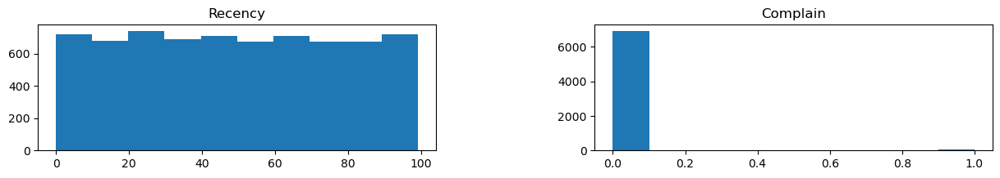

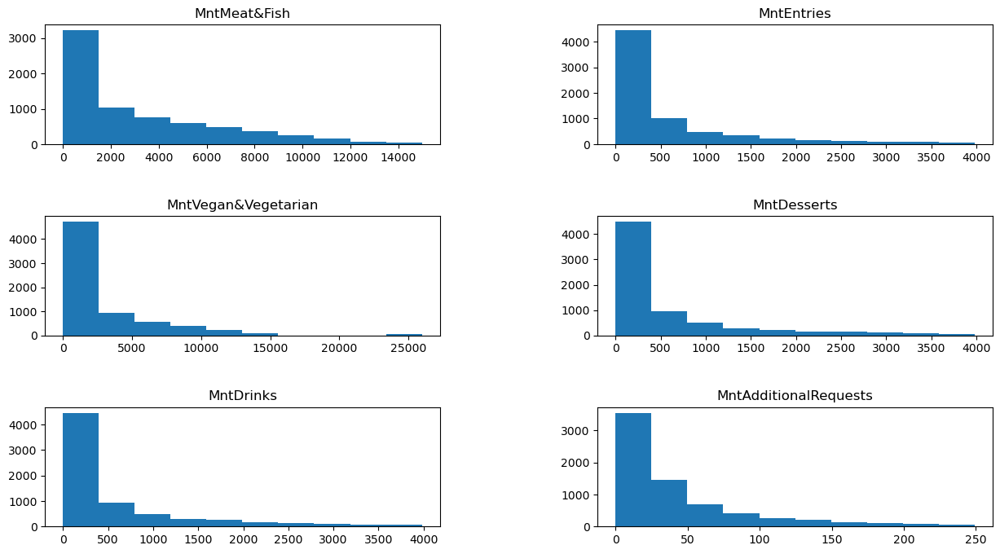

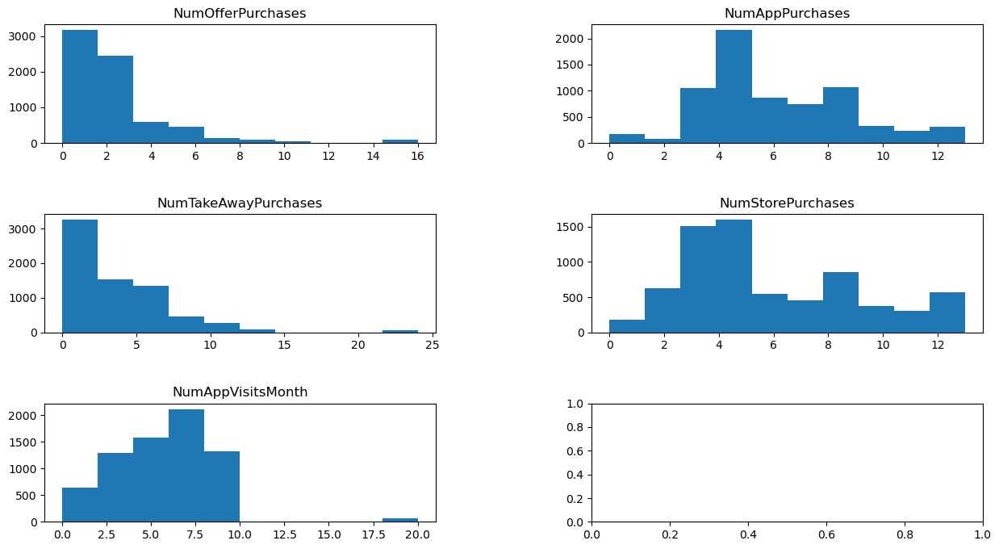

In [14]:
fig, [ax6,ax7] = plt.subplots(nrows=1, ncols = 2, figsize=(15,2)) 
fig.subplots_adjust(wspace=0.4, hspace=0.6) 
ax6.hist(sales['Recency'])
ax7.hist(sales['Complain'])

fig, [[ax0,ax1],[ax2,ax3],[ax4,ax5]] = plt.subplots(nrows=3, ncols = 2, figsize=(15,8)) 
fig.subplots_adjust(wspace=0.4, hspace=0.6) 
ax0.hist(sales['MntMeat&Fish'])
ax1.hist(sales['MntEntries'])
ax2.hist(sales['MntVegan&Vegetarian'])
ax3.hist(sales['MntDesserts'])
ax4.hist(sales['MntDrinks'])
ax5.hist(sales['MntAdditionalRequests'])

fig, [[ax8,ax9],[ax10,ax11],[ax12,ax13]] = plt.subplots(nrows=3, ncols = 2, figsize=(15,8))
fig.subplots_adjust(wspace=0.4, hspace=0.6) 
ax8.hist(sales['NumOfferPurchases'])            
ax9.hist(sales['NumAppPurchases'])          
ax10.hist(sales['NumTakeAwayPurchases'])   
ax11.hist(sales['NumStorePurchases'])        
ax12.hist(sales['NumAppVisitsMonth'])   

#TITULOS E LABELS
ax6.set_title ('Recency')
ax7.set_title ('Complain')
ax0.set_title('MntMeat&Fish')
ax1.set_title('MntEntries')
ax2.set_title('MntVegan&Vegetarian')
ax3.set_title('MntDesserts')
ax4.set_title('MntDrinks')
ax5.set_title('MntAdditionalRequests')
ax8.set_title('NumOfferPurchases')            
ax9.set_title('NumAppPurchases')          
ax10.set_title('NumTakeAwayPurchases')   
ax11.set_title('NumStorePurchases')        
ax12.set_title('NumAppVisitsMonth')

i) Correlograma

<AxesSubplot:>

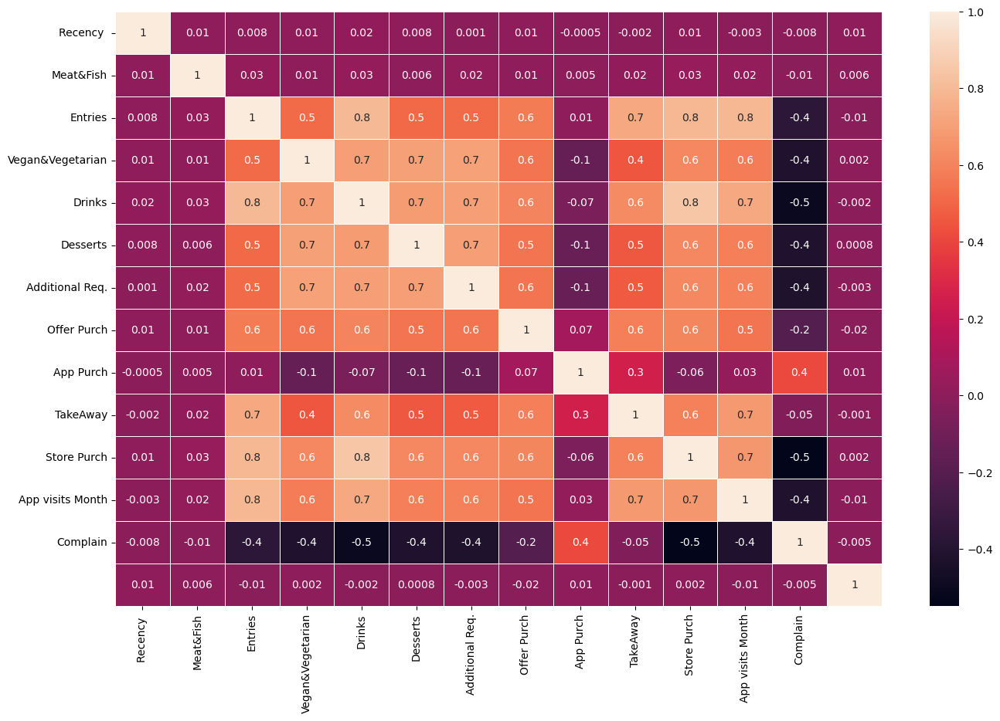

In [15]:
sales_corr = sales.corr(method = 'spearman')
figure = plt.figure(figsize=(16,10))


x_axis_labels = ['Recency ', 'Meat&Fish', 'Entries', 'Vegan&Vegetarian', 'Drinks', 'Desserts', 'Additional Req.',
                'Offer Purch','App Purch',  'TakeAway', 'Store Purch', 'App visits Month', 'Complain'] # labels for x-axis
y_axis_labels = ['Recency ', 'Meat&Fish', 'Entries', 'Vegan&Vegetarian', 'Drinks', 'Desserts', 'Additional Req.',
                'Offer Purch','App Purch',  'TakeAway', 'Store Purch', 'App visits Month', 'Complain'] # labels for y-axis

sns.heatmap(sales_corr, annot=True, fmt = '.1g', 
            xticklabels=x_axis_labels,yticklabels=y_axis_labels,
           linewidth=0.5)

 - Correlation coefficients whose magnitude are between 0.9 and 1.0 indicate variables which can be considered very highly correlated.
 - Correlation coefficients whose magnitude are between 0.7 and 0.9 indicate variables which can be considered highly correlated
 - Correlation coefficients whose magnitude are between 0.5 and 0.7 indicate variables which can be considered moderately correlated.
 - Correlation coefficients whose magnitude are between 0.3 and 0.5 indicate variables which have a low correlation.

 - `Recency`: has a low correlation with all of the variables
 - `Offer Purchases`: has a low correlation with all of the variables
 - `Complain`:has a low correlation with all of the variables
 - the rest of the variables atre all moderately correlated between each other.

## 1.2. Demographic Table - CRM 

In [16]:
crm.head()

,Name,Birthyear,Education,Marital_Status,Income,Kid_Younger6,Children_6to18
CustomerID,,,,,,,
14594,Miss Leah Lewis,1981,Graduation,Single,113947.0,0,0
19070,Miss Grace Black,1974,Graduation,Together,114297.0,0,0
29888,Mr. Gavin Morrison,1960,PhD,Together,115476.0,0,0
12221,Mr. Ryan Glover,1980,Graduation,Married,101172.0,1,1
21107,Mr. Paul Anderson,1971,HighSchool,Single,123128.0,0,0


In [17]:
crm.tail()

,Name,Birthyear,Education,Marital_Status,Income,Kid_Younger6,Children_6to18
CustomerID,,,,,,,
30686,Mr. John Hughes,1994,PhD,Divorced,98968.0,0,0
17210,Mr. Brandon Simpson,1985,Graduation,Divorced,109977.0,0,0
29186,Mr. Thomas Churchill,1967,PhD,Together,56039.0,0,1
23312,Miss Angela Murray,1989,Graduation,Single,44867.0,1,0
15581,Miss Diana Taylor,1960,Graduation,Single,124379.0,0,0


In [18]:
def get_stats(df):
    # Calculate mean, standard deviation, and median for each column
    means = df.mean()
    stds = df.std()
    medians = df.median()

    # Calculate mode for each column
    modes = df.mode().iloc[0]

    # Calculate min and max for each column
    mins = df.min()
    maxs = df.max()

    # Combine all statistics into a single DataFrame
    stats_df = pd.concat([means, stds, medians, modes, mins, maxs], axis=1)
    stats_df.columns = ['mean', 'std', 'median', 'mode', 'min', 'max']

    return stats_df

get_stats(crm)

C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\3706111263.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  means = df.mean()
C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\3706111263.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  stds = df.std()
C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\3706111263.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  medians = df.median()
C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_203

,mean,std,median,mode,min,max
Birthyear,1976.451429,11.996270,1977.0,1985.0,1948,2005
Income,77988.962407,35409.810253,77190.0,11000.0,2493.8,237639.725
Kid_Younger6,0.440571,0.543477,0.0,0.0,0,2
Children_6to18,0.490571,0.542174,0.0,0.0,0,2
Name,NaN,NaN,NaN,Mr. Alexander Lyman,Miss Abigail Alsop,Mrs. Zoe Smith
Education,NaN,NaN,NaN,Graduation,NaN,NaN
Marital_Status,NaN,NaN,NaN,Married,Divorced,widow


In [19]:
crm.describe()

,Birthyear,Income,Kid_Younger6,Children_6to18
count,7000.000000,7000.000000,7000.000000,7000.000000
mean,1976.451429,77988.962407,0.440571,0.490571
std,11.996270,35409.810253,0.543477,0.542174
min,1948.000000,2493.800000,0.000000,0.000000
25%,1967.000000,51586.250000,0.000000,0.000000
50%,1977.000000,77190.000000,0.000000,0.000000
75%,1985.000000,102016.250000,1.000000,1.000000
max,2005.000000,237639.725000,2.000000,2.000000


In [65]:
crm.shape

(7000, 9)

# 2. Data Cleaning & Pre-Processing & Initial Data Transformation

## 2.1. Table - "Sales"

j) Check for duplicates

In [66]:
#sales [sales.duplicated()]
sales.drop_duplicates(inplace= True)

k) Check for NAs & Fill NAs

In [67]:
#sales.isna().sum()

## Input "Recency" with the mean
sales.fillna({'Recency': sales['Recency'].mean()}, inplace = True)
#Turn "Recency" into integer
sales['Recency']= np.round(sales['Recency']).astype(int)

## Inpute "MntDrinks" using KNNInputer
#we are using this variables to inpute values because they have a correlation > 0.7
sales_products = sales[['MntDrinks','MntDesserts','MntEntries','MntVegan&Vegetarian']]

imputer = KNNImputer(n_neighbors=1)
array_impute = imputer.fit_transform(sales_products) # this is an array
sales_products = pd.DataFrame(array_impute, columns = sales_products.columns)

sales['MntDrinks'] = sales_products['MntDrinks'].values

l) check if there is negative values in the variables 

In [68]:
(sales [['Recency','Complain','MntMeat&Fish','MntEntries','MntVegan&Vegetarian',
      'MntDesserts','MntDrinks', 'MntAdditionalRequests','NumOfferPurchases','NumAppPurchases','NumTakeAwayPurchases',
      'NumStorePurchases', 'NumAppVisitsMonth']] < 0).sum()

Recency                  0
Complain                 0
MntMeat&Fish             0
MntEntries               0
MntVegan&Vegetarian      0
MntDesserts              0
MntDrinks                0
MntAdditionalRequests    0
NumOfferPurchases        0
NumAppPurchases          0
NumTakeAwayPurchases     0
NumStorePurchases        0
NumAppVisitsMonth        0
dtype: int64

m) check if `Recency = 99.0` is code for something

In [69]:
(sales [['Recency']] == 99).sum()

Recency    59
dtype: int64

In [70]:
sales_R99 =sales[sales["Recency"] == 99 ]
sales_R99

#Recency=99 doesn't seem a code 

,CustomerID,Date_Adherence,Recency,MntMeat&Fish,MntEntries,MntVegan&Vegetarian,MntDrinks,MntDesserts,MntAdditionalRequests,NumOfferPurchases,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain
111,30641,2022-06-27 00:00:00,99,4530.0,760,4185.0,2880.0,760.0,183.0,2,9,8,10,3,0
350,5156,2021-02-17 00:00:00,99,450.0,0,240.0,0.0,20.0,9.0,2,4,1,3,7,0
388,20438,2021-11-11 00:00:00,99,8300.0,240,4785.0,240.0,2040.0,63.0,2,7,5,10,2,0
408,14783,2022-05-26 00:00:00,99,7070.0,1140,4950.0,680.0,0.0,11.0,1,7,6,7,3,0
534,12848,2022-06-14 00:00:00,99,10.0,180,45.0,0.0,180.0,12.0,2,4,1,3,6,0
691,28967,2022-01-03 00:00:00,99,260.0,0,60.0,0.0,0.0,4.0,1,3,1,3,6,0
757,34463,2021-07-10 00:00:00,99,1638.0,1920,9390.0,480.0,480.0,24.0,1,7,9,4,2,0
765,10796,2022-02-12 00:00:00,99,550.0,0,90.0,20.0,0.0,4.0,2,3,2,3,5,0
984,17906,2022-03-31 00:00:00,99,13850.0,780,7710.0,380.0,380.0,19.0,0,9,7,7,4,0
1174,32612,2021-03-10 00:00:00,99,4710.0,1880,9495.0,2140.0,800.0,107.0,1,5,6,12,1,0


## 2.2. Demographic Table - "CRM"

### 2.2.1. Clean Data 

n) Check for duplicates

In [73]:
#crm[crm.duplicated()]

o) Check for NAs & Fill NAs

In [74]:
crm.isna().sum()

Name              0
Education         0
Marital_Status    0
Income            0
Kid_Younger6      0
Children_6to18    0
Age               0
age_group         4
Gender            0
dtype: int64

In [75]:
#crm.isnull().sum()

## Substitute missing values with the mode
crm['Education'] = crm['Education'].fillna(crm['Education'].mode()[0])

In [85]:
#multiple approaches:
#drop values
#ignore
#investigate

#let's investigate

check_missing=crm.isnull()
check_missing

,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age,age_group,Gender
CustomerID,,,,,,,,,
14594,False,False,False,False,False,False,False,False,False
19070,False,False,False,False,False,False,False,False,False
29888,False,False,False,False,False,False,False,False,False
12221,False,False,False,False,False,False,False,False,False
21107,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
30686,False,False,False,False,False,False,False,False,False
17210,False,False,False,False,False,False,False,False,False
29186,False,False,False,False,False,False,False,False,False


In [86]:
def get_missing_values_in_column(df, column):
    """
    Returns a list of the row indices that contain missing values in a certain column of a pandas DataFrame.

    Parameters:
    -----------
    df : pandas DataFrame
        The DataFrame to check for missing values.
    column : str
        The name of the column to check for missing values.

    Returns:
    --------
    list
        A list of the row indices that contain missing values in the specified column.
    """

    # Identify missing values in the specified column
    missing = df[column].isnull()

    # Get rows with missing values in the specified column
    missing_rows = df[missing].index.tolist()

    return missing_rows


missing_values_rows=get_missing_values_in_column(crm, 'Education')

In [87]:
missing_values_rows

[]

p) Consistency accross the variables/categories

In [88]:
## Putting everything upper case
crm['Education'] = crm['Education'].str.upper()
crm['Marital_Status']=crm['Marital_Status'].str.upper()

## Change together to married 
crm['Marital_Status'] = crm['Marital_Status'].replace('TOGETHER','MARRIED')
#crm['Marital_Status'].value_counts()

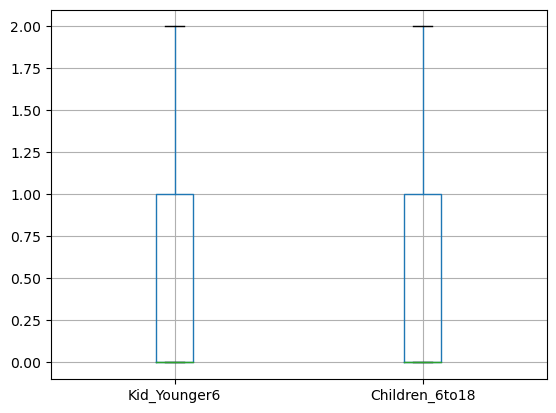

In [90]:
#OUTLIERS (PRELIMINARY)- CHECKING FOR INCONSISTENT VALUES

import matplotlib.pyplot as plt


kids=crm.boxplot(column=['Kid_Younger6', 'Children_6to18'])
kids.plot()
plt.show()
#everything seems normal 

,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age,age_group,Gender
CustomerID,,,,,,,,,
14594,Miss Leah Lewis,GRADUATION,SINGLE,113947.0,0,0,42,35-45,1
19070,Miss Grace Black,GRADUATION,MARRIED,114297.0,0,0,49,45-65,1
29888,Mr. Gavin Morrison,PHD,MARRIED,115476.0,0,0,63,45-65,0
12221,Mr. Ryan Glover,GRADUATION,MARRIED,101172.0,1,1,43,35-45,0
21107,Mr. Paul Anderson,HIGHSCHOOL,SINGLE,123128.0,0,0,52,45-65,0
...,...,...,...,...,...,...,...,...,...
30686,Mr. John Hughes,PHD,DIVORCED,98968.0,0,0,29,25-35,0
17210,Mr. Brandon Simpson,GRADUATION,DIVORCED,109977.0,0,0,38,35-45,0
29186,Mr. Thomas Churchill,PHD,MARRIED,56039.0,0,1,56,45-65,0


In [316]:
## Convert the "Birthyear" to an 'Age' column
import datetime

#calculate the current year
current_year = datetime.datetime.now().year

#create a new column 'Age' by subtracting birth_year from current year
crm['Age'] = current_year - crm['Birthyear']

# drop
crm = crm.drop('Birthyear', axis=1)
crm

KeyError: 'Birthyear'

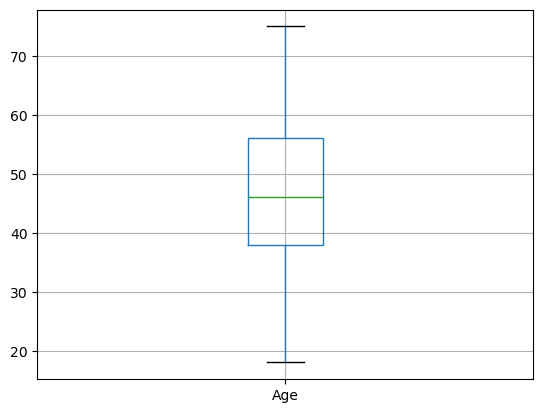

In [84]:
birthyear=crm.boxplot(column='Age')
birthyear.plot()
plt.show()
plt.show()
#everything seems normal 

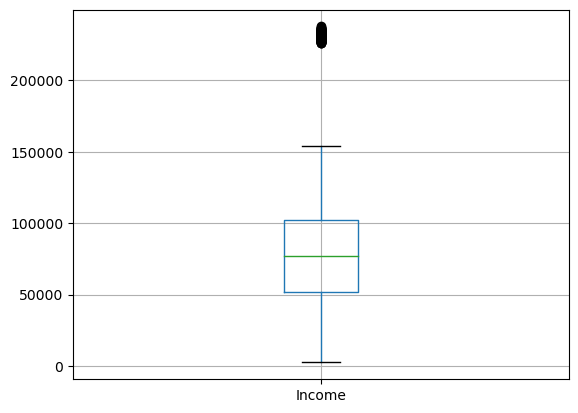

In [43]:
income=crm.boxplot(column='Income')
income.plot()
plt.show()
plt.show()
#investigate higher values

In [44]:
crm['Income'].nlargest(100)

CustomerID
19586    237639.725
15638    237322.825
26432    236745.625
31208    236316.125
33947    236287.625
            ...    
10574    147813.000
10271    146428.000
6983     145675.000
23627    144949.000
10184    144873.000
Name: Income, Length: 100, dtype: float64

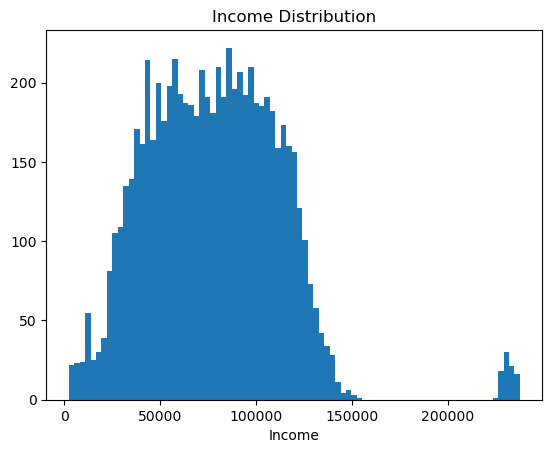

In [45]:
plt.hist(crm['Income'], bins=83)
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('')
plt.show()

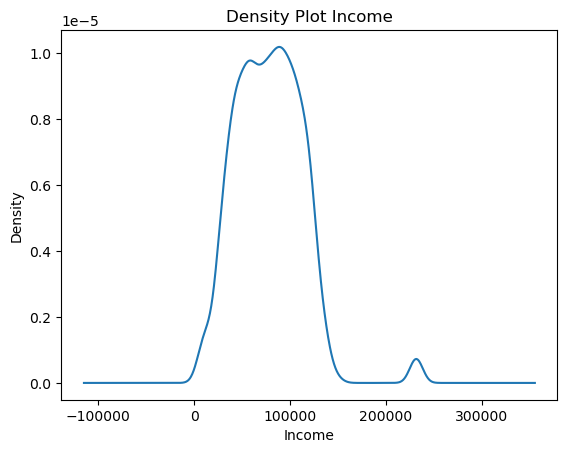

In [46]:
crm['Income'].plot.kde()

plt.title('Density Plot Income')
plt.xlabel('Income')
plt.ylabel('Density')

plt.show()

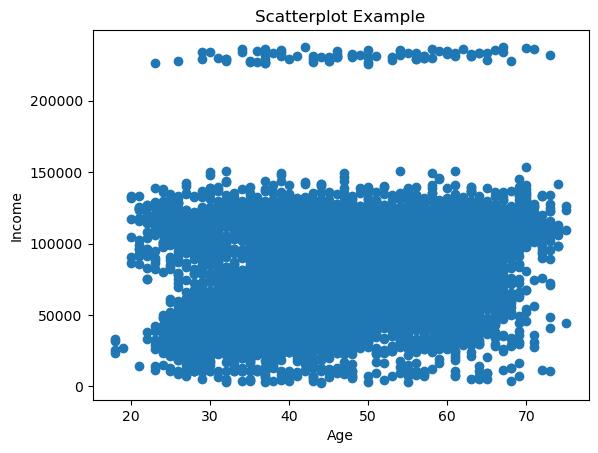

In [47]:
#What to do with income outliers? TBD

#RELATIONSHIPS

#BIRTHYEAR AND INCOME

plt.scatter(crm['Age'], crm['Income'])

plt.xlabel('Age')
plt.ylabel('Income')
plt.title('Scatterplot Example')

plt.show()

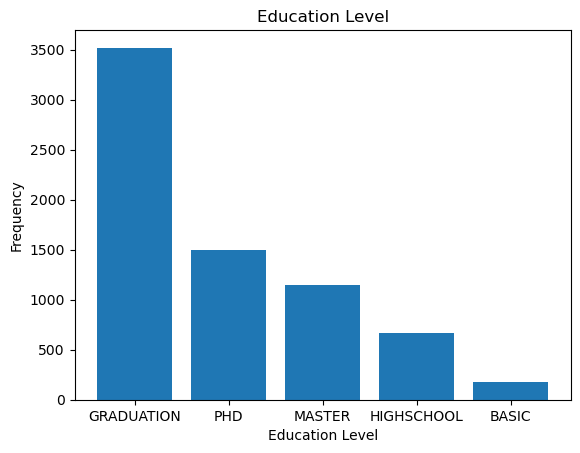

In [48]:
freq_dist = crm['Education'].value_counts()

plt.bar(freq_dist.index, freq_dist.values)

plt.xlabel('Education Level')
plt.ylabel('Frequency')
plt.title('Education Level')

plt.show()

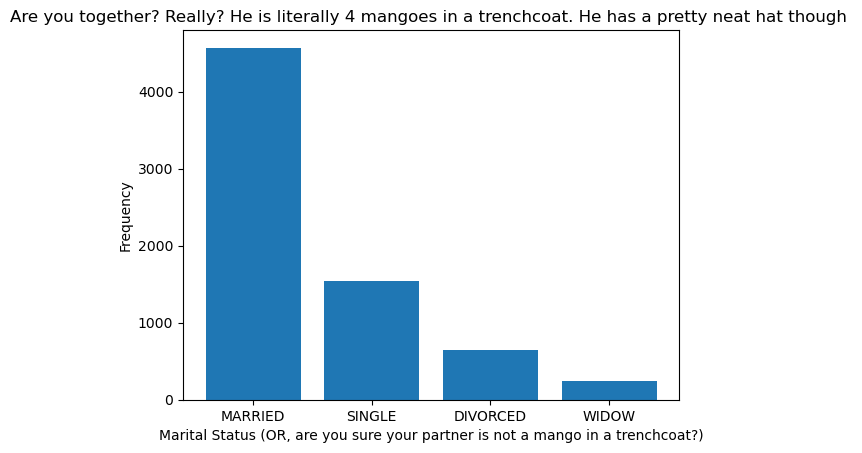

In [49]:
freq_dist = crm['Marital_Status'].value_counts()

plt.bar(freq_dist.index, freq_dist.values)

plt.xlabel('Marital Status (OR, are you sure your partner is not a mango in a trenchcoat?)')
plt.ylabel('Frequency')
plt.title('Are you together? Really? He is literally 4 mangoes in a trenchcoat. He has a pretty neat hat though ')
plt.show()

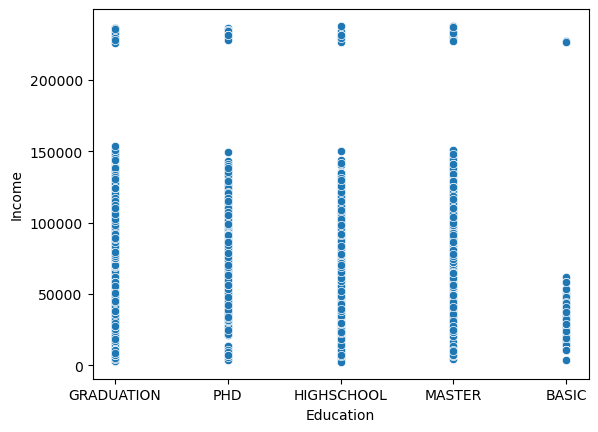

In [50]:
# Create a scatterplot with categorical variable on x-axis and quantitative variable on y-axis
sns.scatterplot(x=crm['Education'], y=crm['Income'], data=crm)

# Show the plot
plt.show()

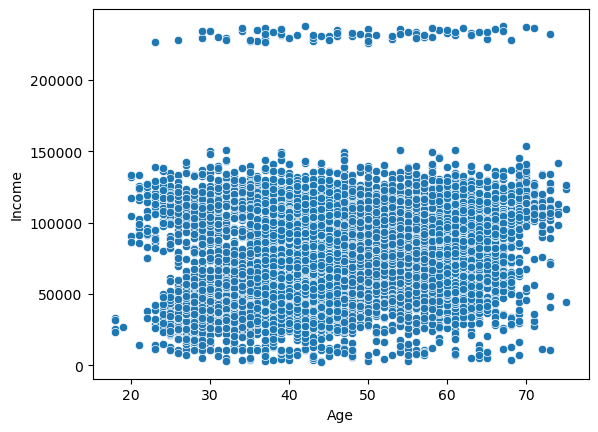

In [51]:
# Create a scatterplot with categorical variable on x-axis and quantitative variable on y-axis
sns.scatterplot(x=crm['Age'], y=crm['Income'], data=crm)

# Show the plot
plt.show()

In [52]:
def check(column):
    #checks if there are any values on a numeric column that are non numeric, and tells you which values
    result=[]
    for i in crm[column].unique():
        if not pd.api.types.is_numeric_dtype(i):
            result.append(i)
    return result
check('Income')

[]

In [53]:
crm

,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age
CustomerID,,,,,,,
14594,Miss Leah Lewis,GRADUATION,SINGLE,113947.0,0,0,42
19070,Miss Grace Black,GRADUATION,MARRIED,114297.0,0,0,49
29888,Mr. Gavin Morrison,PHD,MARRIED,115476.0,0,0,63
12221,Mr. Ryan Glover,GRADUATION,MARRIED,101172.0,1,1,43
21107,Mr. Paul Anderson,HIGHSCHOOL,SINGLE,123128.0,0,0,52
...,...,...,...,...,...,...,...
30686,Mr. John Hughes,PHD,DIVORCED,98968.0,0,0,29
17210,Mr. Brandon Simpson,GRADUATION,DIVORCED,109977.0,0,0,38
29186,Mr. Thomas Churchill,PHD,MARRIED,56039.0,0,1,56


In [92]:
pd.crosstab(crm['Education'], crm['Gender'])

Gender,0,1
Education,,
BASIC,125,54
GRADUATION,2570,948
HIGHSCHOOL,484,181
MASTER,856,286
PHD,1098,398


In [93]:
pd.crosstab(crm['Education'], crm['Marital_Status'])

Marital_Status,DIVORCED,MARRIED,SINGLE,WIDOW
Education,,,,
BASIC,12,113,51,3
GRADUATION,311,2283,815,109
HIGHSCHOOL,57,425,170,13
MASTER,114,768,212,48
PHD,151,983,290,72


In [94]:
# defining Age groups 
bins = [18, 25, 35, 45, 65,100] # define age groups
labels = ['18-25', '25-35','35-45', '45-65', '65+'] # define the labels for each age group, as INE does 
crm['age_group'] = pd.cut(crm['Age'], bins=bins, labels=labels) # add a new column with the age groups
crm

,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age,age_group,Gender
CustomerID,,,,,,,,,
14594,Miss Leah Lewis,GRADUATION,SINGLE,113947.0,0,0,42,35-45,1
19070,Miss Grace Black,GRADUATION,MARRIED,114297.0,0,0,49,45-65,1
29888,Mr. Gavin Morrison,PHD,MARRIED,115476.0,0,0,63,45-65,0
12221,Mr. Ryan Glover,GRADUATION,MARRIED,101172.0,1,1,43,35-45,0
21107,Mr. Paul Anderson,HIGHSCHOOL,SINGLE,123128.0,0,0,52,45-65,0
...,...,...,...,...,...,...,...,...,...
30686,Mr. John Hughes,PHD,DIVORCED,98968.0,0,0,29,25-35,0
17210,Mr. Brandon Simpson,GRADUATION,DIVORCED,109977.0,0,0,38,35-45,0
29186,Mr. Thomas Churchill,PHD,MARRIED,56039.0,0,1,56,45-65,0


In [95]:
pd.crosstab(crm['Education'], crm['age_group'])

age_group,18-25,25-35,35-45,45-65,65+
Education,,,,,
BASIC,21,77,50,26,1
GRADUATION,92,619,1137,1534,136
HIGHSCHOOL,43,168,203,236,15
MASTER,13,143,339,543,104
PHD,8,176,395,754,163


In [96]:
pd.crosstab(crm['Kid_Younger6'], crm['Education'])

Education,BASIC,GRADUATION,HIGHSCHOOL,MASTER,PHD
Kid_Younger6,,,,,
0,50,2069,348,671,949
1,121,1367,299,436,519
2,8,82,18,35,28


In [97]:
pd.crosstab(crm['Children_6to18'], crm['Education'])

Education,BASIC,GRADUATION,HIGHSCHOOL,MASTER,PHD
Children_6to18,,,,,
0,167,1849,395,586,723
1,12,1591,260,527,736
2,0,78,10,29,37


In [98]:
## Check for all unique prefixes, we extract the first 4 letters of each name

crm['First 4 Letters'] = crm['Name'].str.slice(stop=4)

# get the unique combinations of the first 5 letters
unique_combinations = crm['First 4 Letters'].unique()

# print the unique combinations
print(unique_combinations)

crm['Name'].isnull().any()

#Now, we do the encoding. If the first 4 characters contain any variation of mrs or miss, we substitute the name by 1
#if it's any variation of 'mr.' we substitute by 0

# create a copy of the 'Name' column
crm['Gender'] = crm['Name']

# replace 'Miss' or 'Mrs.' with 1 and 'Mr.' with 0 in the 'Gender' column
crm.loc[crm['Gender'].str.contains(r'^((M|m)iss|(M|m)rs\.)', na=False), 'Gender'] = 1
crm.loc[crm['Gender'].str.contains(r'^(Mr\.|(M|m)r)', na=False), 'Gender'] = 0

# convert the 'Gender' column to integer type
crm['Gender'] = crm['Gender'].astype(float).fillna(0).astype(int)

#check new column
crm['Gender']

crm = crm.drop(columns=['First 4 Letters'])

['Miss' 'Mr. ' 'Mrs.']


C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\2301189711.py:20: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  crm.loc[crm['Gender'].str.contains(r'^((M|m)iss|(M|m)rs\.)', na=False), 'Gender'] = 1
C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\2301189711.py:21: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  crm.loc[crm['Gender'].str.contains(r'^(Mr\.|(M|m)r)', na=False), 'Gender'] = 0


In [99]:
pd.crosstab(crm['Gender'], crm['age_group'])

age_group,18-25,25-35,35-45,45-65,65+
Gender,,,,,
0,106,834,1608,2274,309
1,71,349,516,819,110


In [100]:
income_ktsis=crm['Income'].kurtosis()
income_ktsis

2.649035217952049

<h2>Aggregates<h2>

In [101]:
crm.groupby('Marital_Status').agg({'Income': ['mean', 'std','max','min']})

Income                                  
                        mean           std         max     min
Marital_Status                                                
DIVORCED        81221.038992  37463.428582  235129.425  2493.8
MARRIED         77772.016147  35148.730621  237639.725  3005.4
SINGLE          75706.768238  34940.770042  233887.325  3550.0
WIDOW           87855.099286  35611.402827  236745.625  7174.7

In [102]:
crm.groupby(['Kid_Younger6']).agg({'Income': ['mean', 'std','max','min']})

Income                                  
                      mean           std         max     min
Kid_Younger6                                                
0             92348.276872  31863.532884  237639.725  3005.4
1             57699.110941  29662.500323  235245.525  2493.8
2             60142.497515  33394.790824  228750.025  4609.6

In [103]:
crm.groupby(['Children_6to18']).agg({'Income': ['mean', 'std','max','min']})

Income                                  
                        mean           std         max     min
Children_6to18                                                
0               77269.154859  40511.089285  237639.725  2493.8
1               78927.742498  28670.515331  235245.525  3909.6
2               76320.504708  25365.538093  232427.925  4901.4

In [104]:
crm['Kid_Younger6'].value_counts()[0]

4087

### 2.2.2. Add useful variables (data transformation)

q) Add column with gender - dummy variable - easier to read

In [105]:
## Check for all unique prefixes, we extract the first 4 letters of each name

crm['First 4 Letters'] = crm['Name'].str.slice(stop=4)

# get the unique combinations of the first 5 letters
unique_combinations = crm['First 4 Letters'].unique()

# print the unique combinations
print(unique_combinations)

crm['Name'].isnull().any()

#Now, we do the encoding. If the first 4 characters contain any variation of mrs or miss, we substitute the name by 1
#if it's any variation of 'mr.' we substitute by 0

# create a copy of the 'Name' column
crm['Gender'] = crm['Name']

# replace 'Miss' or 'Mrs.' with 1 and 'Mr.' with 0 in the 'Gender' column
crm.loc[crm['Gender'].str.contains(r'^((M|m)iss|(M|m)rs\.)', na=False), 'Gender'] = 1
crm.loc[crm['Gender'].str.contains(r'^(Mr\.|(M|m)r)', na=False), 'Gender'] = 0

# convert the 'Gender' column to integer type
crm['Gender'] = crm['Gender'].astype(float).fillna(0).astype(int)

#check new column
crm['Gender']

crm = crm.drop(columns=['First 4 Letters'])

['Miss' 'Mr. ' 'Mrs.']


C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\2301189711.py:20: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  crm.loc[crm['Gender'].str.contains(r'^((M|m)iss|(M|m)rs\.)', na=False), 'Gender'] = 1
C:\Users\HLX_IT_2.DOMPEDRO\AppData\Local\Temp\ipykernel_20324\2301189711.py:21: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  crm.loc[crm['Gender'].str.contains(r'^(Mr\.|(M|m)r)', na=False), 'Gender'] = 0


r) Transform "Birthyear" into "Age"

In [107]:
## Convert the "Birthyear" to an 'Age' column
import datetime

#calculate the current year
current_year = datetime.datetime.now().year

#create a new column 'Age' by subtracting birth_year from current year
crm['Age'] = current_year - crm['Birthyear']

# drop
crm = crm.drop('Birthyear', axis=1)
crm

KeyError: 'Birthyear'

In [108]:
# defining Age groups
bins = [18, 25, 35, 45, 65,100] # define age groups
labels = ['18-25', '25-35','35-45', '45-65', '65+'] # define the labels for each age group, as INE does 
crm['age_group'] = pd.cut(crm['Age'], bins=bins, labels=labels) # add a new column with the age groups
crm

,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age,age_group,Gender
CustomerID,,,,,,,,,
14594,Miss Leah Lewis,GRADUATION,SINGLE,113947.0,0,0,42,35-45,1
19070,Miss Grace Black,GRADUATION,MARRIED,114297.0,0,0,49,45-65,1
29888,Mr. Gavin Morrison,PHD,MARRIED,115476.0,0,0,63,45-65,0
12221,Mr. Ryan Glover,GRADUATION,MARRIED,101172.0,1,1,43,35-45,0
21107,Mr. Paul Anderson,HIGHSCHOOL,SINGLE,123128.0,0,0,52,45-65,0
...,...,...,...,...,...,...,...,...,...
30686,Mr. John Hughes,PHD,DIVORCED,98968.0,0,0,29,25-35,0
17210,Mr. Brandon Simpson,GRADUATION,DIVORCED,109977.0,0,0,38,35-45,0
29186,Mr. Thomas Churchill,PHD,MARRIED,56039.0,0,1,56,45-65,0


## 2.3. Marketing Table - "mkt.xlsx"

### 2.3.1. Data Cleaning

s) Check for duplicates

In [109]:
#mkt[mkt.duplicated()]

t) Check for NAs & Fill NAs

In [110]:
#mkt.isna().sum()

In [111]:
#Renaming columns (campain)
mkt.rename(columns ={"Response_Cmp1" : "Cmp1", "Response_Cmp2" : "Cmp2",
                        "Response_Cmp3": "Cmp3", "Response_Cmp4" : "Cmp4",
                        "Response_Cmp5" : "Cmp5"}, inplace= True )

## 2.4. Merge all tables

u) Merge all tables

In [112]:
df = pd.merge(sales, crm, on='CustomerID')

In [113]:
df= pd.merge(df, mkt, on='CustomerID')

In [114]:
df.set_index('CustomerID', inplace = True)

v) Check for duplicates & and drop

In [115]:
#df[df.duplicated()]
df.drop_duplicates(inplace= True)

## 2.5. Outliers

- 1st There are variable with high Kurtosis, witch means there may be outliers;
- 2st see if exists outliers through histograms;
- If the outliers represent less than 3% drop observations;

Note: We will only drop outliers from variables that where included in the clusterings processes (done in all perspectives 1,2,3)

#### Perspective 1

w) Histograms of clustering variables in the 1st Perspective

Text(0.5, 1.0, 'MntAdditionalRequests')

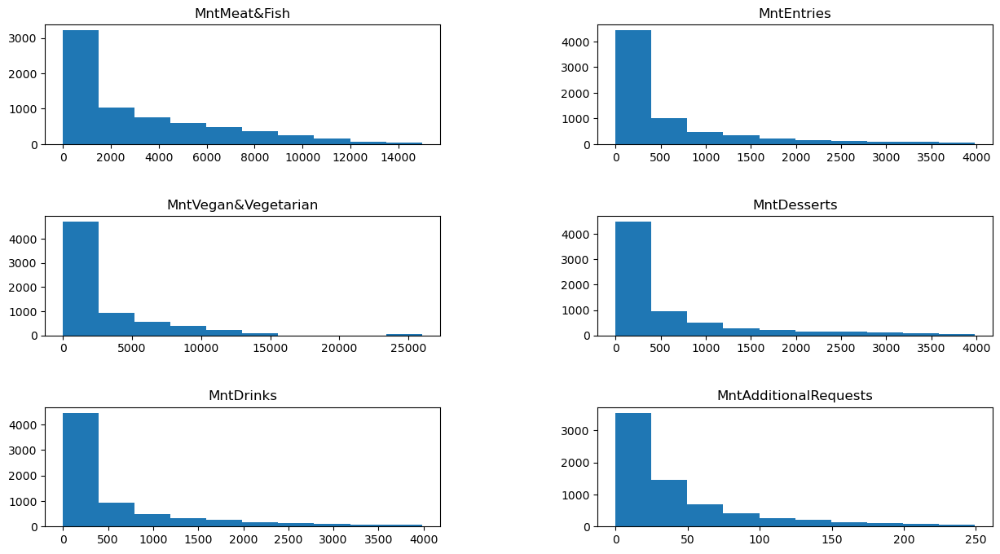

In [116]:

fig, [[ax0,ax1],[ax2,ax3],[ax4,ax5]] = plt.subplots(nrows=3, ncols = 2, figsize=(15,8)) 
fig.subplots_adjust(wspace=0.4, hspace=0.6) 
ax0.hist(df['MntMeat&Fish'])
ax1.hist(df['MntEntries'])
ax2.hist(df['MntVegan&Vegetarian'])
ax3.hist(df['MntDesserts'])
ax4.hist(df['MntDrinks'])
ax5.hist(df['MntAdditionalRequests'])

#Titles
ax0.set_title('MntMeat&Fish')
ax1.set_title('MntEntries')
ax2.set_title('MntVegan&Vegetarian')
ax3.set_title('MntDesserts')
ax4.set_title('MntDrinks')
ax5.set_title('MntAdditionalRequests')

#### Perspective 2

y) Histograms of clustering variables in the 2nd Perspective

Text(0.5, 1.0, 'NumStorePurchases')

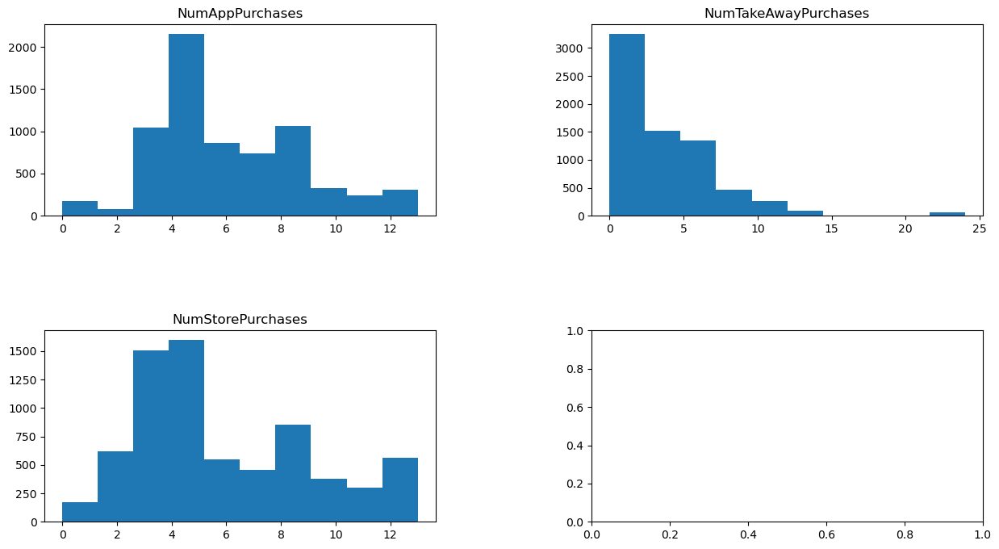

In [117]:
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(nrows=2, ncols = 2, figsize=(15,8))  
fig.subplots_adjust(wspace=0.4, hspace=0.6) 
ax1.hist(df['NumAppPurchases'])          
ax2.hist(df['NumTakeAwayPurchases'])   
ax3.hist(df['NumStorePurchases'])        
   
#Set the labels            
ax1.set_title('NumAppPurchases')          
ax2.set_title('NumTakeAwayPurchases')   
ax3.set_title('NumStorePurchases')        

#### Perspective 3

z) Histograms of clustering variables in the 3rd Perspective

(array([ 331., 1275., 1615., 1657., 1467.,  552.,   17.,    0.,    0.,
          86.]),
 array([  2493.8   ,  26008.3925,  49522.985 ,  73037.5775,  96552.17  ,
        120066.7625, 143581.355 , 167095.9475, 190610.54  , 214125.1325,
        237639.725 ]),
 <BarContainer object of 10 artists>)

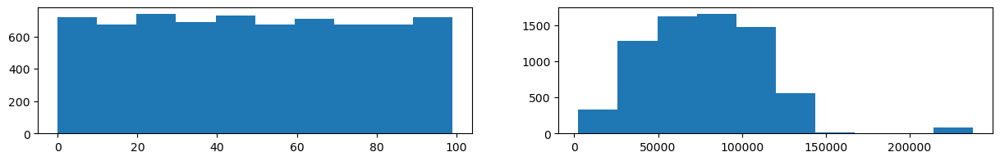

In [118]:
fig, [ax1,ax2] = plt.subplots(nrows=1, ncols = 2, figsize=(15,2)) 
ax1.hist(df['Recency'])
ax2.hist(df['Income'])

#In this prespective we sumed the amount spent and number of purchases by client.
#the other variables were already treat, we removed the outliers for the other prespectives.


Note: There are outliers in the following variables:
- Income 
- NumTakeAwayPurchases
- MntVegan&Vegetarian

aa) Drop outliers if they represent less than 3% of df

In [119]:
# percentage of outliers in Income 
(sum(df['Income'] > 200000)/7000)*100

1.2285714285714284

In [120]:
# percentage of outliers in NumTakeAwayPurchases 
(sum(df['NumTakeAwayPurchases'] > 20)/7000)*100

0.8714285714285714

In [121]:
# percentage of outliers in MntVegan&Vegetarian 
(sum(df['MntVegan&Vegetarian'] > 22000)/7000)*100

0.8999999999999999

- since the percentage of outliers in these variables is <3%, we are going to drop these observartions 

In [122]:
df = df.drop(df[df['Income'] > 200000].index)

In [123]:
df = df.drop(df[df['NumTakeAwayPurchases'] > 20].index)

In [124]:
df = df.drop(df[df['MntVegan&Vegetarian'] > 20000].index)

# 3. 1st Perspective - Consumption patterns/types

EXPLICAÇÃO DA PERSPECTIVA:
- Objetivos;
- Interesse;
- variáveis foco;

## 3.1. Dataframe Preparation

- 1- Isolar variáveis de interesse
- 2- Standardização (MinMax)
- 3- PCA???!!!

ab) Creat new data frame with only the "Mnt" variables

In [125]:
df_mnt_pre_normalize=(df[['MntMeat&Fish','MntEntries','MntDrinks','MntAdditionalRequests','MntDesserts','MntVegan&Vegetarian']]).copy()

In [126]:
df_mnt_pre_normalize

,MntMeat&Fish,MntEntries,MntDrinks,MntAdditionalRequests,MntDesserts,MntVegan&Vegetarian
CustomerID,,,,,,
11054,7230.0,1820,1600.0,57.0,440.0,3435.0
17117,5850.0,320,500.0,8.0,320.0,2745.0
31751,8380.0,0,0.0,28.0,0.0,1560.0
12947,5090.0,280,140.0,78.0,560.0,2355.0
11402,330.0,0,0.0,7.0,0.0,240.0
...,...,...,...,...,...,...
23699,290.0,20,0.0,4.0,40.0,180.0
23255,230.0,80,20.0,23.0,80.0,525.0
5798,3050.0,2460,1800.0,107.0,980.0,3840.0


ac) Standardization using MinMax method


In [127]:
# MINMAX NORMALIZATION
#import pandas as pd
#from sklearn.preprocessing import MinMaxScaler

# Initialize scaler object
#scaler = MinMaxScaler()

# Apply scaler to the data in the data frame
#df_mnt = pd.DataFrame(scaler.fit_transform(df_mnt_pre_normalize), columns=df_mnt_pre_normalize.columns)

# View the normalized data frame
#df_mnt.head()

In [128]:
# create a new DataFrame with the columns you want to standardize
cols_to_standardize = ['MntMeat&Fish','MntEntries','MntDrinks','MntAdditionalRequests','MntDesserts','MntVegan&Vegetarian']
data_to_standardize = df_mnt_pre_normalize[cols_to_standardize]

# standardize the data
scaler = MinMaxScaler()
standardized_data = scaler.fit_transform(data_to_standardize)

# create a new DataFrame with standardized data and column names
standardized_df = pd.DataFrame(data=standardized_data, columns=cols_to_standardize, index=df_mnt_pre_normalize.index)

# merge back into the original DataFrame
df_mnt = pd.merge(df_mnt_pre_normalize.drop(cols_to_standardize, axis=1), standardized_df, left_index=True, right_index=True)
df_mnt

,MntMeat&Fish,MntEntries,MntDrinks,MntAdditionalRequests,MntDesserts,MntVegan&Vegetarian
CustomerID,,,,,,
11054,0.482644,0.457286,0.402010,0.228916,0.110553,0.229229
17117,0.390521,0.080402,0.125628,0.032129,0.080402,0.183183
31751,0.559413,0.000000,0.000000,0.112450,0.000000,0.104104
12947,0.339786,0.070352,0.035176,0.313253,0.140704,0.157157
11402,0.022029,0.000000,0.000000,0.028112,0.000000,0.016016
...,...,...,...,...,...,...
23699,0.019359,0.005025,0.000000,0.016064,0.010050,0.012012
23255,0.015354,0.020101,0.005025,0.092369,0.020101,0.035035
5798,0.203605,0.618090,0.452261,0.429719,0.246231,0.256256


<h2>3.1.2. Optimal number of Clusters</h2>

In [129]:
#optimal k for clustering

from sklearn.cluster import KMeans

ks = range(1, 11)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k).fit(df_mnt)
    inertias.append(model.inertia_)

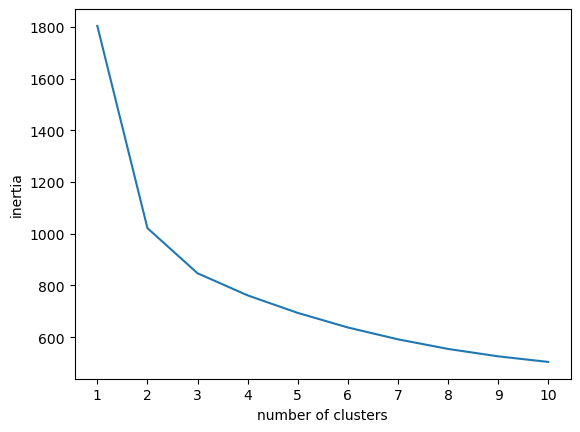

In [130]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot(). 
plt.plot(ks, inertias)

# define the label for the x axis as 'number of clusters' using matplotlib.pyplot.xlabel
plt.xlabel('number of clusters')
# define the label for the y axis as 'inertia' using matplotlib.pyplot.ylabel
plt.ylabel('inertia')
# define the ticks on the x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

<h2>K-means K=2 <h2>

df_mnt_k2 = df_mnt.copy()
model_k2 = KMeans(n_clusters=2, random_state = 100).fit(df_mnt)
df_mnt_k2['k2'] = model_k2.labels_
df_mnt_k2.groupby(['k2']).mean().transpose()

In [131]:
df_mnt_k2.groupby(['k2']).describe().transpose()

NameError: name 'df_mnt_k2' is not defined

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k2['MntAdditionalRequests'], df_mnt_k2['MntMeat&Fish'], c=df_mnt_k2['k2'])
plt.xlabel('MntAdditionalRequests')
plt.ylabel('MntMeat')
plt.title('KMeans Clustering with 2 clusters')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k2['MntDrinks'], df_mnt_k2['MntEntries'], c=df_mnt_k2['k2'])
plt.xlabel('MntDrinks')
plt.ylabel('MntEntries')
plt.title('KMeans Clustering with 2 clusters')
plt.show()

<h2>K=3<h2>

In [ ]:
df_mnt_k3 = df_mnt.copy()
model_k3 = KMeans(n_clusters=3, random_state = 100).fit(df_mnt)
df_mnt_k3['k3 cluster'] = model_k3.labels_
df_mnt_k3.groupby(['k3 cluster']).mean().transpose()

In [ ]:
df_mnt_k3.groupby(['k3 cluster']).describe().transpose()

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k3['MntEntries'], df_mnt_k3['MntMeat&Fish'], c=df_mnt_k3['k3 cluster'])
plt.xlabel('MntEntries')
plt.ylabel('MntMeat')
plt.title('KMeans Clustering with 3 clusters')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k3['MntDrinks'], df_mnt_k3['MntDesserts'], c=df_mnt_k3['k3 cluster'])
plt.xlabel('MntDrinks')
plt.ylabel('MntDesserts')
plt.title('KMeans Clustering with 3 clusters')
plt.show()

<h2>K=4<h2>

In [ ]:
df_mnt_k4 = df_mnt.copy()
model_k4 = KMeans(n_clusters=4, random_state = 100).fit(df_mnt)
df_mnt_k4['k4'] = model_k4.labels_
df_mnt_k4.groupby(['k4']).mean().transpose()

In [ ]:
df_mnt_k4.groupby(['k4']).describe().transpose()

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k4['MntVegan&Vegetarian'], df_mnt_k4['MntAdditionalRequests'], c=df_mnt_k4['k4'])
plt.xlabel('MntVeg')
plt.ylabel('MntRequests')
plt.title('KMeans Clustering with 4 clusters')
plt.show()

In [132]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k4['MntEntries'], df_mnt_k4['MntMeat&Fish'], c=df_mnt_k4['k4'])
plt.xlabel('MntEntries')
plt.ylabel('MntMeat')
plt.title('KMeans Clustering with 4 clusters')
plt.show()

NameError: name 'df_mnt_k4' is not defined

In [133]:
#K means doesn't seem to be the most appropriate clustering algorithm for this data frame
#Let's see if a density based clustering algorithm would work better

<h2>3.1.3. Density Based Clustering- OPTICS Algorithm<h2>

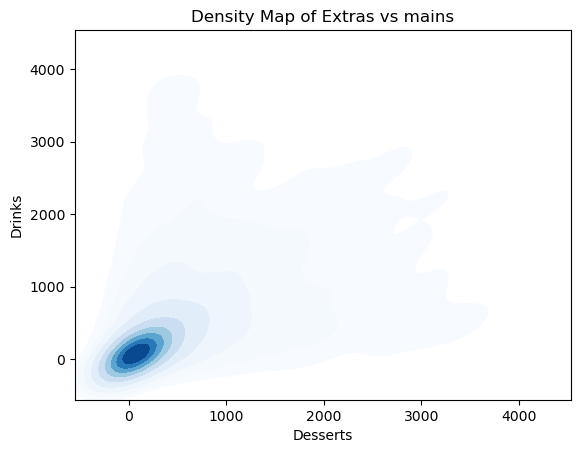

In [134]:
#check densities on various variables to choose what type of density based algorithm to use

import seaborn as sns

# Extract the columns of interest
drinks = df['MntDesserts']
meat_fish = df['MntDrinks']

# Create the density map
sns.kdeplot(x=drinks, y=meat_fish, cmap='Blues', shade=True)

# Set the axis labels and title
plt.xlabel('Desserts')
plt.ylabel('Drinks')
plt.title('Density Map of Extras vs mains')

# Show the plot
plt.show()

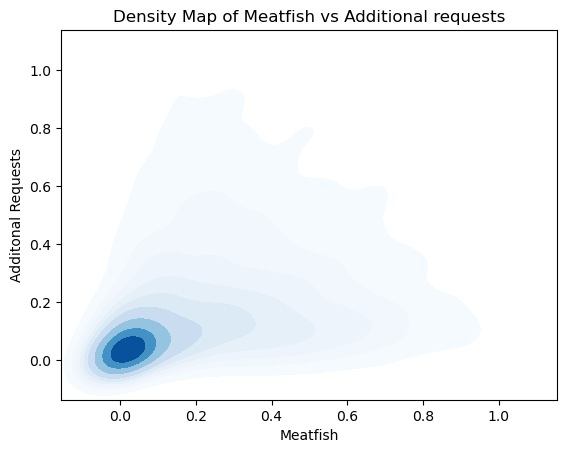

In [135]:
#check densities on various variables to choose what type of density based algorithm to use

import seaborn as sns

# Extract the columns of interest
meatfish = df_mnt['MntMeat&Fish']
add_requests = df_mnt['MntAdditionalRequests']

# Create the density map
sns.kdeplot(x=meatfish, y=add_requests, cmap='Blues', shade=True)

# Set the axis labels and title
plt.xlabel('Meatfish')
plt.ylabel('Additonal Requests')
plt.title('Density Map of Meatfish vs Additional requests')

# Show the plot
plt.show()

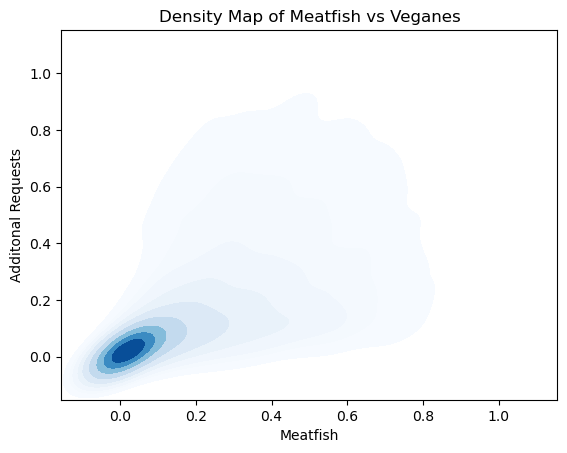

In [136]:
#check densities on various variables to choose what type of density based algorithm to use

import seaborn as sns

# Extract the columns of interest
meatfish = df_mnt['MntMeat&Fish']
veganes = df_mnt['MntVegan&Vegetarian']

# Create the density map
sns.kdeplot(x=meatfish, y=veganes, cmap='Blues', shade=True)

# Set the axis labels and title
plt.xlabel('Meatfish')
plt.ylabel('Additonal Requests')
plt.title('Density Map of Meatfish vs Veganes')

# Show the plot
plt.show()

In [137]:

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Extract the columns of interest
X = df_mnt

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Instantiate and fit the DBSCAN model
dbscan = DBSCAN(eps=0.7, min_samples=26, metric='euclidean')
dbscan.fit(X)

# Add the cluster labels to the dataframe
df_mnt['cluster_'] = dbscan.labels_

# Print the number of clusters and cluster labels
n_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
print('Cluster labels:', dbscan.labels_)

Cluster labels: [-1  0  0 ... -1  0  0]


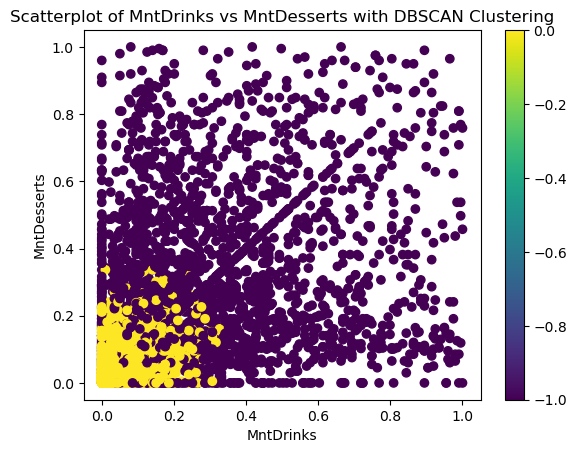

In [138]:
import matplotlib.pyplot as plt

# Set the x and y variables
x_var = 'MntDrinks'
y_var = 'MntDesserts'

# Create the scatterplot
plt.scatter(df_mnt[x_var], df_mnt[y_var], c=df_mnt['cluster_'], cmap='viridis')
plt.colorbar()

# Set the axis labels and title
plt.xlabel(x_var)
plt.ylabel(y_var)
plt.title('Scatterplot of {} vs {} with DBSCAN Clustering'.format(x_var, y_var))

# Show the plot
plt.show()

In [139]:
df_mnt.groupby('cluster_').agg(['mean', 'median', 'std', 'count'])

MntMeat&Fish                           MntEntries            \
                 mean    median       std count       mean    median   
cluster_                                                               
-1           0.389184  0.357143  0.223593  2471   0.313789  0.251256   
 0           0.107556  0.030708  0.151323  4419   0.037054  0.019598   

                         MntDrinks            ... MntAdditionalRequests        \
               std count      mean    median  ...                   std count   
cluster_                                      ...                               
-1        0.238014  2471  0.321191  0.266332  ...              0.241880  2471   
 0        0.050479  4419  0.037649  0.015075  ...              0.113174  4419   

         MntDesserts                           MntVegan&Vegetarian            \
                mean    median       std count                mean    median   
cluster_                                                                       
-1          0.317589  0.256281  0.243959  2471            0.392875  0.352352   
 0          0.037304  0.015075  0.050101  4419            0.050910  0.024024   

                          
               std count  
cluster_                  
-1        0.234284  2471  
 0        0.061096  4419  

[2 rows x 24 columns]

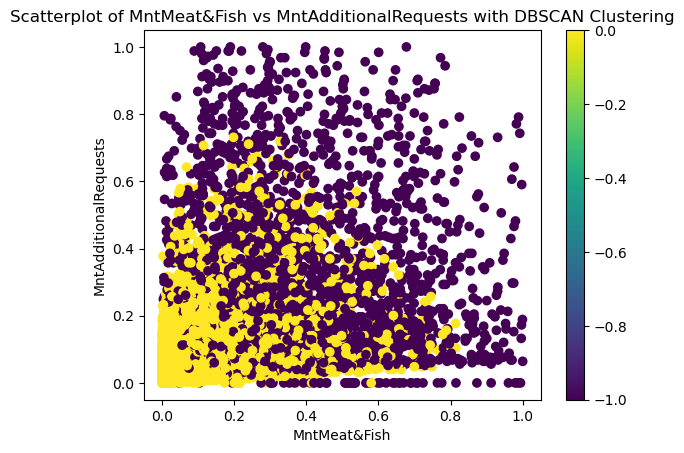

In [140]:
import matplotlib.pyplot as plt

# Set the x and y variables
x_var = 'MntMeat&Fish'
y_var = 'MntAdditionalRequests'

# Create the scatterplot
plt.scatter(df_mnt[x_var], df_mnt[y_var], c=df_mnt['cluster_'], cmap='viridis')
plt.colorbar()

# Set the axis labels and title
plt.xlabel(x_var)
plt.ylabel(y_var)
plt.title('Scatterplot of {} vs {} with DBSCAN Clustering'.format(x_var, y_var))

# Show the plot
plt.show()

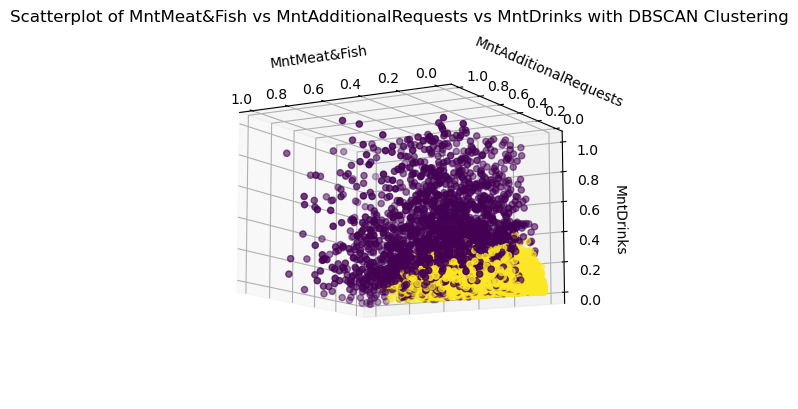

In [141]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Set the x, y, and z variables
x_var = 'MntMeat&Fish'
y_var = 'MntAdditionalRequests'
z_var = 'MntDrinks'
c_var = 'cluster_'

# Create the figure and 3D axis object
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create the scatterplot
ax.scatter(df_mnt[x_var], df_mnt[y_var], df_mnt[z_var], c=df_mnt[c_var], cmap='viridis')

# Set the axis labels and title
ax.set_xlabel(x_var)
ax.set_ylabel(y_var)
ax.set_zlabel(z_var)
ax.set_title('Scatterplot of {} vs {} vs {} with DBSCAN Clustering'.format(x_var, y_var, z_var))
ax.view_init(elev=-10, azim=120)

# Show the plot
plt.show()


<h2>3.1.4. Cluster analysis <h2>

<h3>Cluster A (cluster 0): roughly 45% bigger than Cluster B (cluster -1)<h3><h3>Cluster A: eventhough consumers don't spend as much on each type of item, they're more spread out on the type of dishes they consume relative to Cluster B where consumers spend more but more consistently.<h3>

<h2>3.1.4.1 Cluster analysis with unused demographic variables <h2>

In [142]:
conclusions_P1 = pd.concat([df_mnt['cluster_'].reset_index(drop=True), crm.reset_index(drop=True)], axis=1, join='inner')

In [143]:
df_mnt.groupby('cluster_').agg(['mean', 'std', 'count'])

MntMeat&Fish                 MntEntries                 MntDrinks  \
                 mean       std count       mean       std count      mean   
cluster_                                                                     
-1           0.389184  0.223593  2471   0.313789  0.238014  2471  0.321191   
 0           0.107556  0.151323  4419   0.037054  0.050479  4419  0.037649   

                         MntAdditionalRequests                 MntDesserts  \
               std count                  mean       std count        mean   
cluster_                                                                     
-1        0.243383  2471              0.312419  0.241880  2471    0.317589   
 0        0.051485  4419              0.095596  0.113174  4419    0.037304   

                         MntVegan&Vegetarian                  
               std count                mean       std count  
cluster_                                                      
-1        0.243959  2471            0.392875  0.234284  2471  
 0        0.050101  4419            0.050910  0.061096  4419

In [144]:
conclusions_P1

,cluster_,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age,age_group,Gender
0,-1,Miss Leah Lewis,GRADUATION,SINGLE,113947.0,0,0,42,35-45,1
1,0,Miss Grace Black,GRADUATION,MARRIED,114297.0,0,0,49,45-65,1
2,0,Mr. Gavin Morrison,PHD,MARRIED,115476.0,0,0,63,45-65,0
3,0,Mr. Ryan Glover,GRADUATION,MARRIED,101172.0,1,1,43,35-45,0
4,0,Mr. Paul Anderson,HIGHSCHOOL,SINGLE,123128.0,0,0,52,45-65,0
...,...,...,...,...,...,...,...,...,...,...
6885,0,Mr. Adam Robertson,GRADUATION,MARRIED,110346.0,0,1,62,45-65,0
6886,0,Mr. Gordon Oliver,HIGHSCHOOL,MARRIED,30009.0,0,0,66,65+,0
6887,-1,Miss Emily Jones,GRADUATION,SINGLE,77623.0,0,1,50,45-65,1
6888,0,Mr. Carl Roberts,GRADUATION,SINGLE,108963.0,0,0,62,45-65,0


In [145]:
clusterA = conclusions_P1[conclusions_P1['cluster_']==0]
clusterB = conclusions_P1[conclusions_P1['cluster_']==-1]

In [146]:
clusterA

,cluster_,Name,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Age,age_group,Gender
1,0,Miss Grace Black,GRADUATION,MARRIED,114297.0,0,0,49,45-65,1
2,0,Mr. Gavin Morrison,PHD,MARRIED,115476.0,0,0,63,45-65,0
3,0,Mr. Ryan Glover,GRADUATION,MARRIED,101172.0,1,1,43,35-45,0
4,0,Mr. Paul Anderson,HIGHSCHOOL,SINGLE,123128.0,0,0,52,45-65,0
7,0,Mr. Nathan Wallace,PHD,DIVORCED,71692.0,0,1,42,35-45,0
...,...,...,...,...,...,...,...,...,...,...
6882,0,Mr. Matt Duncan,GRADUATION,MARRIED,50420.0,0,1,60,45-65,0
6885,0,Mr. Adam Robertson,GRADUATION,MARRIED,110346.0,0,1,62,45-65,0
6886,0,Mr. Gordon Oliver,HIGHSCHOOL,MARRIED,30009.0,0,0,66,65+,0
6888,0,Mr. Carl Roberts,GRADUATION,SINGLE,108963.0,0,0,62,45-65,0


<h2> Cluster A<h2>

In [147]:
clusterA.describe()

,cluster_,Income,Kid_Younger6,Children_6to18,Age,Gender
count,4419.0,4419.000000,4419.000000,4419.000000,4419.000000,4419.000000
mean,0.0,78062.887016,0.438108,0.494003,46.464132,0.268839
std,0.0,35381.349959,0.548223,0.540063,11.940977,0.443406
min,0.0,2493.800000,0.000000,0.000000,18.000000,0.000000
25%,0.0,51992.500000,0.000000,0.000000,38.000000,0.000000
50%,0.0,77467.000000,0.000000,0.000000,45.000000,0.000000
75%,0.0,102299.000000,1.000000,1.000000,56.000000,1.000000
max,0.0,237322.825000,2.000000,2.000000,75.000000,1.000000


In [148]:
clusterA.groupby('Education')['Education'].agg(['count'])

,count
Education,
BASIC,105
GRADUATION,2220
HIGHSCHOOL,424
MASTER,724
PHD,946


In [149]:
clusterA.groupby('Marital_Status')['Marital_Status'].agg(['count'])

,count
Marital_Status,
DIVORCED,412
MARRIED,2862
SINGLE,977
WIDOW,168


In [150]:
clusterA.groupby('Gender')['Gender'].agg(['count'])

,count
Gender,
0,3231
1,1188


In [151]:
clusterA.groupby('age_group')['age_group'].agg(['count'])

,count
age_group,
18-25,109
25-35,739
35-45,1379
45-65,1932
65+,257


In [152]:
round(clusterA['Children_6to18'].value_counts()/(len(clusterA))*100,2)

0    52.68
1    45.24
2     2.08
Name: Children_6to18, dtype: float64

In [153]:
round(clusterA['Kid_Younger6'].value_counts()/(len(cluster0))*100,2)

NameError: name 'cluster0' is not defined

<h2> Cluster B<h2>

In [ ]:
clusterB.describe()

In [ ]:
clusterB.groupby('Education')['Education'].agg(['count'])

In [ ]:
clusterB.groupby('Marital_Status')['Marital_Status'].agg(['count'])

In [ ]:
clusterB.groupby('age_group')['age_group'].agg(['count'])

In [ ]:
round(clusterB['Children_6to18'].value_counts()/(len(cluster0))*100,2)

In [ ]:
round(clusterB['Kid_Younger6'].value_counts()/(len(cluster0))*100,2)

<h2>3.1.4.2 Cluster analysis with unused marketing table<h2>

In [ ]:
conclusions_mkt = pd.concat([df_mnt['cluster_'].reset_index(drop=True), mkt.reset_index(drop=True)], axis=1, join='inner')

In [ ]:
conclusions_mkt

In [ ]:
clusterA = conclusions_mkt[conclusions_mkt['cluster_']==0]
clusterB = conclusions_mkt[conclusions_mkt['cluster_']==-1]

In [ ]:
clusterA.describe()

In [ ]:
clusterB.describe()

<h3> -Cluster A: campaigns 1 and 2 were the most successful. They were similarly successful<h3>
<h3> -Cluster B: campaign 1 was the most successful by a larger margin than the same campaign on Cluster B<h3>
<h3> -Campaign 4 was more successful on B than A; Campaign 2 was more succesful on A than B
<h3> -Campaign 5 performed much worse compared to all other campaigns on both groups<h3>
<h3> -Overall, costumers did not use campaigns a lot<h3>

## 3.2. Analysis with PCA 
- https://statisticsglobe.com/principal-component-analysis-python

In [ ]:
df_pca= df_mnt.copy()

In [ ]:
from sklearn.decomposition import PCA

### 3.2.1 Choosing number of Principal Components

In [ ]:
pca = PCA(n_components=6)
pca.fit_transform(df_pca)

In [ ]:
#Lara e Joana
prop_var = pca.explained_variance_ratio_
eigenvalues = pca.explained_variance_

In [ ]:
eigenvalues

In [ ]:
import plotly.graph_objs as go

PC_numbers = np.arange(pca.n_components_) + 1

trace = go.Scatter(x=PC_numbers, 
                   y=prop_var,
                   mode='lines+markers',
                   marker=dict(color='red', size=8),
                   line=dict(width=2, color='black'))

layout = go.Layout(title='Figure 1: Scree Plot', 
                   xaxis=dict(title='Principal Component'),
                   yaxis=dict(title='Proportion of Variance'))

fig = go.Figure(data=[trace], layout=layout)
fig

In [ ]:
#João
prop_var = pca.explained_variance_ratio_
eigenvalues = pca.explained_variance_
PC_numbers = np.arange(pca.n_components_) + 1
 
plt.plot(PC_numbers, 
         prop_var, 
         'ro-')
plt.title('Figure 1: Scree Plot', fontsize=8)
plt.ylabel('Proportion of Variance', fontsize=8)
plt.show()

### 3.2.2. PCA for 2 components 

In [ ]:
pca = PCA(n_components=2)
PC = pca.fit_transform(df_pca)

In [ ]:
pca2_res = pd.DataFrame(data = PC, 
                            columns = ['PC1', 'PC2'])
 
pca2_res.head(6)

#### 3.2.2.1. Biplot

In [ ]:
def biplot(score,coef,labels=None):
 
    xs = score[:,0]
    ys = score[:,1]
    n = coef.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,
                s=5, 
                color='orange')
 
    for i in range(n): 
        plt.arrow(0, 0, coef[i,0], 
                  coef[i,1],color = 'purple',
                  alpha = 0.5)
        plt.text(coef[i,0]* 1.15, 
                 coef[i,1] * 1.15, 
                 labels[i], 
                 color = 'darkblue', 
                 ha = 'center', 
                 va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))    
 

    plt.figure()

In [ ]:
plt.title('Biplot of PCA')
 
biplot(PC, 
       np.transpose(pca.components_), 
       list(df_pca.columns))

- Using the elbow criteria we should retain 2 principal components 

In [ ]:
import plotly.express as px

px.area(
    x=range(1, prop_var.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

### 3.2.2. PCA for 3 components (PC=3)

In [ ]:
pca = PCA(n_components=3)
PC = pca.fit_transform(df_pca)

In [ ]:
pca2_res = pd.DataFrame(data = PC, 
                            columns = ['PC1', 'PC2', 'PC3'])
 
pca2_res.head(6)

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
PC = pca.fit_transform(df_pca)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    PC, x=0, y=1, z=2, 
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

#### 3.2.2.1. Biplot

In [ ]:
def biplot(score,coef,labels=None):
 
    xs = score[:,0]
    ys = score[:,1]
    n = coef.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,
                s=5, 
                color='orange')
 
    for i in range(n): 
        plt.arrow(0, 0, coef[i,0], 
                  coef[i,1],color = 'purple',
                  alpha = 0.5)
        plt.text(coef[i,0]* 1.15, 
                 coef[i,1] * 1.15, 
                 labels[i], 
                 color = 'darkblue', 
                 ha = 'center', 
                 va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))    
 

    plt.figure()

In [ ]:
plt.title('Biplot of PCA')
 
biplot(PC, 
       np.transpose(pca.components_), 
       list(df_pca.columns))

## 3.3. Analysis without PCA 

### 3.3.1 K-means

In [154]:
from sklearn.cluster import KMeans

In [155]:
# DO IT
ks = range(1, 11)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k).fit(df_mnt)
    inertias.append(model.inertia_)

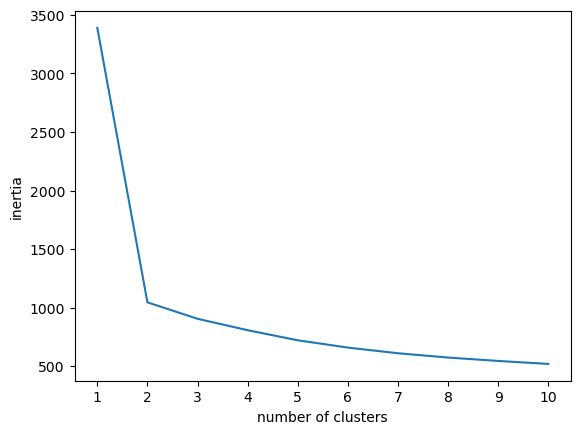

In [156]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot(). 
plt.plot(ks, inertias)

# define the label for the x axis as 'number of clusters' using matplotlib.pyplot.xlabel
plt.xlabel('number of clusters')
# define the label for the y axis as 'inertia' using matplotlib.pyplot.ylabel
plt.ylabel('inertia')
# define the ticks on the x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

In [157]:
df_k4 = df_mnt_scaled.copy()
k4 = KMeans(n_clusters=4, random_state = 100).fit(df_mnt)

NameError: name 'df_mnt_scaled' is not defined

In [ ]:
df_k4['k4_c'] = k4.labels_

In [ ]:
d4 = df_k4.groupby(['k4_c']).describe().transpose()
d4

In [ ]:
import matplotlib.pyplot as plt

# Select two variables to plot
x_var = 'MntMeat&Fish'
y_var = 'MntEntries'

# Create scatter plot with color-coded clusters
plt.scatter(df_k4[x_var], df_k4[y_var], c=kmeans.labels_)
plt.xlabel(x_var)
plt.ylabel(y_var)
plt.title('K-Means Clustering with k=4')
plt.show()

In [ ]:
df_mnt.corr()

In [ ]:
df_mnt_k3 = df_mnt.copy()
model_k3 = KMeans(n_clusters=3, random_state = 100).fit(df_mnt)

In [ ]:
model_k3

In [ ]:
df_mnt_k3['k3 cluster'] = model_k3.labels_

In [ ]:
df_mnt_k3.groupby(['k3 cluster']).mean().transpose()

In [ ]:
descr3 = df_mnt_k3.groupby(['k3 cluster']).describe().transpose()
descr3

In [ ]:
df_mnt_k2 = df_mnt.copy()
model_k2 = KMeans(n_clusters=2, random_state = 100).fit(df_mnt)

In [ ]:
f_mnt_k2['k2'] = model_k2.labels_

In [158]:
df_mnt_k2.groupby(['k2']).mean().transpose()

NameError: name 'df_mnt_k2' is not defined

In [159]:
descr2 = df_mnt_k2.groupby(['k2']).describe().transpose()
descr2

NameError: name 'df_mnt_k2' is not defined

Visualization

In [160]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k2['MntEntries'], df_mnt_k2['MntMeat&Fish'], c=df_mnt_k2['k2'])
plt.xlabel('')
plt.ylabel('')
plt.title('KMeans Clustering with 2 clusters')
plt.show()

NameError: name 'df_mnt_k2' is not defined

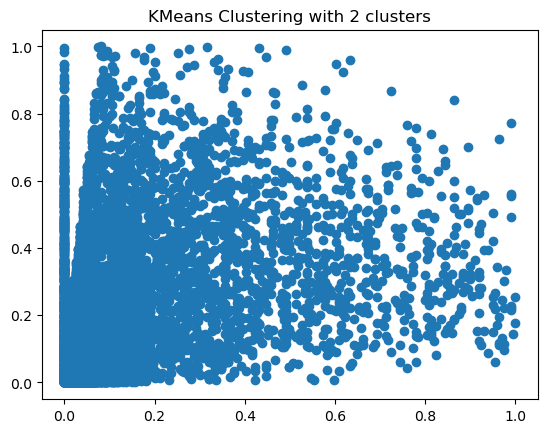

In [161]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt['MntEntries'], df_mnt['MntMeat&Fish'])
plt.xlabel('')
plt.ylabel('')
plt.title('KMeans Clustering with 2 clusters')
plt.show()

In [162]:
import matplotlib.pyplot as plt

plt.scatter(df_mnt_k2['MntDrinks'], df_mnt_k2['MntEntries'])
plt.xlabel('')
plt.ylabel('')
plt.title('KMeans Clustering with 2 clusters')
plt.show()

NameError: name 'df_mnt_k2' is not defined

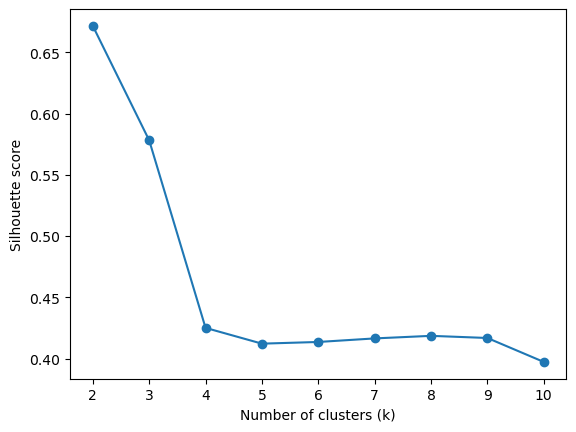

In [163]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Create a list to store silhouette scores for different values of k
silhouette_scores = []

# Fit k-means clustering for different values of k
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(df_mnt)
    score = silhouette_score(df_mnt, labels)
    silhouette_scores.append(score)

# Plot the silhouette scores for different values of k
import matplotlib.pyplot as plt
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette score')
plt.show()

In [164]:
df_mnt_k4 = df_mnt.copy()
model_k4 = KMeans(n_clusters=4, random_state = 100).fit(df_mnt)

In [165]:
df_mnt_k4['k4'] = model_k4.labels_

In [166]:
df_mnt_k4.groupby(['k4']).mean().transpose()

k4,0,1,2,3
MntMeat&Fish,0.037945,0.384462,0.323301,0.396795
MntEntries,0.026825,0.216714,0.068756,0.470279
MntDrinks,0.026908,0.228437,0.070937,0.470714
MntAdditionalRequests,0.058411,0.302095,0.210843,0.329063
MntDesserts,0.026996,0.212261,0.069251,0.487381
MntVegan&Vegetarian,0.027171,0.315459,0.124486,0.517674
cluster_,0.000000,-1.000000,0.000000,-1.000000


In [167]:
descr4 = df_mnt_k4.groupby(['k4']).describe().transpose()
descr4

k4                                     0            1            2           3
MntMeat&Fish          count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.037945     0.384462     0.323301    0.396795
                      std       0.048624     0.235688     0.158050    0.202471
                      min       0.000000     0.004005     0.024032    0.020694
                      25%       0.006008     0.192924     0.205607    0.245661
                      50%       0.016689     0.347130     0.299399    0.370828
                      75%       0.048732     0.554072     0.421061    0.519192
                      max       0.271028     1.000000     0.814419    0.996662
MntEntries            count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.026825     0.216714     0.068756    0.470279
                      std       0.039117     0.158426     0.066160    0.260523
                      min       0.000000     0.000000     0.000000    0.000000
                      25%       0.005025     0.105528     0.020101    0.251256
                      50%       0.015075     0.180905     0.050251    0.457286
                      75%       0.035176     0.306533     0.105528    0.668342
                      max       0.331658     0.974874     0.361809    1.000000
MntDrinks             count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.026908     0.228437     0.070937    0.470714
                      std       0.038778     0.176285     0.068870    0.261621
                      min       0.000000     0.000000     0.000000    0.000000
                      25%       0.005025     0.100503     0.020101    0.251256
                      50%       0.015075     0.190955     0.050251    0.457286
                      75%       0.035176     0.326633     0.105528    0.668342
                      max       0.326633     0.979899     0.321608    1.000000
MntAdditionalRequests count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.058411     0.302095     0.210843    0.329063
                      std       0.059300     0.242249     0.155088    0.240478
                      min       0.000000     0.000000     0.000000    0.000000
                      25%       0.016064     0.112450     0.088353    0.140562
                      50%       0.040161     0.224900     0.168675    0.257028
                      75%       0.080321     0.433735     0.305221    0.485944
                      max       0.385542     1.000000     0.730924    1.000000
MntDesserts           count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.026996     0.212261     0.069251    0.487381
                      std       0.039095     0.160660     0.064852    0.259174
                      min       0.000000     0.000000     0.000000    0.000000
                      25%       0.005025     0.090452     0.020101    0.266332
                      50%       0.015075     0.180905     0.050251    0.492462
                      75%       0.035176     0.301508     0.105528    0.693467
                      max       0.336683     0.909548     0.336683    1.000000
MntVegan&Vegetarian   count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.027171     0.315459     0.124486    0.517674
                      std       0.030686     0.196088     0.072287    0.237054
                      min       0.000000     0.012012     0.008008    0.058058
                      25%       0.008008     0.157157     0.069069    0.330581
                      50%       0.016016     0.269269     0.112112    0.511011
                      75%       0.033033     0.442442     0.165916    0.703954
                      max       0.279279     0.979980     0.421421    1.000000
cluster_              count  3341.000000  1525.000000  1078.000000  946.000000
                      mean      0.000000    -1.000

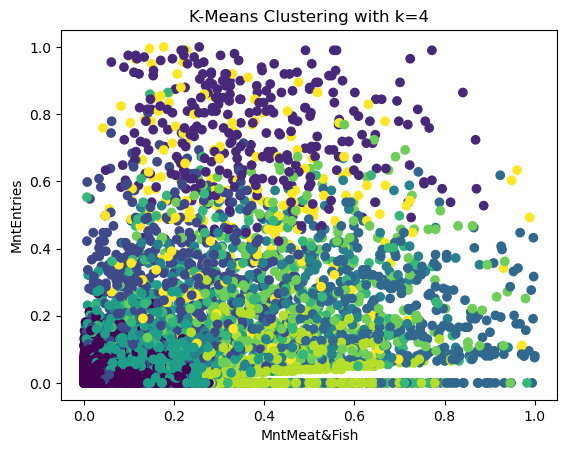

In [168]:
import matplotlib.pyplot as plt

# Select two variables to plot
x_var = 'MntMeat&Fish'
y_var = 'MntEntries'

# Create scatter plot with color-coded clusters
plt.scatter(df_mnt[x_var], df_mnt[y_var], c=kmeans.labels_)
plt.xlabel(x_var)
plt.ylabel(y_var)
plt.title('K-Means Clustering with k=4')
plt.show()


In [169]:
df_mnt.corr()

,MntMeat&Fish,MntEntries,MntDrinks,MntAdditionalRequests,MntDesserts,MntVegan&Vegetarian,cluster_
MntMeat&Fish,1.000000,0.386306,0.384301,0.376987,0.400275,0.614529,-0.598982
MntEntries,0.386306,1.000000,0.556068,0.366331,0.563511,0.582153,-0.667309
MntDrinks,0.384301,0.556068,1.000000,0.375893,0.547912,0.582981,-0.668117
MntAdditionalRequests,0.376987,0.366331,0.375893,1.000000,0.370214,0.388872,-0.519940
MntDesserts,0.400275,0.563511,0.547912,0.370214,1.000000,0.579535,-0.663750
MntVegan&Vegetarian,0.614529,0.582153,0.582981,0.388872,0.579535,1.000000,-0.741142
cluster_,-0.598982,-0.667309,-0.668117,-0.519940,-0.663750,-0.741142,1.000000


### Let's try interpret MntEntries, MntDrinks and MntDesserts as supplements

In [170]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Apply MinMaxScaler to your dataframe
df_mnt_scaled = scaler.fit_transform(df_mnt)

# The df_mnt_scaled is now a numpy array with the same shape as your original dataframe

import pandas as pd

# Transform numpy array into dataframe
df_mnt_scaled = pd.DataFrame(df_mnt_scaled, columns=df_mnt.columns)

In [171]:
df_mnt_scaled

,MntMeat&Fish,MntEntries,MntDrinks,MntAdditionalRequests,MntDesserts,MntVegan&Vegetarian,cluster_
0,0.482644,0.457286,0.402010,0.228916,0.110553,0.229229,0.0
1,0.390521,0.080402,0.125628,0.032129,0.080402,0.183183,1.0
2,0.559413,0.000000,0.000000,0.112450,0.000000,0.104104,1.0
3,0.339786,0.070352,0.035176,0.313253,0.140704,0.157157,1.0
4,0.022029,0.000000,0.000000,0.028112,0.000000,0.016016,1.0
...,...,...,...,...,...,...,...
6885,0.019359,0.005025,0.000000,0.016064,0.010050,0.012012,1.0
6886,0.015354,0.020101,0.005025,0.092369,0.020101,0.035035,1.0
6887,0.203605,0.618090,0.452261,0.429719,0.246231,0.256256,0.0
6888,0.001335,0.050251,0.040201,0.056225,0.000000,0.006006,1.0


In [172]:
# DO IT
ks = range(1, 11)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k).fit(df_mnt_scaled)
    inertias.append(model.inertia_)

In [173]:

# DO IT
ks = range(1, 11)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k).fit(df_mnt_scaled)
    inertias.append(model.inertia_)
# DO IT
ks = range(1, 11)
inertias = []
​
for k in ks:
    model = KMeans(n_clusters=k).fit(df_mnt_scaled)
    inertias.append(model.inertia_)
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot(). 
plt.plot(ks, inertias)
​
# define the label for the x axis as 'number of clusters' using matplotlib.pyplot.xlabel
plt.xlabel('number of clusters')
# define the label for the y axis as 'inertia' using matplotlib.pyplot.ylabel
plt.ylabel('inertia')
# define the ticks on the x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

SyntaxError: invalid non-printable character U+200B (2959101051.py, line 11)

In [ ]:
df_k4 = df_mnt_scaled.copy()
k4 = KMeans(n_clusters=4, random_state = 100).fit(df_mnt)

In [ ]:
df_k4['k4_c'] = k4.labels_

In [ ]:
d4 = df_k4.groupby(['k4_c']).describe().transpose()
d4

In [ ]:
import matplotlib.pyplot as plt

# Select two variables to plot
x_var = 'MntMeat&Fish'
y_var = 'MntEntries'

# Create scatter plot with color-coded clusters
plt.scatter(df_k4[x_var], df_k4[y_var], c=kmeans.labels_)
plt.xlabel(x_var)
plt.ylabel(y_var)
plt.title('K-Means Clustering with k=4')
plt.show()

### 3.3.2. DBSCAN

## 3.4. Cluster analysis & caracterization

## 3.5. Business & Marketing insights

# 4. 2nd Perspective - Preference in the means of purchase

EXPLICAÇÃO DA PERSPECTIVA:

 - Objetivos;
 - Interesse;
 - variáveis foco;

## 4.1. Dataframe Preparation

In [174]:
#Criar subset com as variáveis que vão contribuir para os clusters
sales_vc = df[[ 'NumAppPurchases','NumTakeAwayPurchases', 'NumStorePurchases',]].copy()
sales_vc

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases
CustomerID,,,
11054,13,4,13
17117,9,7,9
31751,9,5,3
12947,7,5,11
11402,4,1,3
...,...,...,...
23699,4,1,4
23255,5,1,3
5798,8,4,13


In [175]:
from sklearn.preprocessing import MinMaxScaler


# Create an instance of the scaler
scaler = MinMaxScaler()

# Fit and transform the data
scaled_data = scaler.fit_transform(sales_vc)

In [176]:
# create new dataframe with scaled data
sales_vc_minmax = pd.DataFrame(scaled_data, columns=['NumAppPurchases','NumTakeAwayPurchases', 'NumStorePurchases'])

## 4.2. K-means (Clustering Attempts)

## 2 Clusters (K=2)

In [177]:
ks = range(1, 11)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k).fit(sales_vc_minmax)
    inertias.append(model.inertia_)

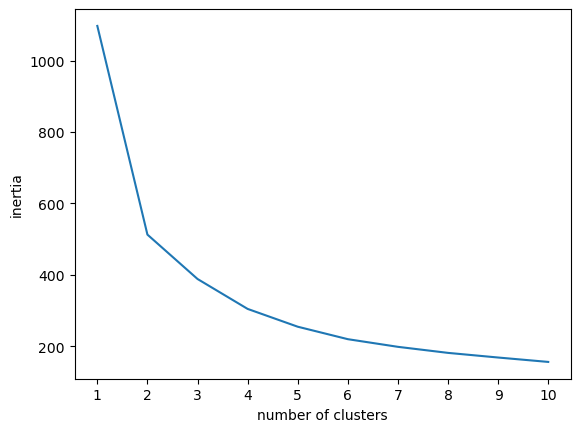

In [178]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot(). 
plt.plot(ks, inertias)

# define the label for the x axis as 'number of clusters' using matplotlib.pyplot.xlabel
plt.xlabel('number of clusters')
# define the label for the y axis as 'inertia' using matplotlib.pyplot.ylabel
plt.ylabel('inertia')
# define the ticks on the x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

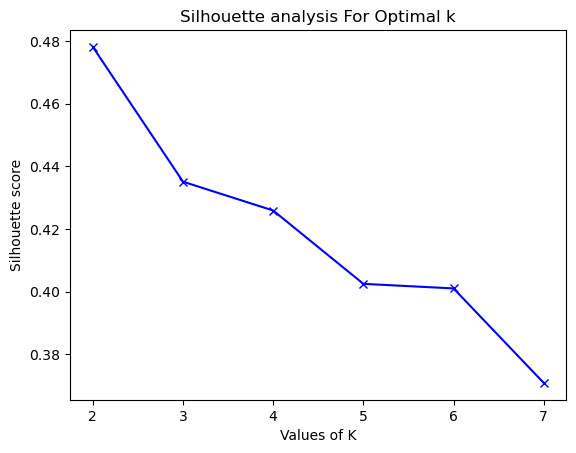

In [179]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

range_n_clusters = [2, 3, 4, 5, 6, 7]
silhouette_avg = []
for num_clusters in range_n_clusters:

    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(sales_vc_minmax)
    cluster_labels = kmeans.labels_

    # silhouette score
    silhouette_avg.append(silhouette_score(sales_vc_minmax, cluster_labels))

plt.plot(range_n_clusters, silhouette_avg, 'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

The optimal K with the Silhouette method is 2! 

The silhouette coefficient or silhouette score kmeans is a measure of how similar a data point is within-cluster (cohesion) compared to other clusters (separation). 
https://www.analyticsvidhya.com/blog/2021/05/k-mean-getting-the-optimal-number-of-clusters/

Testar K= 2; 3; 4 

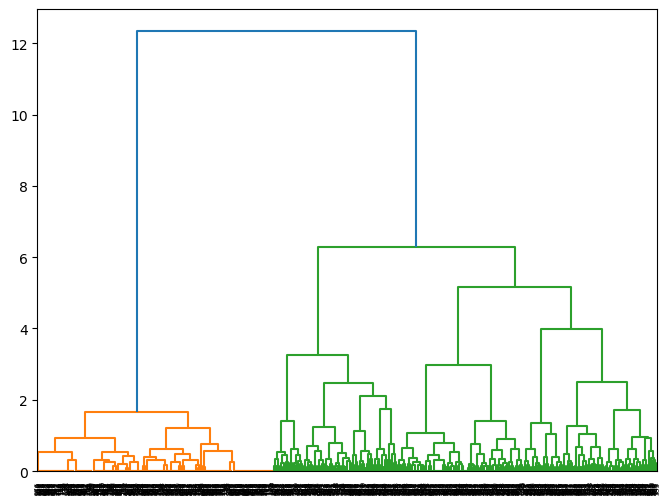

In [180]:
from scipy.cluster import hierarchy
#from sklearn.cluster import AgglomerativeClustering - The option available in sklearn

# Get a random sample, as hierarchical clustering can take a lot of time to run.
sales_vc_sample = sales_vc_minmax.sample(n = 1000, random_state = 100)

# create clusters using the "ward method"
clusters = hierarchy.linkage(sales_vc_sample , method="ward")

# create the dendrogram using the hierarchy.dendrogram() method.
plt.figure(figsize=(8, 6))
dendrogram = hierarchy.dendrogram(clusters)

In [181]:
sales_vc_k2 = sales_vc_minmax.copy()
model_k2 = KMeans(n_clusters=2, random_state = 100).fit(sales_vc_k2)

In [182]:
sales_vc_k2['k_label'] = model_k2.labels_

In [183]:
sales_vc_k2.groupby(['k_label']).mean().transpose()

k_label,0,1
NumAppPurchases,0.609533,0.335865
NumTakeAwayPurchases,0.480807,0.141915
NumStorePurchases,0.649994,0.263066


In [184]:
sales_vc_k2.groupby(['k_label']).describe().transpose()

k_label                               0            1
NumAppPurchases      count  3365.000000  3525.000000
                     mean      0.609533     0.335865
                     std       0.180637     0.122864
                     min       0.230769     0.000000
                     25%       0.461538     0.230769
                     50%       0.615385     0.307692
                     75%       0.769231     0.384615
                     max       1.000000     0.846154
NumTakeAwayPurchases count  3365.000000  3525.000000
                     mean      0.480807     0.141915
                     std       0.215520     0.076400
                     min       0.166667     0.000000
                     25%       0.333333     0.083333
                     50%       0.416667     0.166667
                     75%       0.583333     0.166667
                     max       1.000000     0.583333
NumStorePurchases    count  3365.000000  3525.000000
                     mean      0.649994     0.263066
                     std       0.204153     0.096140
                     min       0.230769     0.000000
                     25%       0.461538     0.230769
                     50%       0.615385     0.230769
                     75%       0.846154     0.307692
                     max       1.000000     0.615385

## 3 Clusters (K=3) 

In [185]:
sales_vc_k3 = sales_vc_minmax.copy()
model_k3 = KMeans(n_clusters=3, random_state = 100).fit(sales_vc_k3)

In [186]:
sales_vc_k3['k_label'] = model_k3.labels_

In [187]:
sales_vc_k3.groupby(['k_label']).mean().transpose()

k_label,0,1,2
NumAppPurchases,0.317420,0.533313,0.657127
NumTakeAwayPurchases,0.136737,0.675513,0.313520
NumStorePurchases,0.250412,0.671400,0.607782


Ordem de grandeza do clusters (n.º de individuos) : 2 < 0 < 1 

- C0 compra mais na app e na loja (grupo de clientes regulares)
- C1 é o que tem mais gentes mas o que consome menos (clientes não regulares)
- C2 compra mais no TK Away, mas o cluster que consome mais no geral (grupo de clientes regulares que previligiam o TK Away)


In [188]:
sales_vc_k3.groupby(['k_label']).describe().transpose()

k_label                               0            1            2
NumAppPurchases      count  3266.000000  1479.000000  2145.000000
                     mean      0.317420     0.533313     0.657127
                     std       0.103534     0.154888     0.173271
                     min       0.000000     0.230769     0.230769
                     25%       0.230769     0.384615     0.538462
                     50%       0.307692     0.538462     0.615385
                     75%       0.384615     0.615385     0.769231
                     max       0.692308     1.000000     1.000000
NumTakeAwayPurchases count  3266.000000  1479.000000  2145.000000
                     mean      0.136737     0.675513     0.313520
                     std       0.076280     0.158345     0.103273
                     min       0.000000     0.333333     0.083333
                     25%       0.083333     0.583333     0.250000
                     50%       0.083333     0.666667     0.333333
                     75%       0.166667     0.750000     0.416667
                     max       0.583333     1.000000     0.666667
NumStorePurchases    count  3266.000000  1479.000000  2145.000000
                     mean      0.250412     0.671400     0.607782
                     std       0.084082     0.220012     0.193074
                     min       0.000000     0.230769     0.153846
                     25%       0.230769     0.461538     0.461538
                     50%       0.230769     0.692308     0.615385
                     75%       0.307692     0.846154     0.769231
                     max       0.615385     1.000000     1.000000

## 4 Clusters (K=4) --> SOLUÇÃO

In [189]:
sales_vc_k4 = sales_vc_minmax.copy()
model_k4 = KMeans(n_clusters=4, random_state = 100).fit(sales_vc_k4)

In [190]:
sales_vc_k4['k_label'] = model_k4.labels_

In [191]:
sales_vc_k4.groupby(['k_label']).mean().transpose()

k_label,0,1,2,3
NumAppPurchases,0.297988,0.622070,0.540062,0.598246
NumTakeAwayPurchases,0.124473,0.281351,0.723025,0.471194
NumStorePurchases,0.236713,0.481374,0.496932,0.851506


Ordem de grandeza do clusters (n.º de individuos) : 3 < 2 < 1 < 0

- C0 (geral_avg~8)  APP e Loja está mais equilibrado e que menos consome TK Away; é o grupo que tem mais individuos (Menos regulares)
- C1 (geral_avg~19) Consome mais na APP
- C2 (geral_avg~24) consome mais na loja, é o que consome mais na loja, são clientes regulares
- C3 (geral_avg=24) consome maioritariamente TK Away (praticamente só Tk Away e nada na app e loja) grupo de clientes regulares que previligiam o TK Away, "habituais"); A mediana é =0 para a compra na APP e na Loja

In [192]:
sales_vc_k4.groupby(['k_label']).describe().transpose()

k_label                               0            1           2            3
NumAppPurchases      count  2925.000000  1749.000000  865.000000  1351.000000
                     mean      0.297988     0.622070    0.540062     0.598246
                     std       0.086582     0.169155    0.155256     0.183949
                     min       0.000000     0.230769    0.230769     0.230769
                     25%       0.230769     0.461538    0.461538     0.461538
                     50%       0.307692     0.615385    0.538462     0.538462
                     75%       0.384615     0.769231    0.615385     0.692308
                     max       0.538462     1.000000    1.000000     1.000000
NumTakeAwayPurchases count  2925.000000  1749.000000  865.000000  1351.000000
                     mean      0.124473     0.281351    0.723025     0.471194
                     std       0.061163     0.100344    0.154540     0.173495
                     min       0.000000     0.083333    0.500000     0.250000
                     25%       0.083333     0.166667    0.583333     0.333333
                     50%       0.083333     0.250000    0.666667     0.416667
                     75%       0.166667     0.333333    0.833333     0.583333
                     max       0.500000     0.583333    1.000000     1.000000
NumStorePurchases    count  2925.000000  1749.000000  865.000000  1351.000000
                     mean      0.236713     0.481374    0.496932     0.851506
                     std       0.072180     0.121608    0.154974     0.102681
                     min       0.000000     0.153846    0.230769     0.615385
                     25%       0.230769     0.384615    0.384615     0.769231
                     50%       0.230769     0.461538    0.461538     0.846154
                     75%       0.307692     0.615385    0.615385     0.923077
                     max       0.615385     0.692308    0.923077     1.000000

## Visualização

In [193]:
cluster0 = sales_vc_k4[sales_vc_k4.k_label==0]
cluster1 = sales_vc_k4[sales_vc_k4.k_label==1]
cluster2 = sales_vc_k4[sales_vc_k4.k_label==2]
cluster3 = sales_vc_k4[sales_vc_k4.k_label==3]

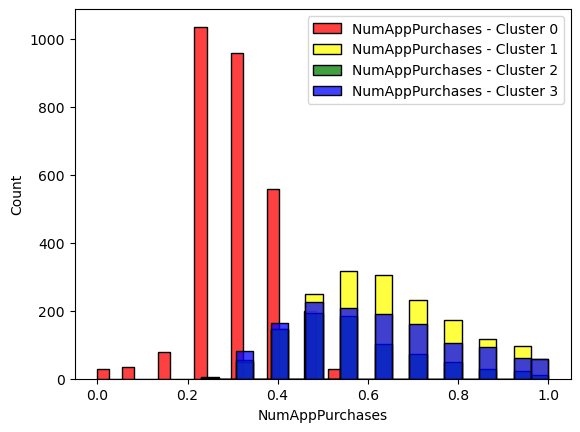

In [194]:
sns.histplot(cluster0['NumAppPurchases'],color='red',label='NumAppPurchases - Cluster 0', bins = 20)
sns.histplot(cluster1['NumAppPurchases'],color='yellow',label='NumAppPurchases - Cluster 1', bins = 20)
sns.histplot(cluster2['NumAppPurchases'],color='green',label='NumAppPurchases - Cluster 2', bins = 20)
sns.histplot(cluster3['NumAppPurchases'],color='blue',label='NumAppPurchases - Cluster 3', bins = 20)
plt.legend()

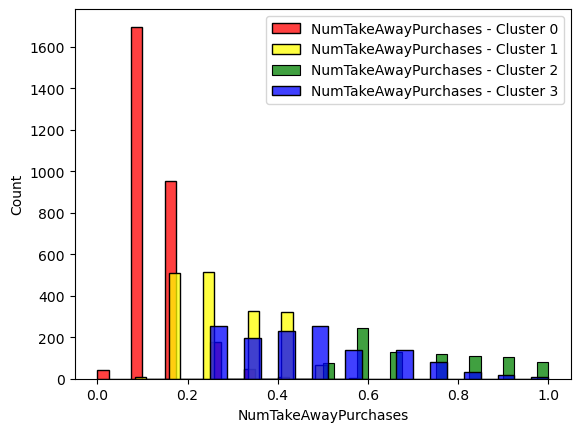

In [195]:
sns.histplot(cluster0['NumTakeAwayPurchases'],color='red',label='NumTakeAwayPurchases - Cluster 0', bins = 20)
sns.histplot(cluster1['NumTakeAwayPurchases'],color='yellow',label='NumTakeAwayPurchases - Cluster 1', bins = 20)
sns.histplot(cluster2['NumTakeAwayPurchases'],color='green',label='NumTakeAwayPurchases - Cluster 2', bins = 20)
sns.histplot(cluster3['NumTakeAwayPurchases'],color='blue',label='NumTakeAwayPurchases - Cluster 3', bins = 20)
plt.legend()

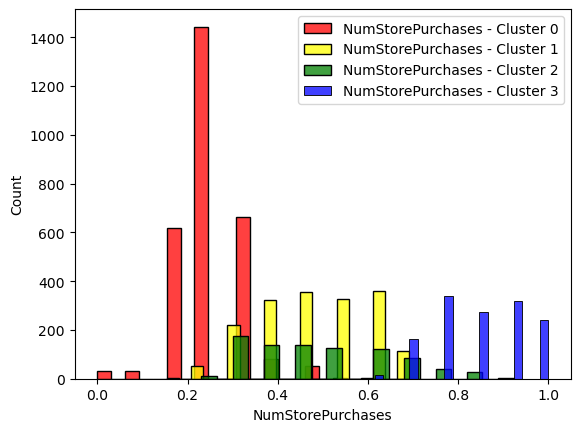

In [196]:
sns.histplot(cluster0['NumStorePurchases'],color='red',label='NumStorePurchases - Cluster 0', bins = 20)
sns.histplot(cluster1['NumStorePurchases'],color='yellow',label='NumStorePurchases - Cluster 1', bins = 20)
sns.histplot(cluster2['NumStorePurchases'],color='green',label='NumStorePurchases - Cluster 2', bins = 20)
sns.histplot(cluster3['NumStorePurchases'],color='blue',label='NumStorePurchases - Cluster 3', bins = 20)
plt.legend()

In [197]:
centroids = model_k4.cluster_centers_
centroids

array([[0.29798817, 0.12447293, 0.23671269],
       [0.62206975, 0.28135125, 0.48137397],
       [0.54006225, 0.72302505, 0.49693197],
       [0.59824631, 0.47119418, 0.85150601]])

In [198]:
sales_vc_minmax.columns

Index(['NumAppPurchases', 'NumTakeAwayPurchases', 'NumStorePurchases'], dtype='object')

In [199]:
centroid_0_APP = centroids[0,0]
centroid_1_APP = centroids[1,0]
centroid_2_APP = centroids[2,0]
centroid_3_APP = centroids[3,0]
centroid_0_STORE = centroids[0,1]
centroid_1_STORE = centroids[1,1]
centroid_2_STORE = centroids[2,1]
centroid_3_STORE = centroids[3,1]
centroid_0_TKAWAY = centroids[0,2]
centroid_1_TKAWAY = centroids[1,2]
centroid_2_TKAWAY = centroids[2,2]
centroid_3_TKAWAY = centroids[3,2]

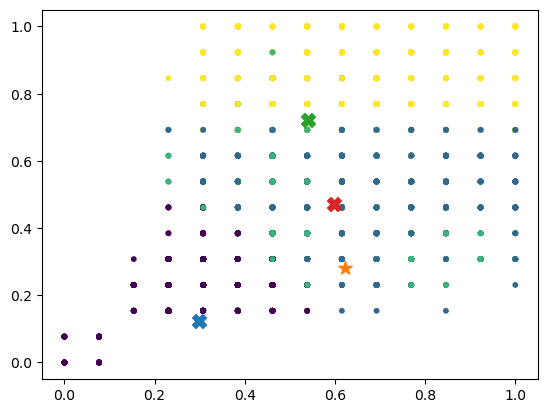

In [200]:
plt.scatter(sales_vc_k4.NumAppPurchases, sales_vc_k4.NumStorePurchases,
            c=sales_vc_k4.k_label, s=10)

plt.scatter(centroid_0_APP, centroid_0_STORE, marker='X', s=100)#AZUL
plt.scatter(centroid_1_APP, centroid_1_STORE, marker='*', s=100)#LARANJA
plt.scatter(centroid_2_APP, centroid_2_STORE, marker='X', s=100)#VERDE
plt.scatter(centroid_3_APP, centroid_3_STORE, marker='X', s=100)#VERMELHO

plt.show()

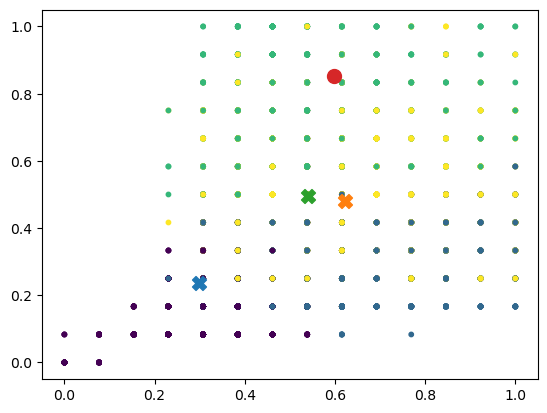

In [201]:
plt.scatter(sales_vc_k4.NumAppPurchases, sales_vc_k4.NumTakeAwayPurchases,
            c=sales_vc_k4.k_label, s=10)

plt.scatter(centroid_0_APP, centroid_0_TKAWAY, marker='X', s=100)
plt.scatter(centroid_1_APP, centroid_1_TKAWAY, marker='X', s=100)
plt.scatter(centroid_2_APP, centroid_2_TKAWAY, marker='X', s=100)
plt.scatter(centroid_3_APP, centroid_3_TKAWAY, marker='o', s=100)

plt.show()

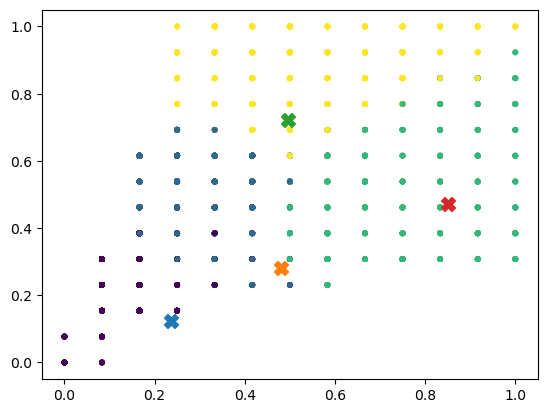

In [202]:
plt.scatter(sales_vc_k4.NumTakeAwayPurchases, sales_vc_k4.NumStorePurchases,
            c=sales_vc_k4.k_label, s=10)

plt.scatter(centroid_0_TKAWAY, centroid_0_STORE, marker='X', s=100)
plt.scatter(centroid_1_TKAWAY, centroid_1_STORE, marker='X', s=100)
plt.scatter(centroid_2_TKAWAY, centroid_2_STORE, marker='X', s=100)
plt.scatter(centroid_3_TKAWAY, centroid_3_STORE, marker='X', s=100)

plt.show()

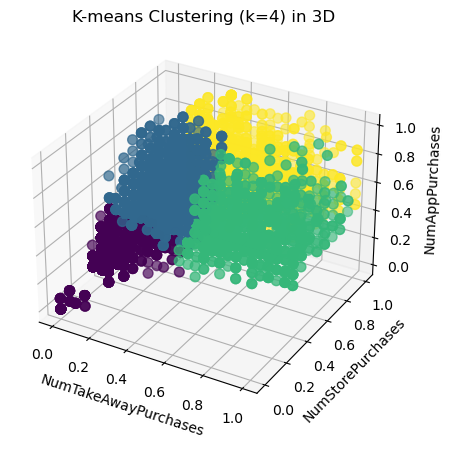

In [203]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(5, 9))
ax = fig.add_subplot(111, projection='3d')

x = sales_vc_k4.NumTakeAwayPurchases
y = sales_vc_k4.NumStorePurchases
z = sales_vc_k4.NumAppPurchases
c = sales_vc_k4.k_label

ax.scatter(x, y, z, c=c, s=50)

ax.set_xlabel('NumTakeAwayPurchases')
ax.set_ylabel('NumStorePurchases')
ax.set_zlabel('NumAppPurchases')

plt.title("K-means Clustering (k=4) in 3D")
plt.show()

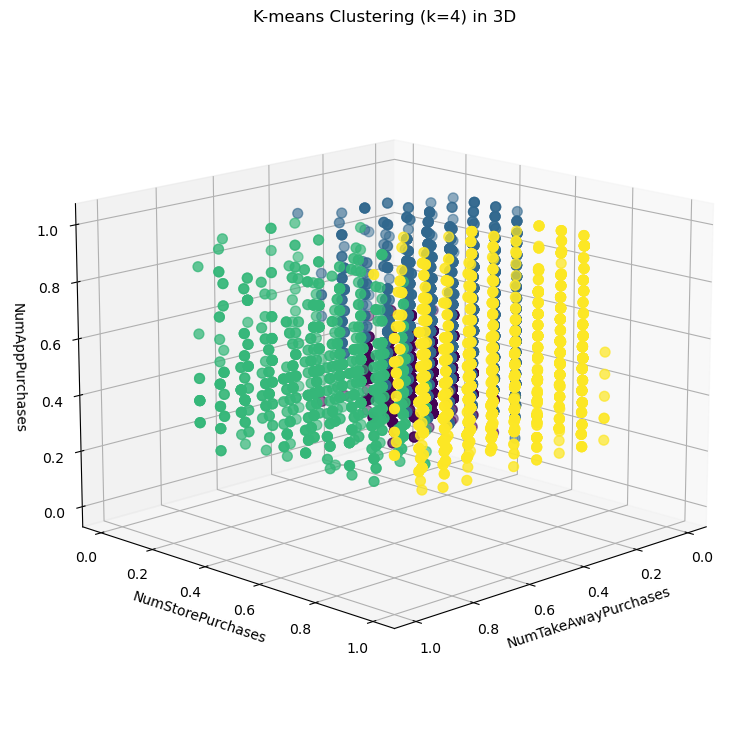

In [204]:
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

x = sales_vc_k4.NumTakeAwayPurchases
y = sales_vc_k4.NumStorePurchases
z = sales_vc_k4.NumAppPurchases
c = sales_vc_k4.k_label

ax.scatter(x, y, z, c=c, s=50)

ax.set_xlabel('NumTakeAwayPurchases')
ax.set_ylabel('NumStorePurchases')
ax.set_zlabel('NumAppPurchases')

# Change the angle
ax.view_init(elev=15, azim=45)

plt.title("K-means Clustering (k=4) in 3D")
plt.show()


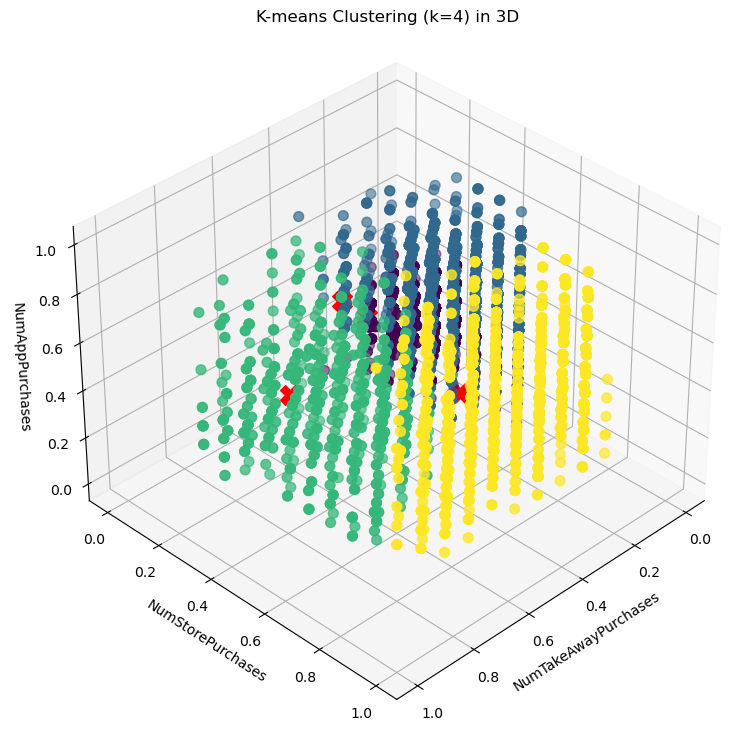

In [205]:
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

x = sales_vc_k4.NumTakeAwayPurchases
y = sales_vc_k4.NumStorePurchases
z = sales_vc_k4.NumAppPurchases
c = sales_vc_k4.k_label

ax.scatter(x, y, z, c=c, s=50)

# Add centroids
ax.scatter(centroid_0_TKAWAY, centroid_0_STORE, centroid_0_APP, marker='X', s=200, c='red')
ax.scatter(centroid_1_TKAWAY, centroid_1_STORE, centroid_1_APP, marker='X', s=200, c='red')
ax.scatter(centroid_2_TKAWAY, centroid_2_STORE, centroid_2_APP, marker='X', s=200, c='red')
ax.scatter(centroid_3_TKAWAY, centroid_3_STORE, centroid_3_APP, marker='X', s=200, c='red')

ax.set_xlabel('NumTakeAwayPurchases')
ax.set_ylabel('NumStorePurchases')
ax.set_zlabel('NumAppPurchases')

# Change the angle
ax.view_init(elev=35, azim=45) #change elevation to check the centroids a bit better

plt.title("K-means Clustering (k=4) in 3D")
plt.show()

In [206]:
#other solutions

<function matplotlib.pyplot.show(close=None, block=None)>

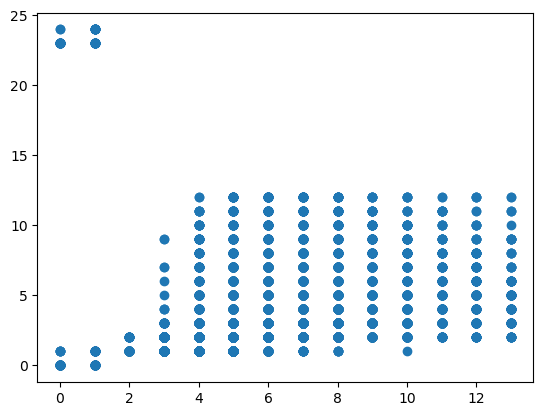

In [207]:
plt.scatter(sales["NumAppPurchases"], sales["NumTakeAwayPurchases"])
plt.show

In [208]:
centroids = model_k2.cluster_centers_
centroids

array([[0.60953252, 0.48080733, 0.64999429],
       [0.3358647 , 0.14191489, 0.26306601]])

In [209]:
centroid_0_APP = centroids[0,0]
centroid_1_APP = centroids[1,0]
centroid_0_STORE = centroids[0,1]
centroid_1_STORE = centroids[1,1]
centroid_0_TKAWAY = centroids[0,2]
centroid_1_TKAWAY = centroids[1,2]

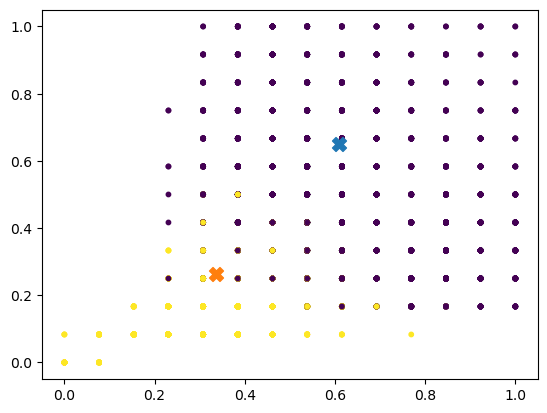

In [210]:
plt.scatter(sales_vc_k2.NumAppPurchases, sales_vc_k2.NumTakeAwayPurchases,
            c=sales_vc_k2.k_label, s=10)

plt.scatter(centroid_0_APP, centroid_0_TKAWAY, marker='X', s=100)
plt.scatter(centroid_1_APP, centroid_1_TKAWAY, marker='X', s=100)

plt.show()

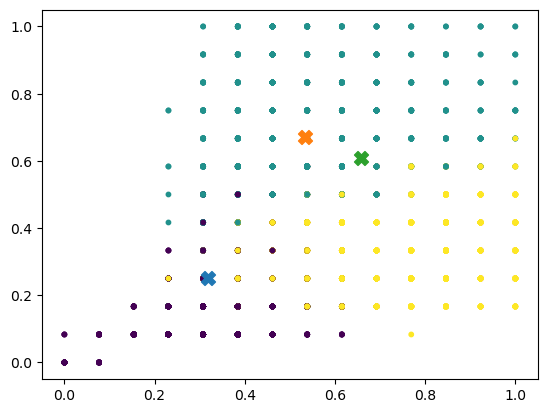

In [211]:
centroids = model_k3.cluster_centers_
centroids

centroid_0_APP = centroids[0,0]
centroid_1_APP = centroids[1,0]
centroid_2_APP = centroids[2,0]
centroid_0_STORE = centroids[0,1]
centroid_1_STORE = centroids[1,1]
centroid_2_STORE = centroids[2,1]
centroid_0_TKAWAY = centroids[0,2]
centroid_1_TKAWAY = centroids[1,2]
centroid_2_TKAWAY = centroids[2,2]



plt.scatter(sales_vc_k3.NumAppPurchases, sales_vc_k3.NumTakeAwayPurchases,
            c=sales_vc_k3.k_label, s=10)

plt.scatter(centroid_0_APP, centroid_0_TKAWAY, marker='X', s=100)
plt.scatter(centroid_1_APP, centroid_1_TKAWAY, marker='X', s=100)
plt.scatter(centroid_2_APP, centroid_2_TKAWAY, marker='X', s=100)

plt.show()

## 4.3. DBSCAN

Ran the code of this site: https://www.reneshbedre.com/blog/dbscan-python.html?utm_content=cmp-true

In [212]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
# n_neighbors = 5 as kneighbors function returns distance of point to itself (i.e. first column will be zeros) 
nbrs = NearestNeighbors(n_neighbors = 20).fit(sales_vc_minmax)
# Find the k-neighbors of a point
neigh_dist, neigh_ind = nbrs.kneighbors(sales_vc_minmax)
# sort the neighbor distances (lengths to points) in ascending order
# axis = 0 represents sort along first axis i.e. sort along row
sort_neigh_dist = np.sort(neigh_dist, axis = 0)

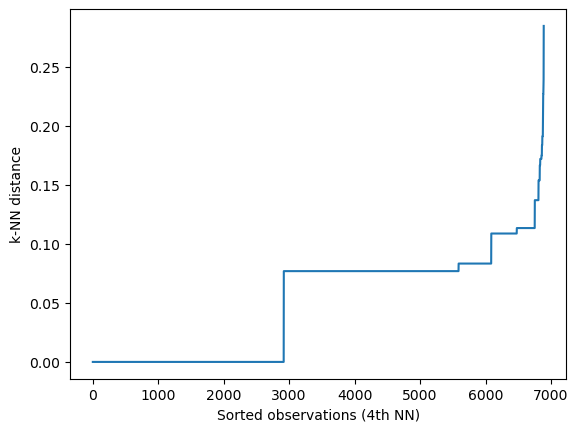

In [213]:
import matplotlib.pyplot as plt
k_dist = sort_neigh_dist[:, 19]
plt.plot(k_dist)
plt.ylabel("k-NN distance")
plt.xlabel("Sorted observations (4th NN)")
plt.show()


- Identifying the exact knee point could be difficult visually. In the below plot, the knee point can occur at any point between 1 to 2 i.e. the points below knee point belong to a cluster, and points above the knee point are noise or outliers (noise points will have higher kNN distance). You should run DBSCAN based on different values of ε (between 1 and 2) to find the best ε that gives the best clustering.

- Additionally, to get an estimate of knee point, you can use the KneeLocator() function from the kneed package.

In [214]:
pip install kneed

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [215]:
from kneed import KneeLocator
kneedle = KneeLocator(x = range(1, len(neigh_dist)+1), y = k_dist, S = 1.0, 
                      curve = "concave", direction = "increasing", online=True)

# get the estimate of knee point
print(kneedle.knee_y)

0.23950694477268478


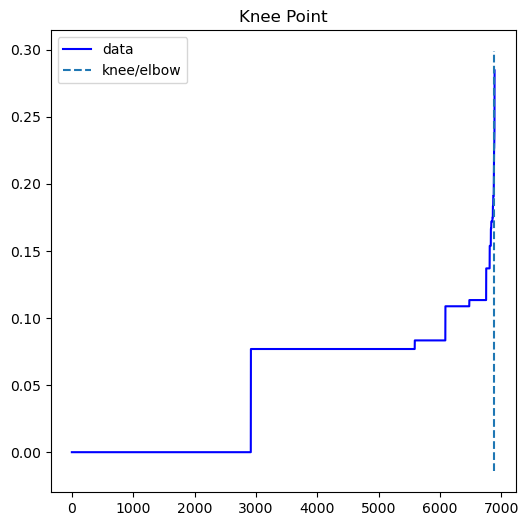

In [216]:
#distance plot
kneedle.plot_knee()
plt.show()

In [217]:
from sklearn.cluster import DBSCAN
clusters = DBSCAN(eps = 1.0714574598551223, min_samples = 2).fit(sales_vc_minmax)

In [218]:
# get cluster labels
clusters.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [219]:
# check unique clusters
set(clusters.labels_)

{0}

In [220]:
from collections import Counter
Counter(clusters.labels_)

Counter({0: 6890})

Visualization of DBSCAN clustering

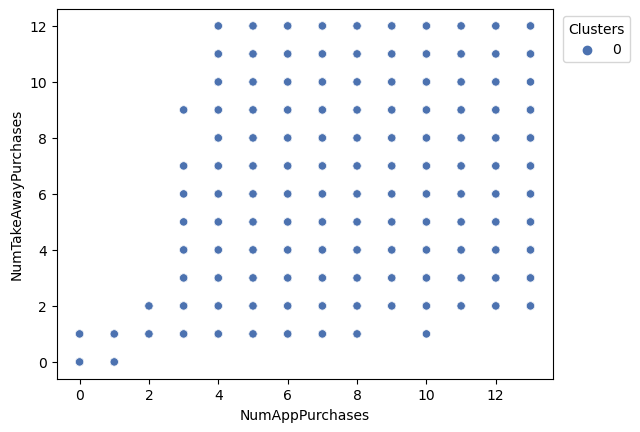

In [221]:
import seaborn as sns
import matplotlib.pyplot as plt
p = sns.scatterplot(data = sales_vc, x = "NumAppPurchases", y = "NumTakeAwayPurchases", hue = clusters.labels_, legend = "full", palette = "deep")
sns.move_legend(p, "upper right", bbox_to_anchor = (1.17, 1.), title = 'Clusters')
plt.show()

## 4.4. Fuzzy clustering/c-means (ineffective)

<div class="alert alert-block alert-info">
    
<a id='stats_num'></a>

### Fuzzy clustering/c-means
    
    #https://pythonhosted.org/scikit-fuzzy/auto_examples/plot_cmeans.html
#(source) FPC method for finding whether a fuzzyness value, m, is optimal
    
</div>

In [222]:
!pip install scikit-fuzzy

Defaulting to user installation because normal site-packages is not writeable


In [223]:
#Find the level of fuzzinness m, for k=4, using Fuzzy Partition Coefficient, trying multiple values for error
#FPC is between 0 and 1, the closer it is to 0, the less the model is effective in partitioning our data

import numpy as np
import skfuzzy as fuzz

for error in np.arange(0.1, 3.1, 0.1):
    for m in np.arange(1, 5, 1):
        data=sales_vc_minmax.copy()
        # Perform fuzzy clustering with optimal number of clusters
        cntr, u, _, _, _, _, fpc = fuzz.cluster.cmeans(data.T, 4, m, error, maxiter=150, init=None)

        # Find the optimal fuzziness
        optimal_fuzziness = np.argmax(fpc)
        print("Optimal fuzziness:", optimal_fuzziness)

Optimal fuzziness: 0


C:\Users\HLX_IT_2.DOMPEDRO\AppData\Roaming\Python\Python39\site-packages\skfuzzy\cluster\_cmeans.py:33: RuntimeWarning: divide by zero encountered in true_divide
  u = normalize_power_columns(d, - 2. / (m - 1))


Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzziness: 0
Optimal fuzzi

In [224]:
#from the values we got on the FPC, it's clear that fuzzy clustering is not at all appropriate to analyze our data set

In [225]:
import numpy as np
import skfuzzy as fuzz

fuzzy=sales_vc_minmax.copy()

# Set the number of clusters
k = 4

# Set the fuzziness parameter
m = 2

# Initialize the cluster centers
centers, u, _, _, _, _, _ = fuzz.cluster.cmeans(fuzzy.T, k, m, error=0.005, maxiter=1000, init=None)

# Get the cluster labels for each data point
labels = np.argmax(u, axis=0)

# Print the cluster centers and labels
print("Cluster centers:")
print(centers)
print("Cluster labels:")
print(labels)

Cluster centers:
[[0.29236718 0.11997647 0.23452318]
 [0.60073452 0.43400373 0.81240666]
 [0.60977683 0.28249661 0.46426576]
 [0.54908864 0.66872069 0.58072283]]
Cluster labels:
[1 3 2 ... 1 0 0]


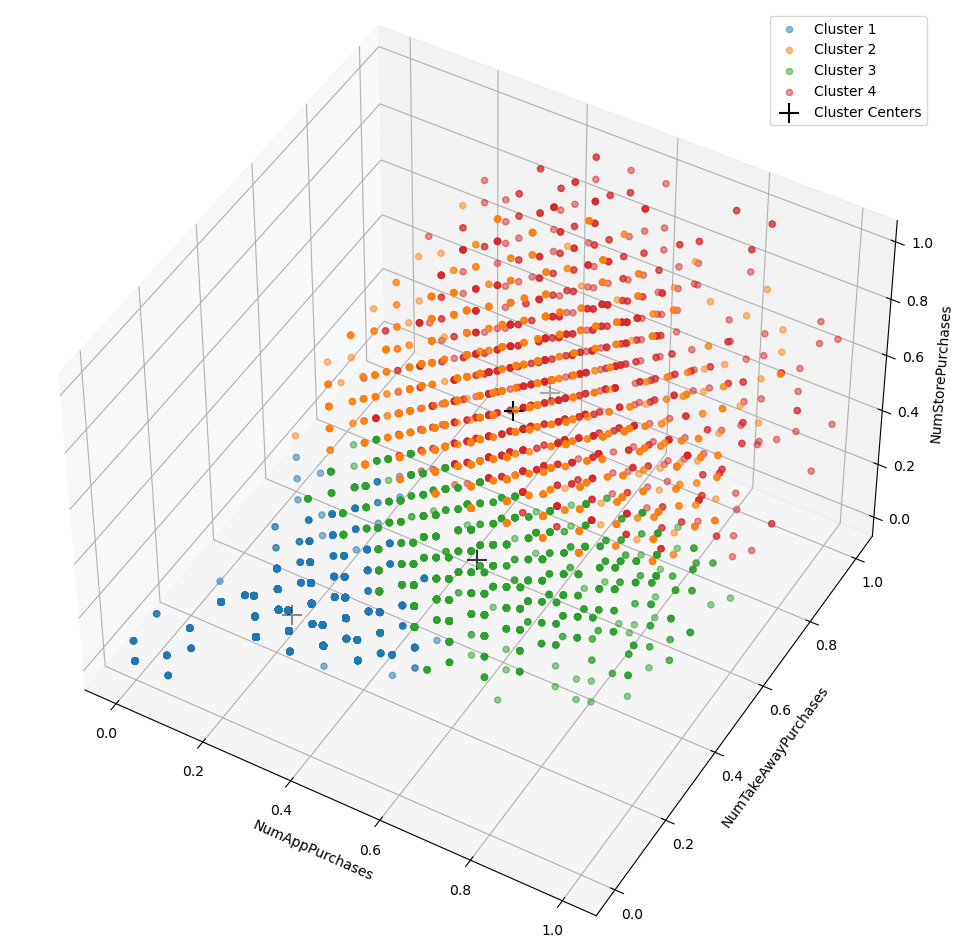

In [226]:
#Further testing---- vizualization of innefectiveness for m (fuzzynness)=2

# Create a 3D plot
fig = plt.figure(figsize=(15, 12))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points colored by cluster label
for i in range(k):
    ax.scatter(sales_vc_minmax.iloc[labels==i, 0], sales_vc_minmax.iloc[labels==i, 1], sales_vc_minmax.iloc[labels==i, 2], alpha=0.5, label="Cluster "+str(i+1))

# Plot the cluster centers
ax.scatter(centers[:,0], centers[:,1], centers[:,2], color='black', marker='+', s=200, label="Cluster Centers")

# Add legend and axis labels
ax.set_xlabel('NumAppPurchases')
ax.set_ylabel('NumTakeAwayPurchases')
ax.set_zlabel('NumStorePurchases')
ax.legend()

# Set the viewing angle
ax.view_init(elev=45, azim=-60)

# Show the plot
plt.show()

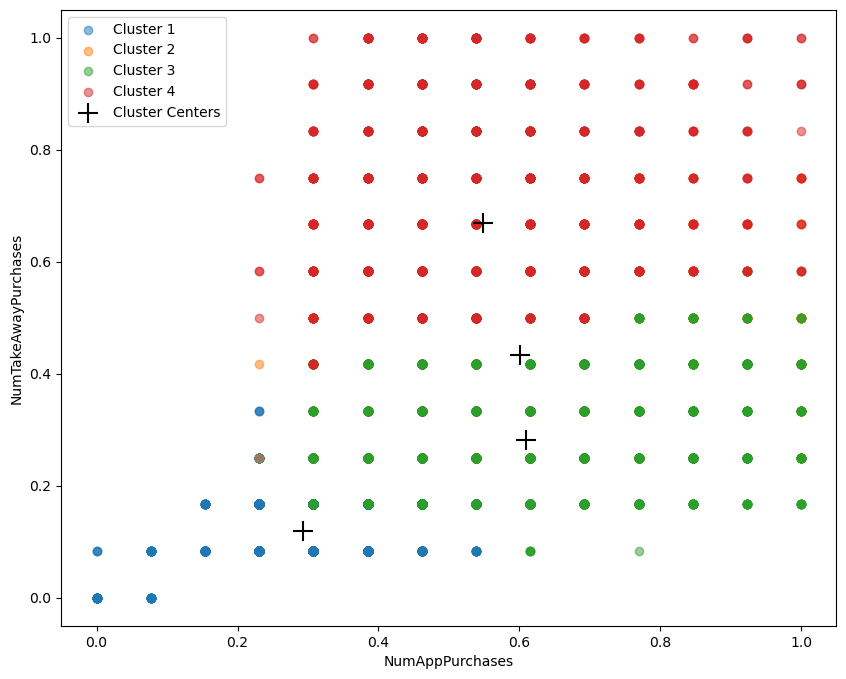

In [227]:
# Create a 2D plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the data points colored by cluster label
for i in range(k):
    ax.scatter(sales_vc_minmax.iloc[labels==i, 0], sales_vc_minmax.iloc[labels==i, 1], alpha=0.5, label="Cluster "+str(i+1))

# Plot the cluster centers
ax.scatter(centers[:,0], centers[:,1], color='black', marker='+', s=200, label="Cluster Centers")

# Add legend and axis labels
ax.set_xlabel('NumAppPurchases')
ax.set_ylabel('NumTakeAwayPurchases')
ax.legend()

# Show the plot
plt.show()


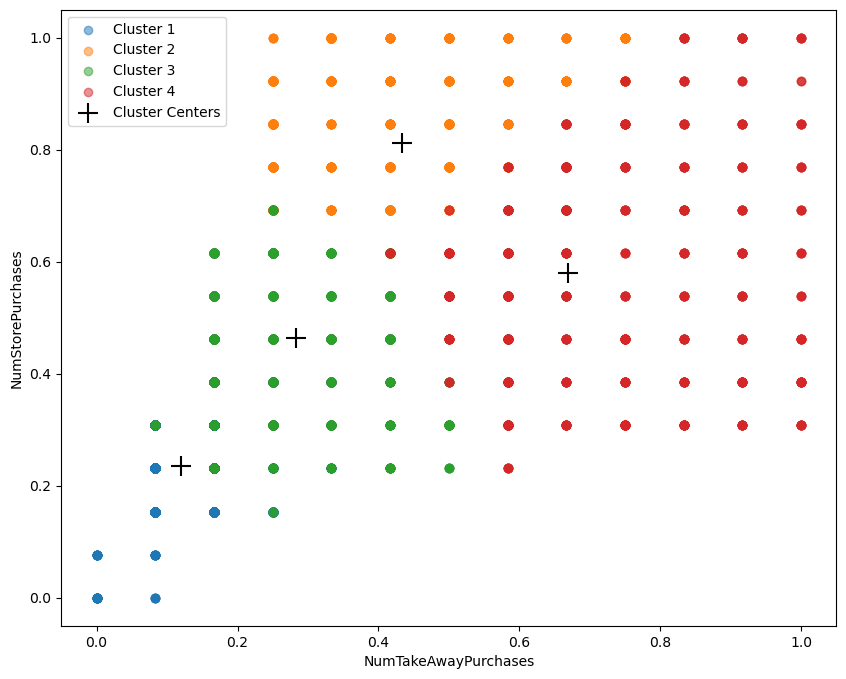

In [228]:
# Create a 2D plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the data points colored by cluster label
for i in range(k):
    ax.scatter(sales_vc_minmax.iloc[labels==i, 1], sales_vc_minmax.iloc[labels==i, 2], alpha=0.5, label="Cluster "+str(i+1))

# Plot the cluster centers
ax.scatter(centers[:,1], centers[:,2], color='black', marker='+', s=200, label="Cluster Centers")

# Add legend and axis labels
ax.set_xlabel('NumTakeAwayPurchases')
ax.set_ylabel('NumStorePurchases')
ax.legend()

# Show the plot
plt.show()

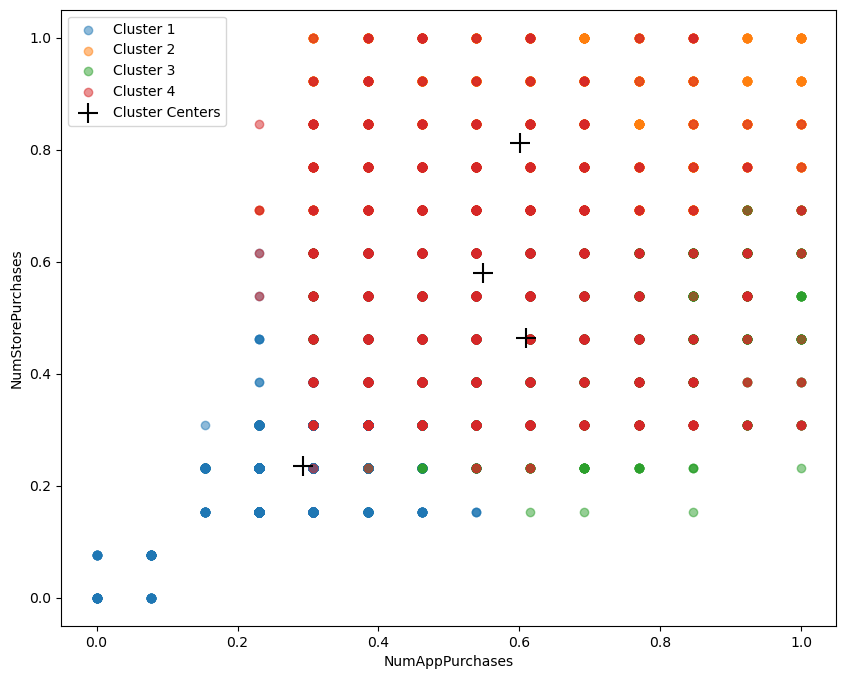

In [229]:
# Create a 2D plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the data points colored by cluster label
for i in range(k):
    ax.scatter(sales_vc_minmax.iloc[labels==i, 0], sales_vc_minmax.iloc[labels==i, 2], alpha=0.5, label="Cluster "+str(i+1))

# Plot the cluster centers
ax.scatter(centers[:,0], centers[:,2], color='black', marker='+', s=200, label="Cluster Centers")

# Add legend and axis labels
ax.set_xlabel('NumAppPurchases')
ax.set_ylabel('NumStorePurchases')
ax.legend()

# Show the plot
plt.show()

In [230]:
#and for m=4...

In [231]:
import numpy as np
import skfuzzy as fuzz

fuzzy=sales_vc_minmax.copy()

# Set the number of clusters
k = 4

# Set the fuzziness parameter
m = 4

# Initialize the cluster centers
centers, u, _, _, _, _, _ = fuzz.cluster.cmeans(fuzzy.T, k, m, error=0.005, maxiter=1000, init=None)

# Get the cluster labels for each data point
labels = np.argmax(u, axis=0)

# Print the cluster centers and labels
print("Cluster centers:")
print(centers)
print("Cluster labels:")
print(labels)

Cluster centers:
[[0.28484398 0.10873597 0.23257105]
 [0.53446782 0.30101186 0.44995154]
 [0.58148112 0.50209041 0.69431623]
 [0.58771914 0.44330519 0.62011157]]
Cluster labels:
[2 2 1 ... 2 0 0]


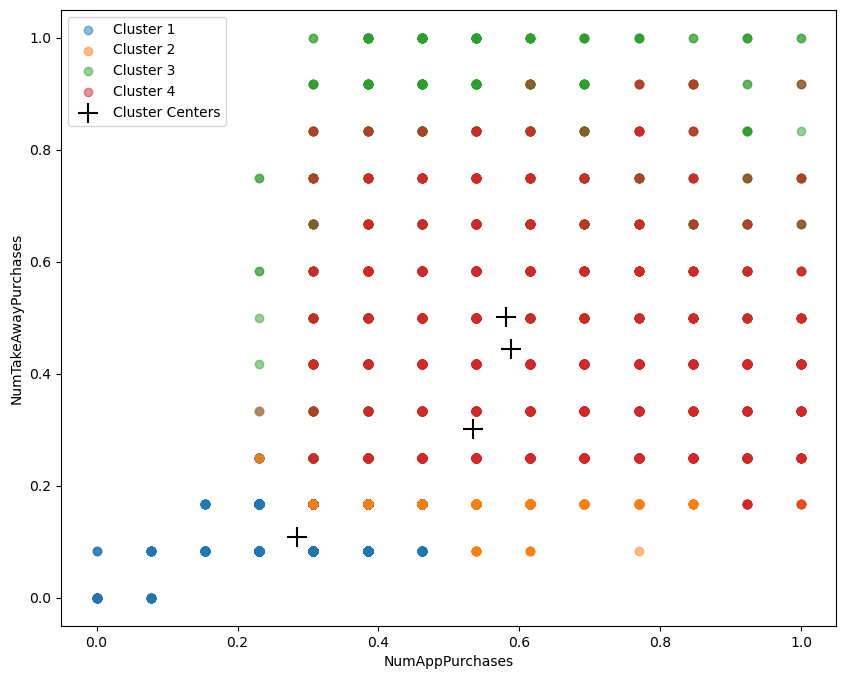

In [232]:
# Create a 2D plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the data points colored by cluster label
for i in range(k):
    ax.scatter(sales_vc_minmax.iloc[labels==i, 0], sales_vc_minmax.iloc[labels==i, 1], alpha=0.5, label="Cluster "+str(i+1))

# Plot the cluster centers
ax.scatter(centers[:,0], centers[:,1], color='black', marker='+', s=200, label="Cluster Centers")

# Add legend and axis labels
ax.set_xlabel('NumAppPurchases')
ax.set_ylabel('NumTakeAwayPurchases')
ax.legend()

# Show the plot
plt.show()

In [233]:
#fuzzy clustering doesn't seem appropriate...

Our most appropriate and effective solution was through k-means with a k=4. Hence, let's define our clusters:

In [234]:
cluster0 = sales_vc_k4[sales_vc_k4.k_label==0]
cluster1 = sales_vc_k4[sales_vc_k4.k_label==1]
cluster2 = sales_vc_k4[sales_vc_k4.k_label==2]
cluster3 = sales_vc_k4[sales_vc_k4.k_label==3]

In [235]:
sales_vc_k4.groupby(['k_label']).describe().transpose()

k_label                               0            1           2            3
NumAppPurchases      count  2925.000000  1749.000000  865.000000  1351.000000
                     mean      0.297988     0.622070    0.540062     0.598246
                     std       0.086582     0.169155    0.155256     0.183949
                     min       0.000000     0.230769    0.230769     0.230769
                     25%       0.230769     0.461538    0.461538     0.461538
                     50%       0.307692     0.615385    0.538462     0.538462
                     75%       0.384615     0.769231    0.615385     0.692308
                     max       0.538462     1.000000    1.000000     1.000000
NumTakeAwayPurchases count  2925.000000  1749.000000  865.000000  1351.000000
                     mean      0.124473     0.281351    0.723025     0.471194
                     std       0.061163     0.100344    0.154540     0.173495
                     min       0.000000     0.083333    0.500000     0.250000
                     25%       0.083333     0.166667    0.583333     0.333333
                     50%       0.083333     0.250000    0.666667     0.416667
                     75%       0.166667     0.333333    0.833333     0.583333
                     max       0.500000     0.583333    1.000000     1.000000
NumStorePurchases    count  2925.000000  1749.000000  865.000000  1351.000000
                     mean      0.236713     0.481374    0.496932     0.851506
                     std       0.072180     0.121608    0.154974     0.102681
                     min       0.000000     0.153846    0.230769     0.615385
                     25%       0.230769     0.384615    0.384615     0.769231
                     50%       0.230769     0.461538    0.461538     0.846154
                     75%       0.307692     0.615385    0.615385     0.923077
                     max       0.615385     0.692308    0.923077     1.000000

## 4.5. Cluster analysis & caracterization

In [236]:
cluster0 = sales_vc_k4[sales_vc_k4.k_label==0]
cluster1 = sales_vc_k4[sales_vc_k4.k_label==1]
cluster2 = sales_vc_k4[sales_vc_k4.k_label==2]
cluster3 = sales_vc_k4[sales_vc_k4.k_label==3]

In [237]:
cluster0.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label
count,2925.000000,2925.000000,2925.000000,2925.0
mean,0.297988,0.124473,0.236713,0.0
std,0.086582,0.061163,0.072180,0.0
min,0.000000,0.000000,0.000000,0.0
25%,0.230769,0.083333,0.230769,0.0
50%,0.307692,0.083333,0.230769,0.0
75%,0.384615,0.166667,0.307692,0.0
max,0.538462,0.500000,0.615385,0.0


In [238]:
cluster1.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label
count,1749.000000,1749.000000,1749.000000,1749.0
mean,0.622070,0.281351,0.481374,1.0
std,0.169155,0.100344,0.121608,0.0
min,0.230769,0.083333,0.153846,1.0
25%,0.461538,0.166667,0.384615,1.0
50%,0.615385,0.250000,0.461538,1.0
75%,0.769231,0.333333,0.615385,1.0
max,1.000000,0.583333,0.692308,1.0


In [239]:
cluster2.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label
count,865.000000,865.000000,865.000000,865.0
mean,0.540062,0.723025,0.496932,2.0
std,0.155256,0.154540,0.154974,0.0
min,0.230769,0.500000,0.230769,2.0
25%,0.461538,0.583333,0.384615,2.0
50%,0.538462,0.666667,0.461538,2.0
75%,0.615385,0.833333,0.615385,2.0
max,1.000000,1.000000,0.923077,2.0


In [240]:
cluster3.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label
count,1351.000000,1351.000000,1351.000000,1351.0
mean,0.598246,0.471194,0.851506,3.0
std,0.183949,0.173495,0.102681,0.0
min,0.230769,0.250000,0.615385,3.0
25%,0.461538,0.333333,0.769231,3.0
50%,0.538462,0.416667,0.846154,3.0
75%,0.692308,0.583333,0.923077,3.0
max,1.000000,1.000000,1.000000,3.0


-Cluster0: largest group; on average buys less from app, takeaway and store but especially less via takeaway

-Cluster1: less takeaway purchases, more restaurant purchases. App purchases are the highest among the categories and more than double than takeaway purchases

-Cluster2: smallest group; more takeaway purchases, slightly more app purchases than restaurant ones

-Cluster3: less takeaway purchases; around 10% more than takeway average app purchases; on average, the group that goes more to the restaurant 

## 4.6. Demographic & Marketing insights

<h2>4.6.1. Demographics<h2>

In [241]:
conclusions0 = pd.concat([cluster0.reset_index(drop=True), df.reset_index(drop=True)], axis=1, join='inner')
conclusions1 = pd.concat([cluster1.reset_index(drop=True), df.reset_index(drop=True)], axis=1, join='inner')
conclusions2 = pd.concat([cluster2.reset_index(drop=True), df.reset_index(drop=True)], axis=1, join='inner')
conclusions3 = pd.concat([cluster3.reset_index(drop=True), df.reset_index(drop=True)], axis=1, join='inner')

<h2> Demographics: Cluster 0<h2>

In [242]:
conclusions0.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,Recency,MntMeat&Fish,MntEntries,MntVegan&Vegetarian,MntDrinks,MntDesserts,...,Income,Kid_Younger6,Children_6to18,Age,Gender,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,2925.000000,2925.000000,2925.000000,2925.0,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,...,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000
mean,0.297988,0.124473,0.236713,0.0,50.100171,3140.297333,545.396239,2616.857265,565.508376,539.958291,...,76621.429949,0.448547,0.497778,46.617094,0.260513,0.081026,0.072821,0.083077,0.068376,0.017436
std,0.086582,0.061163,0.072180,0.0,28.678567,3396.857663,802.328128,3368.907290,826.486967,797.434211,...,30855.070484,0.539641,0.545230,11.957734,0.438989,0.272921,0.259886,0.276046,0.252433,0.130911
min,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3005.400000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.230769,0.083333,0.230769,0.0,26.000000,280.000000,40.000000,255.000000,40.000000,40.000000,...,51718.000000,0.000000,0.000000,38.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.307692,0.083333,0.230769,0.0,50.000000,1870.000000,180.000000,1080.000000,180.000000,180.000000,...,77195.000000,0.000000,0.000000,46.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.384615,0.166667,0.307692,0.0,75.000000,5110.000000,680.000000,3585.000000,700.000000,680.000000,...,101164.000000,1.000000,1.000000,56.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.538462,0.500000,0.615385,0.0,99.000000,14980.000000,3980.000000,14760.000000,3980.000000,3980.000000,...,153703.000000,2.000000,2.000000,75.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [243]:
conclusions0.groupby('Education')['Education'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Education,
BASIC,2.632479
GRADUATION,49.846154
HIGHSCHOOL,9.128205
MASTER,16.307692
PHD,22.085470


In [244]:
conclusions0.groupby('Marital_Status')['Marital_Status'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Marital_Status,
DIVORCED,8.649573
MARRIED,64.239316
SINGLE,22.905983
WIDOW,4.205128


In [245]:
conclusions0.groupby('Gender')['Gender'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Gender,
0,73.948718
1,26.051282


In [246]:
conclusions0.groupby('age_group')['age_group'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
age_group,
18-25,2.736914
25-35,16.079371
35-45,30.619227
45-65,44.577489
65+,5.987000


<h2> Demographics: Cluster 1<h2>

In [247]:
conclusions1.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,Recency,MntMeat&Fish,MntEntries,MntVegan&Vegetarian,MntDrinks,MntDesserts,...,Income,Kid_Younger6,Children_6to18,Age,Gender,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,1749.000000,1749.000000,1749.000000,1749.0,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,...,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000
mean,0.622070,0.281351,0.481374,1.0,49.861635,3170.406518,538.555746,2621.983133,569.890223,549.205260,...,76847.362493,0.431675,0.493997,46.753573,0.260149,0.078330,0.077187,0.084048,0.070898,0.018296
std,0.169155,0.100344,0.121608,0.0,28.324316,3405.940521,805.719885,3408.263882,847.732124,816.535911,...,31346.817381,0.536476,0.541835,11.967270,0.438841,0.268768,0.266964,0.277539,0.256727,0.134059
min,0.230769,0.083333,0.153846,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3005.400000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461538,0.166667,0.384615,1.0,26.000000,280.000000,40.000000,255.000000,40.000000,40.000000,...,51626.000000,0.000000,0.000000,38.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.615385,0.250000,0.461538,1.0,50.000000,1900.000000,180.000000,1050.000000,180.000000,180.000000,...,77858.000000,0.000000,0.000000,46.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.769231,0.333333,0.615385,1.0,74.000000,5230.000000,680.000000,3570.000000,700.000000,700.000000,...,101752.000000,1.000000,1.000000,57.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,0.583333,0.692308,1.0,99.000000,14920.000000,3960.000000,14760.000000,3980.000000,3940.000000,...,151072.000000,2.000000,2.000000,74.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [248]:
conclusions1.groupby('Education')['Education'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Education,
BASIC,2.515723
GRADUATION,48.713551
HIGHSCHOOL,9.662664
MASTER,16.466552
PHD,22.641509


In [249]:
conclusions1.groupby('Marital_Status')['Marital_Status'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Marital_Status,
DIVORCED,9.033734
MARRIED,63.236135
SINGLE,22.927387
WIDOW,4.802744


In [250]:
conclusions1.groupby('Gender')['Gender'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Gender,
0,73.985134
1,26.014866


In [251]:
conclusions1.groupby('age_group')['age_group'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
age_group,
18-25,2.690326
25-35,16.256440
35-45,29.593589
45-65,45.678306
65+,5.781339


<h2> Demographics: Cluster 2<h2>

In [252]:
conclusions2.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,Recency,MntMeat&Fish,MntEntries,MntVegan&Vegetarian,MntDrinks,MntDesserts,...,Income,Kid_Younger6,Children_6to18,Age,Gender,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,865.000000,865.000000,865.000000,865.0,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000,...,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000
mean,0.540062,0.723025,0.496932,2.0,49.010405,3015.825434,549.204624,2566.652023,547.054335,535.130636,...,76129.308324,0.449711,0.507514,46.583815,0.235838,0.077457,0.071676,0.073988,0.064740,0.018497
std,0.155256,0.154540,0.154974,0.0,27.875610,3266.549754,848.051747,3414.014617,830.169114,815.731183,...,31376.265048,0.535826,0.550884,11.836960,0.424767,0.267469,0.258100,0.261904,0.246209,0.134818
min,0.230769,0.500000,0.230769,2.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3005.400000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461538,0.583333,0.384615,2.0,26.000000,280.000000,40.000000,255.000000,40.000000,40.000000,...,51796.000000,0.000000,0.000000,38.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.538462,0.666667,0.461538,2.0,48.000000,1810.000000,160.000000,990.000000,180.000000,180.000000,...,76596.000000,0.000000,0.000000,46.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.615385,0.833333,0.615385,2.0,71.000000,4880.000000,680.000000,3450.000000,680.000000,648.000000,...,100393.000000,1.000000,1.000000,56.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,0.923077,2.0,99.000000,14920.000000,3960.000000,14745.000000,3980.000000,3940.000000,...,149137.000000,2.000000,2.000000,74.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [253]:
conclusions2.groupby('Education')['Education'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Education,
BASIC,2.658960
GRADUATION,49.132948
HIGHSCHOOL,9.132948
MASTER,15.722543
PHD,23.352601


In [254]:
conclusions2.groupby('Marital_Status')['Marital_Status'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Marital_Status,
DIVORCED,9.479769
MARRIED,63.583815
SINGLE,22.543353
WIDOW,4.393064


In [255]:
conclusions2.groupby('Gender')['Gender'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Gender,
0,76.416185
1,23.583815


In [256]:
conclusions2.groupby('age_group')['age_group'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
age_group,
18-25,2.780997
25-35,15.758980
35-45,29.200463
45-65,47.045191
65+,5.214368


<h2> Demographics: Cluster 3<h2>

In [257]:
conclusions3.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,Recency,MntMeat&Fish,MntEntries,MntVegan&Vegetarian,MntDrinks,MntDesserts,...,Income,Kid_Younger6,Children_6to18,Age,Gender,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,1351.000000,1351.000000,1351.000000,1351.0,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,...,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000
mean,0.598246,0.471194,0.851506,3.0,50.384160,3109.977054,536.793486,2639.758327,568.306440,559.138416,...,76661.964249,0.432272,0.493708,46.690600,0.259067,0.079201,0.073279,0.080681,0.068838,0.017024
std,0.183949,0.173495,0.102681,0.0,28.173794,3350.464051,810.316118,3459.608484,857.429539,832.187143,...,31483.298866,0.531631,0.545484,11.942724,0.438285,0.270152,0.260690,0.272445,0.253272,0.129410
min,0.230769,0.250000,0.615385,3.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3005.400000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461538,0.333333,0.769231,3.0,27.000000,275.000000,40.000000,247.500000,40.000000,40.000000,...,51626.000000,0.000000,0.000000,38.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.538462,0.416667,0.846154,3.0,50.000000,1870.000000,180.000000,1005.000000,180.000000,180.000000,...,77425.000000,0.000000,0.000000,46.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.692308,0.583333,0.923077,3.0,74.000000,5110.000000,680.000000,3555.000000,680.000000,700.000000,...,101730.000000,1.000000,1.000000,57.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,3.0,99.000000,14920.000000,3960.000000,14745.000000,3980.000000,3940.000000,...,149555.000000,2.000000,2.000000,74.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [258]:
conclusions3.groupby('Education')['Education'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Education,
BASIC,2.664693
GRADUATION,48.186528
HIGHSCHOOL,9.474463
MASTER,16.358253
PHD,23.316062


In [259]:
conclusions3.groupby('Marital_Status')['Marital_Status'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Marital_Status,
DIVORCED,9.400444
MARRIED,62.546262
SINGLE,23.464101
WIDOW,4.589193


In [260]:
conclusions3.groupby('Gender')['Gender'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
Gender,
0,74.093264
1,25.906736


In [261]:
conclusions3.groupby('age_group')['age_group'].agg(['count']).apply(lambda x: x/x.sum()*100, axis=0)

,count
age_group,
18-25,2.668643
25-35,16.011861
35-45,30.022239
45-65,45.737583
65+,5.559674


-All groups have similar demographics

-The group with the least ammount of average takeaway purchases is the group where there's slightly more married people

<h2>4.6.2. Marketing<h2>

In [262]:
conc_mkt0 = pd.concat([cluster0.reset_index(drop=True), mkt.reset_index(drop=True)], axis=1, join='inner')
conc_mkt1 = pd.concat([cluster1.reset_index(drop=True), mkt.reset_index(drop=True)], axis=1, join='inner')
conc_mkt2 = pd.concat([cluster2.reset_index(drop=True), mkt.reset_index(drop=True)], axis=1, join='inner')
conc_mkt3 = pd.concat([cluster3.reset_index(drop=True), mkt.reset_index(drop=True)], axis=1, join='inner')

In [263]:
conc_mkt0.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,CustomerID,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,2925.000000,2925.000000,2925.000000,2925.0,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000
mean,0.297988,0.124473,0.236713,0.0,20104.344615,0.080684,0.075897,0.078291,0.063248,0.012991
std,0.086582,0.061163,0.072180,0.0,8831.645218,0.272395,0.264879,0.268674,0.243450,0.113257
min,0.000000,0.000000,0.000000,0.0,5078.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.230769,0.083333,0.230769,0.0,12251.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.307692,0.083333,0.230769,0.0,20288.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.384615,0.166667,0.307692,0.0,27740.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.538462,0.500000,0.615385,0.0,35072.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [264]:
conc_mkt1.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,CustomerID,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,1749.000000,1749.000000,1749.000000,1749.0,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000,1749.000000
mean,0.622070,0.281351,0.481374,1.0,20104.986278,0.084048,0.073185,0.080046,0.067467,0.012007
std,0.169155,0.100344,0.121608,0.0,8896.981105,0.277539,0.260514,0.271442,0.250901,0.108947
min,0.230769,0.083333,0.153846,1.0,5078.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461538,0.166667,0.384615,1.0,12119.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.615385,0.250000,0.461538,1.0,20600.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.769231,0.333333,0.615385,1.0,27728.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,0.583333,0.692308,1.0,35066.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [265]:
conc_mkt2.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,CustomerID,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,865.000000,865.000000,865.000000,865.0,865.000000,865.000000,865.000000,865.000000,865.000000,865.000000
mean,0.540062,0.723025,0.496932,2.0,19972.406936,0.083237,0.067052,0.082081,0.068208,0.016185
std,0.155256,0.154540,0.154974,0.0,8900.269645,0.276400,0.250257,0.274647,0.252249,0.126259
min,0.230769,0.500000,0.230769,2.0,5117.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461538,0.583333,0.384615,2.0,12092.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.538462,0.666667,0.461538,2.0,20651.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.615385,0.833333,0.615385,2.0,27539.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,0.923077,2.0,35021.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [266]:
conc_mkt3.describe()

,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,k_label,CustomerID,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
count,1351.000000,1351.000000,1351.000000,1351.0,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000
mean,0.598246,0.471194,0.851506,3.0,20120.899334,0.084382,0.074759,0.078460,0.065137,0.013323
std,0.183949,0.173495,0.102681,0.0,8859.652748,0.278063,0.263100,0.268994,0.246859,0.114698
min,0.230769,0.250000,0.615385,3.0,5078.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461538,0.333333,0.769231,3.0,12165.500000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.538462,0.416667,0.846154,3.0,20777.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.692308,0.583333,0.923077,3.0,27560.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,3.0,35039.000000,1.000000,1.000000,1.000000,1.000000,1.000000


-Campaign 1 was the most successful but least successful on cluster 0;

-Campaign 2 was least successful on cluster 2 and most successful on cluster 3;

-Campaign 3 was the most successful on cluster 2;

-Campaign 3 was least successful on cluster 0 but only by a 2% margin;

-Campaign 4 was least successful on cluster 0;

-Campaign 5 was the least successful of all campaigns. It was least successful on cluster 1 (by a minimal margin);

# 5. 3rd Perspective - Consumer value

EXPLICAÇÃO DA PERSPECTIVA:

- Objetivos;
- Interesse;
- variáveis foco;

## 5.1. Dataframe Preparation

### 5.1.1. Creating the Dataframe

In [267]:
cstm_value = df [[ 'Recency', 'MntMeat&Fish', 'MntEntries',
       'MntVegan&Vegetarian', 'MntDrinks', 'MntDesserts',
       'MntAdditionalRequests', 'NumOfferPurchases', 'NumAppPurchases',
       'NumTakeAwayPurchases', 'NumStorePurchases','Income',]].copy()

### 5.1.2 Creating the variables for total spent and purchases

In [268]:
#Total amount spent by costumer 
cstm_value = cstm_value.assign(t_Mnt = cstm_value['MntMeat&Fish'] + cstm_value['MntEntries'] + cstm_value['MntVegan&Vegetarian']
                              +cstm_value['MntDrinks']+cstm_value['MntDesserts']+cstm_value['MntAdditionalRequests'])

#Total of purchases by costumer 
cstm_value = cstm_value.assign(t_Num =  cstm_value['NumAppPurchases'] 
                              +cstm_value['NumTakeAwayPurchases']+cstm_value['NumStorePurchases'])

#drop of the columns 
cstm_value = cstm_value.drop(columns=['MntMeat&Fish', 'MntEntries', 'MntVegan&Vegetarian',                              
                                      'MntDrinks', 'MntDesserts', 'MntAdditionalRequests', 'NumAppPurchases',                                    
                                      'NumTakeAwayPurchases', 'NumStorePurchases', 'NumOfferPurchases'])
cstm_value

,Recency,Income,t_Mnt,t_Num
CustomerID,,,,
11054,85,107153.0,14582.0,30
17117,96,96725.0,9743.0,25
31751,7,84836.0,9968.0,17
12947,54,100682.0,8503.0,23
11402,64,65350.0,577.0,8
...,...,...,...,...
23699,54,38970.0,534.0,9
23255,27,55552.0,958.0,9
5798,36,97461.0,12237.0,25


### 5.1.3 Standardization

In [269]:
from sklearn.preprocessing import MinMaxScaler

In [270]:
# create a new DataFrame with the columns you want to standardize
cols_to_standardize = ['Recency', 'Income', 't_Mnt', 't_Num']
data_to_standardize = cstm_value[cols_to_standardize]

# standardize the data
scaler = MinMaxScaler()
standardized_data = scaler.fit_transform(data_to_standardize)

# create a new DataFrame with standardized data and column names
standardized_df = pd.DataFrame(data=standardized_data, columns=cols_to_standardize, index=cstm_value.index)

# merge back into the original DataFrame
cstm_v_std = pd.merge(cstm_value.drop(cols_to_standardize, axis=1), standardized_df, left_index=True, right_index=True)

In [271]:
#cstm_v_std

## 5.2. K-means

x) Run K-means

In [272]:
ks = range(1, 11)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k, random_state=100).fit(cstm_v_std)
    inertias.append(model.inertia_)

x) Use elbow method to see the optimal number of clusters (K)

In [273]:
import plotly.graph_objs as go
# Convert the `range` object to a list
ks = list(range(1, 11))
# Create a trace for the plot
trace = go.Scatter(x=ks, y=inertias, mode='lines+markers')
# Set the layout of the plot
layout = go.Layout(title='K-means clustering: KS vs. Inertias',xaxis=dict(title='number of clusters', tickfont=dict(size=12)),
    yaxis=dict(title='inertia', tickfont=dict(size=12)),
    width=600,
    height=400,
    margin=dict(l=50, r=50, b=50, t=50))
# Create a Figure object and add the trace and layout to it
fig = go.Figure(data=[trace], layout=layout)
fig.show()

Note: Using the elbow method we can see that 4 clusters may be the best number of clusters

x) Silhouette analisys for optimal K

In [275]:
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(cstm_v_std)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(silhouette_score(cstm_v_std, cluster_labels))
# Create a trace for the plot
trace = go.Scatter(x=range_n_clusters, y=silhouette_avg, mode='lines+markers')
# Set the layout of the plot
layout = go.Layout(
    title='Silhouette analysis For Optimal K',xaxis=dict(title='Values of K', tickfont=dict(size=12)),
    yaxis=dict(title='Silhouette score', tickfont=dict(size=12)),
    width=600,
    height=400,
    margin=dict(l=50, r=50, b=50, t=50))
# Create a Figure object and add the trace and layout to it
fig = go.Figure(data=[trace], layout=layout)
fig.show()

Note: We can see the best option may be K=2, but we are interested in more segmentation of observation, therefore we will use the next best option witch is K=4

x) Dendogram

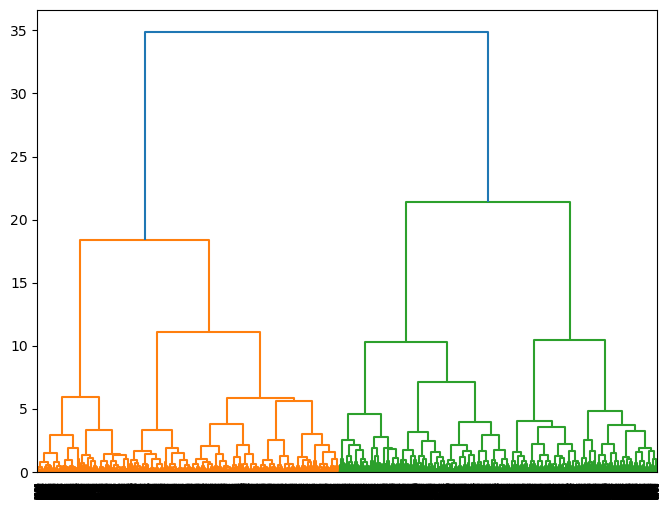

In [276]:
  from scipy.cluster import hierarchy
#from sklearn.cluster import AgglomerativeClustering - The option available in sklearn

# Get a random sample, as hierarchical clustering can take a lot of time to run.
sales_vc_sample = cstm_v_std.sample(n = 1000, random_state = 100)

# create clusters using the "ward method"
clusters = hierarchy.linkage(cstm_v_std , method="ward")

# create the dendrogram using the hierarchy.dendrogram() method.
plt.figure(figsize=(8, 6))
dendrogram = hierarchy.dendrogram(clusters)

### 5.2.1. Clustering, K=4

x) Create K-means model with 4 clusters

In [277]:
cstm_v_k4 = cstm_v_std.copy()
model_k4 = KMeans(n_clusters=4, random_state = 100).fit(cstm_v_k4)

x) Add new columns with clustering labels and analise

In [278]:
cstm_v_k4['k_label'] = model_k4.labels_

## 5.3. Cluster analysis & caracterization

In [279]:
cstm_v_k4.groupby(['k_label']).mean().transpose()

k_label,0,1,2,3
Recency,0.254448,0.245853,0.754008,0.754815
Income,0.329357,0.662639,0.672616,0.338301
t_Mnt,0.048416,0.411439,0.440522,0.053540
t_Num,0.275463,0.613120,0.626066,0.284362


- Cluster 0 and 2 for recency, are the consumers who consumed the least time
- Income: cluster 1 and 2 are the ones that have a salary much higher than the average, almost twice as much as the other clusters
- t_Mnt: cluster 1 and 2 spend more 
- t_Num: cluster 1 and 2 buy more in number  
- Cluster 1 represents the most regular and the most valauble costumers, since it has a lower recency and these clients consume more than the cluster 0 and 3.
- Cluster 2 has a higher recency but is the one with higher consumption considering the other clusters (very close to cluster 1)


In [280]:
cstm_v_k4.groupby(['k_label']).describe().transpose()

k_label                  0            1            2            3
Recency count  1944.000000  1576.000000  1577.000000  1793.000000
        mean      0.254448     0.245853     0.754008     0.754815
        std       0.149435     0.145890     0.147579     0.144159
        min       0.000000     0.000000     0.474747     0.505051
        25%       0.121212     0.121212     0.626263     0.636364
        50%       0.252525     0.247475     0.747475     0.757576
        75%       0.383838     0.373737     0.878788     0.878788
        max       0.505051     0.515152     1.000000     1.000000
Income  count  1944.000000  1576.000000  1577.000000  1793.000000
        mean      0.329357     0.662639     0.672616     0.338301
        std       0.126281     0.111550     0.110840     0.129817
        min       0.000000     0.323805     0.315291     0.003136
        25%       0.238035     0.581145     0.589987     0.243452
        50%       0.330142     0.658475     0.674182     0.344648
        75%       0.424347     0.743748     0.754628     0.436720
        max       0.652954     0.982541     1.000000     0.693406
t_Mnt   count  1944.000000  1576.000000  1577.000000  1793.000000
        mean      0.048416     0.411439     0.440522     0.053540
        std       0.049499     0.175024     0.180164     0.053929
        min       0.000000     0.103558     0.125099     0.000202
        25%       0.013507     0.272117     0.288942     0.014266
        50%       0.025819     0.386853     0.420774     0.029008
        75%       0.073541     0.528381     0.566777     0.080844
        max       0.294658     0.981979     1.000000     0.357084
t_Num   count  1944.000000  1576.000000  1577.000000  1793.000000
        mean      0.275463     0.613120     0.626066     0.284362
        std       0.099808     0.113268     0.110311     0.107327
        min       0.000000     0.333333     0.333333     0.000000
        25%       0.194444     0.527778     0.555556     0.194444
        50%       0.250000     0.611111     0.611111     0.250000
        75%       0.333333     0.694444     0.694444     0.361111
        max       0.583333     1.000000     1.000000     0.611111

### Graphic Visualization of Clusters

In [281]:
cluster0 = cstm_v_k4[cstm_v_k4.k_label==0]
cluster1 = cstm_v_k4[cstm_v_k4.k_label==1]
cluster2 = cstm_v_k4[cstm_v_k4.k_label==2]
cluster3 = cstm_v_k4[cstm_v_k4.k_label==3]

#### Histograms

x) `Recency` Histograms by Clusters

In [298]:
import plotly.graph_objs as go

# Create a list of histogram traces for each cluster
hist_traces = []
colors = ['red', 'yellow', 'green', 'blue']
cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']

for i, cluster in enumerate([cluster0, cluster1, cluster2, cluster3]):
    trace = go.Histogram(x=cluster['Recency'], nbinsx=20, name=cluster_names[i], marker=dict(color=colors[i]))
    hist_traces.append(trace)

# Create layout for the plot
layout = go.Layout(title='Recency Histograms by Cluster', xaxis=dict(title='Recency'), width=600, height=400)

# Create figure and plot histogram traces
fig = go.Figure(data=hist_traces, layout=layout)
fig.show()

In [283]:
import plotly.graph_objs as go
# Create a list of histogram traces for each cluster
hist_traces = []
colors = ['red', 'yellow', 'green', 'blue']
cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']
for i, cluster in enumerate([cluster0, cluster1, cluster2, cluster3]):
    trace = go.Histogram(x=cluster['Recency'], nbinsx=20, name=cluster_names[i], marker=dict(color=colors[i]))
    hist_traces.append(trace)
# Create layout for the plot and adjust the size
layout = go.Layout(title='Recency Histograms by Cluster', xaxis=dict(title='Recency'), width=600, height=400)
# Create figure and plot histogram traces
fig = go.Figure(data=hist_traces, layout=layout)
fig.show()

x) Income Histograms by Clusters

In [299]:
import plotly.graph_objs as go

# Create a list of histogram traces for each cluster
hist_traces = []
colors = ['red', 'yellow', 'green', 'blue']
cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']

for i, cluster in enumerate([cluster0, cluster1, cluster2, cluster3]):
    trace = go.Histogram(x=cluster['Income'], nbinsx=20, name=cluster_names[i], marker=dict(color=colors[i]))
    hist_traces.append(trace)

# Create layout for the plot
layout = go.Layout(title='Income Histograms by Cluster', xaxis=dict(title='Income'), width=600, height=400)

# Create figure and plot histogram traces
fig = go.Figure(data=hist_traces, layout=layout)
fig.show()

x) Total Amount Expenditure Histograms by Cluster

In [300]:
# Create a list of histogram traces for each cluster
hist_traces = []
colors = ['red', 'yellow', 'green', 'blue']
cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']

for i, cluster in enumerate([cluster0, cluster1, cluster2, cluster3]):
    trace = go.Histogram(x=cluster['t_Mnt'], nbinsx=20, name=cluster_names[i], marker=dict(color=colors[i]))
    hist_traces.append(trace)

# Create layout for the plot
layout = go.Layout(title='Total Amount Expenditure Histograms by Cluster', xaxis=dict(title='Total Monthly Expenditure'), width=600, height=400)

# Create figure and plot histogram traces
fig = go.Figure(data=hist_traces, layout=layout)
fig.show()

x) Total Number of Purchases Histograms by Cluster

In [302]:
# Create a list of histogram traces for each cluster
hist_traces = []
colors = ['red', 'yellow', 'green', 'blue']
cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']

for i, cluster in enumerate([cluster0, cluster1, cluster2, cluster3]):
    trace = go.Histogram(x=cluster['t_Num'], nbinsx=20, name=cluster_names[i], marker=dict(color=colors[i]))
    hist_traces.append(trace)

# Create layout for the plot
layout = go.Layout(title='Total Number of Purchases Histograms by Cluster', xaxis=dict(title='Total Number of Purchases'), width=600, height=400)

# Create figure and plot histogram traces
fig = go.Figure(data=hist_traces, layout=layout)
fig.show()

#### Scatterplots

x) Get centroids in array

In [287]:
centroids = model_k4.cluster_centers_
centroids

array([[0.25457661, 0.32941287, 0.04839683, 0.27542131],
       [0.24569505, 0.66263129, 0.41142545, 0.61301587],
       [0.75367251, 0.67278052, 0.4408517 , 0.62632191],
       [0.75510399, 0.33847403, 0.05370173, 0.28465255]])

In [288]:
centroid_0_Rnc = centroids[0,0]
centroid_1_Rnc = centroids[1,0]
centroid_2_Rnc = centroids[2,0]
centroid_3_Rnc = centroids[3,0]
centroid_0_Inc = centroids[0,1]
centroid_1_Inc = centroids[1,1]
centroid_2_Inc = centroids[2,1]
centroid_3_Inc = centroids[3,1]
centroid_0_Mnt = centroids[0,2]
centroid_1_Mnt = centroids[1,2]
centroid_2_Mnt = centroids[2,2]
centroid_3_Mnt = centroids[3,2]
centroid_0_Num = centroids[0,3]
centroid_1_Num = centroids[1,3]
centroid_2_Num = centroids[2,3]
centroid_3_Num = centroids[3,3]

x) Scatterplot t_Mnt - tNum

In [289]:
import plotly.graph_objs as go
# Create a trace for customer data
trace_cstm = go.Scatter(x=cstm_v_k4.t_Mnt,y=cstm_v_k4.t_Num,mode='markers',
                        marker=dict(size=10,color=cstm_v_k4.k_label,colorscale='Viridis'),name='Customer Data')
# Create traces for centroids
trace_centroid_0 = go.Scatter(x=[centroid_0_Mnt],y=[centroid_0_Num],mode='markers',
                              marker=dict(size=12,color='blue',symbol='x'),name='Centroid 0')
trace_centroid_1 = go.Scatter(x=[centroid_1_Mnt],y=[centroid_1_Num],mode='markers',
                              marker=dict(size=12,color='orange',symbol='star'),name='Centroid 1')
trace_centroid_2 = go.Scatter(x=[centroid_2_Mnt],y=[centroid_2_Num],mode='markers',
                              marker=dict(size=12,color='green',symbol='x'),name='Centroid 2')
trace_centroid_3 = go.Scatter(x=[centroid_3_Mnt],y=[centroid_3_Num],mode='markers',
                              marker=dict(size=12,color='red',symbol='x'),name='Centroid 3')
# Combine all traces into a list
data = [trace_cstm, trace_centroid_0, trace_centroid_1, trace_centroid_2, trace_centroid_3]
# Create a layout
layout = go.Layout(title='K-Means Clustering',xaxis_title='t_Mnt',yaxis_title='t_Num')
# Create a figure object that includes both data and layout
fig = go.Figure(data=data, layout=layout)
# Show the plot
fig.show()

- The purple and yellow are the clusters 0 and 3 because they are the ones that spend less and consume less often -> they are the ones that are less valuable and the ones that present a more similar consumption pattern among them (obs less dispersion).
- The blue and green are the clusters 1 and 2, the ones that spend and consume more.

In [290]:
# Create a trace for customer data
trace_cstm = go.Scatter(x=cstm_v_k4.Income, y=cstm_v_k4.t_Mnt, mode='markers',
                        marker=dict(size=10, color=cstm_v_k4.k_label, colorscale='Viridis'),
                        name='Customer Data')
# Create traces for centroids
trace_centroid_0 = go.Scatter(x=[centroid_0_Inc], y=[centroid_0_Mnt], mode='markers',
                              marker=dict(size=12, color='blue', symbol='x'),
                              name='Centroid 0')
trace_centroid_1 = go.Scatter(x=[centroid_1_Inc], y=[centroid_1_Mnt], mode='markers',
                              marker=dict(size=12, color='orange', symbol='star'),
                              name='Centroid 1')
trace_centroid_2 = go.Scatter(x=[centroid_2_Inc], y=[centroid_2_Mnt], mode='markers',
                              marker=dict(size=12, color='green', symbol='x'),
                              name='Centroid 2')
trace_centroid_3 = go.Scatter(x=[centroid_3_Inc], y=[centroid_3_Mnt], mode='markers',
                              marker=dict(size=12, color='red', symbol='x'),
                              name='Centroid 3')
# Combine all traces into a list
data = [trace_cstm, trace_centroid_0, trace_centroid_1, trace_centroid_2, trace_centroid_3]
# Create a layout
layout = go.Layout(title='K-Means Clustering', xaxis_title='Income', yaxis_title='t_Mnt')
# Create a figure object that includes both data and layout
fig = go.Figure(data=data, layout=layout)
# Show the plot
fig.show()

- The purple and yellow observations represent clusters 0 and 3, who spend less and earn less
- The blue and green is cluster 1 and 2, that have a higher income and spend more.
- The centroids all seem centered

In [291]:
# Create a trace for customer data
trace_cstm = go.Scatter(x=cstm_v_k4.Income, y=cstm_v_k4.t_Num, mode='markers', 
                        marker=dict(size=10, color=cstm_v_k4.k_label, colorscale='Viridis'), name='Customer Data')
# Create traces for centroids
trace_centroid_0 = go.Scatter(x=[centroid_0_Inc], y=[centroid_0_Num], mode='markers',
                              marker=dict(size=12, color='blue', symbol='x'), name='Centroid 0')
trace_centroid_1 = go.Scatter(x=[centroid_1_Inc], y=[centroid_1_Num], mode='markers',
                              marker=dict(size=12, color='orange', symbol='star'), name='Centroid 1')
trace_centroid_2 = go.Scatter(x=[centroid_2_Inc], y=[centroid_2_Num], mode='markers',
                              marker=dict(size=12, color='green', symbol='x'), name='Centroid 2')
trace_centroid_3 = go.Scatter(x=[centroid_3_Inc], y=[centroid_3_Num], mode='markers',
                              marker=dict(size=12, color='red', symbol='x'), name='Centroid 3')
# Combine all traces into a list
data = [trace_cstm, trace_centroid_0, trace_centroid_1, trace_centroid_2, trace_centroid_3]
# Create a layout
layout = go.Layout(title='K-Means Clustering', xaxis_title='Income', yaxis_title='t_Num')
# Create a figure object that includes both data and layout
fig = go.Figure(data=data, layout=layout)
# Show the plot
fig.show()

In [292]:
# Create a trace for customer data
trace_cstm = go.Scatter(x=cstm_v_k4.Income,y=cstm_v_k4.Recency,mode='markers',
                        marker=dict(size=10,color=cstm_v_k4.k_label,colorscale='Viridis'),name='Customer Data')
# Create traces for centroids
trace_centroid_0 = go.Scatter(x=[centroid_0_Inc],y=[centroid_0_Rnc],mode='markers',
                              marker=dict(size=12,color='blue',symbol='x'),name='Centroid 0')
trace_centroid_1 = go.Scatter(x=[centroid_1_Inc],y=[centroid_1_Rnc],mode='markers',
                              marker=dict(size=12,color='orange',symbol='star'),name='Centroid 1')
trace_centroid_2 = go.Scatter(x=[centroid_2_Inc],y=[centroid_2_Rnc],mode='markers',
                              marker=dict(size=12,color='green',symbol='x'),name='Centroid 2')
trace_centroid_3 = go.Scatter(x=[centroid_3_Inc],y=[centroid_3_Rnc],mode='markers',
                              marker=dict(size=12,color='red',symbol='star'),name='Centroid 3')
# Combine all traces into a list
data = [trace_cstm, trace_centroid_0, trace_centroid_1, trace_centroid_2, trace_centroid_3]
# Create a layout
layout = go.Layout(title='K-Means Clustering',xaxis_title='Income',yaxis_title='Recency')
# Create a figure object that includes both data and layout
fig = go.Figure(data=data, layout=layout)
# Show the plot
fig.show()

- blue cluster 1
- green cluster 2
- yellow cluster 3
- purple cluster 0

In [293]:
# Create a trace for customer data
trace_cstm = go.Scatter(x=cstm_v_k4.t_Mnt, y=cstm_v_k4.Recency, mode='markers',
                        marker=dict(size=10, color=cstm_v_k4.k_label, colorscale='Viridis'), name='Customer Data')
# Create traces for centroids
trace_centroid_0 = go.Scatter(x=[centroid_0_Mnt], y=[centroid_0_Rnc], mode='markers',
                              marker=dict(size=12, color='blue', symbol='x'), name='Centroid 0')
trace_centroid_1 = go.Scatter(x=[centroid_1_Mnt], y=[centroid_1_Rnc], mode='markers',
                              marker=dict(size=12, color='orange', symbol='star'), name='Centroid 1')
trace_centroid_2 = go.Scatter(x=[centroid_2_Mnt], y=[centroid_2_Rnc], mode='markers',
                              marker=dict(size=12, color='green', symbol='x'), name='Centroid 2')
trace_centroid_3 = go.Scatter(x=[centroid_3_Mnt], y=[centroid_3_Rnc], mode='markers',
                              marker=dict(size=12, color='red', symbol='star'), name='Centroid 3')
# Combine all traces into a list
data = [trace_cstm, trace_centroid_0, trace_centroid_1, trace_centroid_2, trace_centroid_3]
# Create a layout
layout = go.Layout(title='K-Means Clustering', xaxis_title='t_Mnt', yaxis_title='Recency')
# Create a figure object that includes both data and layout
fig = go.Figure(data=data, layout=layout)
# Show the plot
fig.show()

- yellow spends less but has a lower recency.
- blue has a higher income and a lower recency, go there more often.

In [310]:
# Create a trace for customer data
trace_cstm = go.Scatter(x=cstm_v_k4.t_Num,y=cstm_v_k4.Recency,mode='markers',
                        marker=dict(size=10,color=cstm_v_k4.k_label,colorscale='Viridis'),name='Customer Data')
# Create traces for centroids
trace_centroid_0 = go.Scatter(x=[centroid_0_Num],y=[centroid_0_Rnc],mode='markers',
                              marker=dict(size=12,color='blue',symbol='x'),name='Centroid 0')
trace_centroid_1 = go.Scatter(x=[centroid_1_Num],y=[centroid_1_Rnc],mode='markers',
                              marker=dict(size=12,color='orange',symbol='star'),name='Centroid 1')
trace_centroid_2 = go.Scatter(x=[centroid_2_Num],y=[centroid_2_Rnc],mode='markers',
                              marker=dict(size=12,color='green',symbol='x'),name='Centroid 2')
trace_centroid_3 = go.Scatter(x=[centroid_3_Num],y=[centroid_3_Rnc],mode='markers',
                              marker=dict(size=12,color='red',symbol='star'),name='Centroid 3')
# Combine all traces into a list
data = [trace_cstm, trace_centroid_0, trace_centroid_1, trace_centroid_2, trace_centroid_3]
# Create a layout
layout = go.Layout(title='K-Means Clustering',xaxis_title='t_Num',yaxis_title='Recency')
# Create a figure object that includes both data and layout
fig = go.Figure(data=data, layout=layout)
# Show the plot
fig.show()

In [332]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight='heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
        

    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

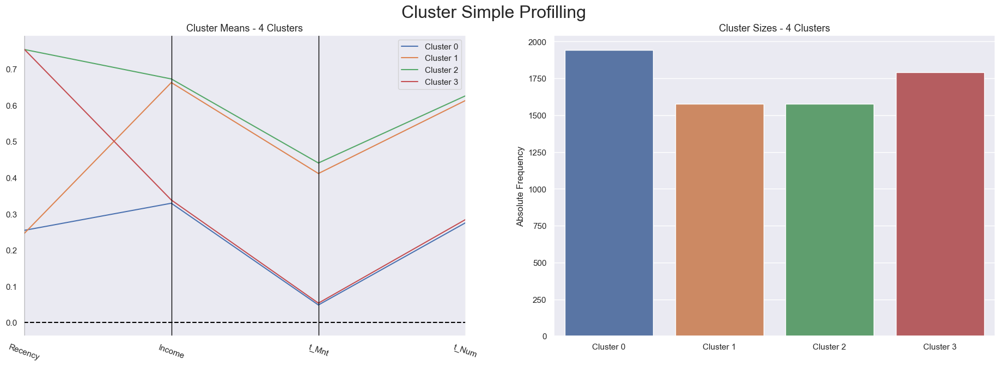

In [333]:
cluster_profiles(cstm_v_k4,["k_label"], figsize=(23, 7))

- Cluster 0 are the individuals that haven't bought anything in a while and they have a lower income, that could a reason why they dont't spent that much. We can see them as the less valuable costumers. 
- Cluster 1 are the costumers that have bought in less days and have a higher income, that is why they spent more and consume more in terms of number. We say they are the more valuables costumers.
----------------------------------------------------------------------------------------------------------------------
- We should focus on keeping the clients from cluster 1 and 2. 
- Cluster 0 and 3 are the ones with more individuals, so we should find ways to attract this consumers.

## 5.4. Business & Marketing insights

### 5.4.1 Creating the dataframe

In [364]:
df_copy = df.copy()
cols_to_drop = ['Recency','Income', 'MntMeat&Fish', 'MntEntries', 'MntVegan&Vegetarian', 'MntDrinks', 'MntDesserts', 'MntAdditionalRequests', 'NumAppPurchases', 'NumTakeAwayPurchases', 'NumStorePurchases', 'Name']
df_copy = df.drop(columns=cols_to_drop).copy()
bus_mkt0 = pd.merge(cstm_v_k4, df_copy, on='CustomerID')

cols_to_drop2 = ['Recency','Income','t_Mnt','t_Num']
bus_mkt0 = bus_mkt0.drop(columns=cols_to_drop2).copy()
bus_mkt = pd.merge(bus_mkt0, cstm_value, on='CustomerID')
#bus_mkt.columns

In [365]:
df_copy = df.copy()
cols_to_drop = ['Recency','Income', 'MntMeat&Fish', 'MntEntries', 'MntVegan&Vegetarian', 'MntDrinks', 'MntDesserts', 'MntAdditionalRequests', 'NumAppPurchases', 'NumTakeAwayPurchases', 'NumStorePurchases', 'Name']
df_copy = df.drop(columns=cols_to_drop).copy()

In [366]:
bus_mkt = pd.merge(cstm_v_k4, df_copy, on='CustomerID')

In [367]:
bus_mkt

,Recency,Income,t_Mnt,t_Num,k_label,Date_Adherence,NumOfferPurchases,NumAppVisitsMonth,Complain,Education,...,Kid_Younger6,Children_6to18,Age,age_group,Gender,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5
CustomerID,,,,,,,,,,,,,,,,,,,,,
11054,0.858586,0.691103,0.438193,0.833333,2,2021-03-18 00:00:00,1,6,0,GRADUATION,...,0,1,60,45-65,0,0,0,0,0,0
17117,0.969697,0.621905,0.292612,0.694444,2,2021-03-01 00:00:00,3,6,0,MASTER,...,0,1,43,35-45,0,0,0,0,0,0
31751,0.070707,0.543012,0.299381,0.472222,1,2021-11-01 00:00:00,3,9,0,GRADUATION,...,0,1,61,45-65,0,1,0,1,0,0
12947,0.545455,0.648163,0.255307,0.638889,2,2022-05-19 00:00:00,3,3,0,GRADUATION,...,0,1,52,45-65,0,0,0,0,0,0
11402,0.646465,0.413707,0.016854,0.222222,3,2021-01-01 00:00:00,2,8,0,GRADUATION,...,1,1,59,45-65,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23699,0.545455,0.238654,0.015560,0.250000,3,2021-11-27 00:00:00,2,7,0,MASTER,...,1,0,45,35-45,0,0,0,0,0,0
23255,0.272727,0.348689,0.028316,0.250000,0,2021-03-25 00:00:00,3,8,0,GRADUATION,...,1,1,39,35-45,0,0,0,0,0,0
5798,0.363636,0.626789,0.367644,0.694444,1,2022-04-12 00:00:00,1,4,0,GRADUATION,...,0,0,69,65+,0,0,0,0,0,0


In [368]:
bus_mkt ['total_adhered'] = bus_mkt['Cmp1'] + bus_mkt['Cmp2'] + bus_mkt['Cmp3'] + bus_mkt['Cmp4']+ bus_mkt['Cmp5']

In [369]:
mkt_greater_than_1 = bus_mkt.loc[bus_mkt['total_adhered']>1]
mkt_greater_than_1

,Recency,Income,t_Mnt,t_Num,k_label,Date_Adherence,NumOfferPurchases,NumAppVisitsMonth,Complain,Education,...,Children_6to18,Age,age_group,Gender,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,total_adhered
CustomerID,,,,,,,,,,,,,,,,,,,,,
31751,0.070707,0.543012,0.299381,0.472222,1,2021-11-01 00:00:00,3,9,0,GRADUATION,...,1,61,45-65,0,1,0,1,0,0,2
20714,0.777778,0.436540,0.199740,0.611111,2,2021-09-07 00:00:00,6,8,0,PHD,...,1,53,45-65,0,0,1,0,1,1,3
22814,0.393939,0.774986,0.650413,0.527778,1,2021-07-01 00:00:00,0,2,0,GRADUATION,...,0,64,45-65,0,0,0,1,1,0,2
22559,0.141414,0.856348,0.738953,0.583333,1,2022-05-20 00:00:00,1,1,0,GRADUATION,...,0,41,35-45,0,0,1,1,1,0,3
23627,0.616162,0.941910,0.466052,0.694444,2,2020-12-12 00:00:00,1,3,0,GRADUATION,...,0,59,45-65,1,1,0,1,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25142,0.282828,0.908492,0.699602,0.666667,1,2022-02-12 00:00:00,1,2,0,GRADUATION,...,0,50,45-65,0,0,1,1,1,1,4
31928,0.434343,0.635960,0.617199,0.722222,1,2021-04-29 00:00:00,1,2,0,GRADUATION,...,0,46,45-65,0,0,1,0,1,0,2
6827,1.000000,0.963204,0.895094,0.555556,2,2021-09-21 00:00:00,1,1,0,MASTER,...,0,30,25-35,0,0,0,1,1,0,2


### 5.4.2. Group by to characterize demographically the  clusters

x) BY `Age` and `age_group`

In [370]:
avg_age = bus_mkt.groupby('k_label')['Age'].mean()
avg_age

k_label
0    44.669753
1    48.651015
2    48.437540
3    44.980480
Name: Age, dtype: float64

In [371]:
#mode_age_group= bus_mkt.groupby('k_label')['age_group'].apply(lambda x: x.mode()[0])
#mode_age_group

In [372]:
count_age_g = bus_mkt.groupby('k_label')['age_group'].value_counts()
count_age_g

k_label       
0        45-65    778
         35-45    662
         25-35    415
         65+       60
         18-25     27
1        45-65    781
         35-45    408
         25-35    194
         65+      137
         18-25     56
2        45-65    754
         35-45    407
         25-35    205
         65+      152
         18-25     59
3        45-65    729
         35-45    615
         25-35    353
         65+       61
         18-25     33
Name: age_group, dtype: int64

In [373]:
# Calculate mean income by cluster and age group
mean_income = bus_mkt.groupby(['k_label', 'age_group'])['Income'].mean()
mean_income

k_label  age_group
0        18-25        0.208616
         25-35        0.268517
         35-45        0.322946
         45-65        0.369789
         65+          0.356369
1        18-25        0.703999
         25-35        0.696338
         35-45        0.650289
         45-65        0.652224
         65+          0.694163
2        18-25        0.723929
         25-35        0.695454
         35-45        0.665844
         45-65        0.658756
         65+          0.708779
3        18-25        0.228177
         25-35        0.273049
         35-45        0.329126
         45-65        0.381048
         65+          0.362607
Name: Income, dtype: float64

x) BY `Gender`

In [374]:
#mode_gen= bus_mkt.groupby('k_label')['Gender'].apply(lambda x: x.mode()[0])
#mode_gen

In [375]:
count_gen = bus_mkt.groupby('k_label')['Gender'].value_counts()
count_gen

k_label  Gender
0        0         1419
         1          525
1        0         1169
         1          407
2        0         1146
         1          431
3        0         1318
         1          475
Name: Gender, dtype: int64

x) BY `Marital Status`

In [376]:
#mode_mstatus= bus_mkt.groupby('k_label')['Marital_Status'].apply(lambda x: x.mode()[0])
#mode_mstatus

In [377]:
count_mstatus = bus_mkt.groupby('k_label')['Marital_Status'].value_counts()
count_mstatus

k_label  Marital_Status
0        MARRIED           1253
         SINGLE             467
         DIVORCED           170
         WIDOW               54
1        MARRIED           1021
         SINGLE             328
         DIVORCED           148
         WIDOW               79
2        MARRIED           1038
         SINGLE             317
         DIVORCED           161
         WIDOW               61
3        MARRIED           1190
         SINGLE             408
         DIVORCED           151
         WIDOW               44
Name: Marital_Status, dtype: int64

x) BY `Education`

In [378]:
#mode_edu= bus_mkt.groupby('k_label')['Education'].apply(lambda x: x.mode()[0])
#mode_edu

In [379]:
count_edu = bus_mkt.groupby('k_label')['Education'].value_counts()
count_edu

k_label  Education 
0        GRADUATION    998
         PHD           352
         MASTER        298
         HIGHSCHOOL    201
         BASIC          95
1        GRADUATION    795
         PHD           377
         MASTER        269
         HIGHSCHOOL    135
2        GRADUATION    785
         PHD           391
         MASTER        282
         HIGHSCHOOL    118
         BASIC           1
3        GRADUATION    881
         PHD           357
         MASTER        273
         HIGHSCHOOL    203
         BASIC          79
Name: Education, dtype: int64

x) BY `t_kids`

In [380]:
bus_mkt["t_kids"]=(bus_mkt['Kid_Younger6'] +bus_mkt['Children_6to18'])

In [381]:
#mode_t_kid= bus_mkt.groupby('k_label')['t_kids'].apply(lambda x: x.mode()[0])
#mode_t_kid

In [382]:
count_t_kid = bus_mkt.groupby('k_label')['t_kids'].value_counts()
count_t_kid

k_label  t_kids
0        1         1129
         2          525
         0          222
         3           65
         4            3
1        0          791
         1          641
         2          129
         3           13
         4            2
2        0          851
         1          618
         2          100
         3            8
3        1         1050
         2          503
         0          181
         3           56
         4            3
Name: t_kids, dtype: int64

x) BY `Children_6to18`

In [383]:
#mode_kid_6to18= bus_mkt.groupby('k_label')['Children_6to18'].apply(lambda x: x.mode()[0])
#mode_kid_6to18

In [384]:
count_kid_6to18 = bus_mkt.groupby('k_label')['Children_6to18'].value_counts()
count_kid_6to18

k_label  Children_6to18
0        0                 1001
         1                  900
         2                   43
1        0                  865
         1                  669
         2                   42
2        0                  930
         1                  627
         2                   20
3        1                  876
         0                  870
         2                   47
Name: Children_6to18, dtype: int64

### 5.4.2. Group by to characterize the clusters in a marketing view point

- fazer o loyalty - quem tem maior rácio de campanhas aderidas/total de campanhas e fazer group by
- criar variável do n~º de dias sócio (+dias e + t_MNT e + loyalty) pe
- pensar em fazer basic group by entre variáveis de education pe e a campaing pe

In [385]:
bus_mkt.columns

Index(['Recency', 'Income', 't_Mnt', 't_Num', 'k_label', 'Date_Adherence',
       'NumOfferPurchases', 'NumAppVisitsMonth', 'Complain', 'Education',
       'Marital_Status', 'Kid_Younger6', 'Children_6to18', 'Age', 'age_group',
       'Gender', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'total_adhered',
       't_kids'],
      dtype='object')

x) BY `Complain`

In [386]:
count_complain = bus_mkt.groupby('k_label')['Complain'].value_counts()
count_complain

k_label  Complain
0        0           1924
         1             20
1        0           1564
         1             12
2        0           1557
         1             20
3        0           1776
         1             17
Name: Complain, dtype: int64

In [387]:
# Calculate ratio of Complain equals to 1 by cluster
complain_ratio = count_complain.loc[:, 1] / count_complain.groupby('k_label').sum()
complain_ratio

k_label
0    0.010288
1    0.007614
2    0.012682
3    0.009481
Name: Complain, dtype: float64

Note: Clusters 0 and 1 have higher complain rates (1ª-0 ; 2ª-1)

x) BY `NumAppVisitsMonth`

In [388]:
count_AppVisits = bus_mkt.groupby('k_label')['NumAppVisitsMonth'].sum()
count_AppVisits

k_label
0    12786
1     6209
2     6088
3    11809
Name: NumAppVisitsMonth, dtype: int64

x) BY `NumOfferPurchases`

In [389]:
count_NumOfferPurchases = bus_mkt.groupby('k_label')['NumOfferPurchases'].sum()
count_NumOfferPurchases

k_label
0    4698
1    3568
2    3374
3    4668
Name: NumOfferPurchases, dtype: int64

In [390]:
avg_NumOfferPurchases = bus_mkt.groupby('k_label')['NumOfferPurchases'].mean()
avg_NumOfferPurchases

k_label
0    2.416667
1    2.263959
2    2.139505
3    2.603458
Name: NumOfferPurchases, dtype: float64

x) Add column `loyalty` = ratio of campaigns adhered/total campaigns an Group BY

In [391]:
bus_mkt ['loyalty'] = (bus_mkt['Cmp1'] + 
                       bus_mkt['Cmp2'] + bus_mkt['Cmp3'] + 
                       bus_mkt['Cmp4'] + bus_mkt['Cmp5'])/5

In [392]:
count_loyalty = bus_mkt.groupby('k_label')['loyalty'].sum()
count_loyalty

k_label
0     42.4
1    167.6
2    180.2
3     45.0
Name: loyalty, dtype: float64

- Note: Clusters 0 and 2 are the clusters with the most loyal customers (1º - 0; 2ª - 2)
        0 > 2 > 3 > 1

- The clients that use the most cupons (higher NumOfferPurchase) are the ones with the lower income and least loyal

### 5.4.3. Clustering analysis - Campain success

In [393]:
bus_mkt['t_ad']=(bus_mkt['Cmp1'] + bus_mkt['Cmp2'] + bus_mkt['Cmp3'] + bus_mkt['Cmp4'] + bus_mkt['Cmp5'])

In [394]:
max_row = bus_mkt['t_ad'].max()
max_row

4

- Note : no one used all campains

In [395]:
count_t = bus_mkt.groupby('t_ad')['NumOfferPurchases'].sum()
count_t

t_ad
0    12880
1     2727
2      493
3      159
4       49
Name: NumOfferPurchases, dtype: int64

In [396]:
count_t = bus_mkt.groupby('t_ad')['NumAppVisitsMonth'].sum()
count_t

t_ad
0    29369
1     5765
2     1178
3      440
4      140
Name: NumAppVisitsMonth, dtype: int64

- Note: The clients that used more the App and Purchased more  with cupons are the ones that didn't adhered to any campain/lesser campains.

In [397]:
count_Cmp1 = bus_mkt.groupby('k_label')['Cmp1'].sum()
count_Cmp1

k_label
0    162
1    106
2    126
3    154
Name: Cmp1, dtype: int64

In [398]:
count_Cmp2 = bus_mkt.groupby('k_label')['Cmp2'].sum()
count_Cmp2

k_label
0     37
1    221
2    203
3     45
Name: Cmp2, dtype: int64

In [399]:
count_Cmp3 = bus_mkt.groupby('k_label')['Cmp3'].sum()
count_Cmp3

k_label
0      3
1    263
2    298
3      6
Name: Cmp3, dtype: int64

In [400]:
count_Cmp4 = bus_mkt.groupby('k_label')['Cmp4'].sum()
count_Cmp4

k_label
0      8
1    204
2    228
3     15
Name: Cmp4, dtype: int64

In [401]:
count_Cmp5 = bus_mkt.groupby('k_label')['Cmp5'].sum()
count_Cmp5

k_label
0     2
1    44
2    46
3     5
Name: Cmp5, dtype: int64

In [402]:
#bus_mkt_0 = bus_mkt[bus_mkt['k_label'] == 0]
#bus_mkt_0.describe()

- Notes: the campaing that was the most successful for cluster 0 is Cmp3

In [403]:
#bus_mkt_1 = bus_mkt[bus_mkt['k_label'] == 1]
#bus_mkt_1.describe()

In [404]:
#bus_mkt_2 = bus_mkt[bus_mkt['k_label'] == 2]
#bus_mkt_2.describe()

In [405]:
#bus_mkt_3 = bus_mkt[bus_mkt['k_label'] == 3]
#bus_mkt_3.describe()

# Logistic Reg

In [406]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

In [407]:
df.columns

Index(['Date_Adherence', 'Recency', 'MntMeat&Fish', 'MntEntries',
       'MntVegan&Vegetarian', 'MntDrinks', 'MntDesserts',
       'MntAdditionalRequests', 'NumOfferPurchases', 'NumAppPurchases',
       'NumTakeAwayPurchases', 'NumStorePurchases', 'NumAppVisitsMonth',
       'Complain', 'Name', 'Education', 'Marital_Status', 'Income',
       'Kid_Younger6', 'Children_6to18', 'Age', 'age_group', 'Gender', 'Cmp1',
       'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5'],
      dtype='object')

In [408]:
#split dataset in features and target variable
feature_cols = ['Recency', 'Income', 'MntMeat&Fish', 'MntEntries',
       'MntVegan&Vegetarian', 'MntDrinks', 'MntDesserts',
       'MntAdditionalRequests', 'NumAppPurchases',
       'NumTakeAwayPurchases', 'NumStorePurchases','Age','Gender']
X = df[feature_cols] # Features
y = df.Cmp3 # Target variable

In [409]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=16)

In [410]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression(random_state=16)

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [411]:
# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[1521,   38],
       [ 127,   37]], dtype=int64)

NameError: name 'Text' is not defined

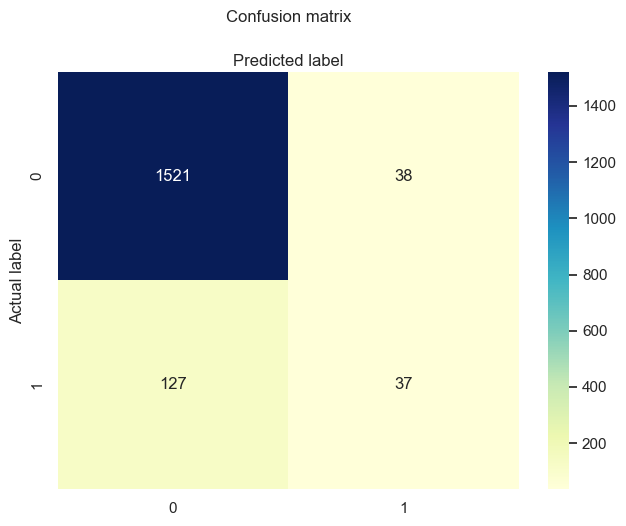

In [412]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

Text(0.5,257.44,'Predicted label');

In [413]:
from sklearn.metrics import classification_report
target_names = ['not adhered', 'adhered']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

 not adhered       0.92      0.98      0.95      1559
     adhered       0.49      0.23      0.31       164

    accuracy                           0.90      1723
   macro avg       0.71      0.60      0.63      1723
weighted avg       0.88      0.90      0.89      1723



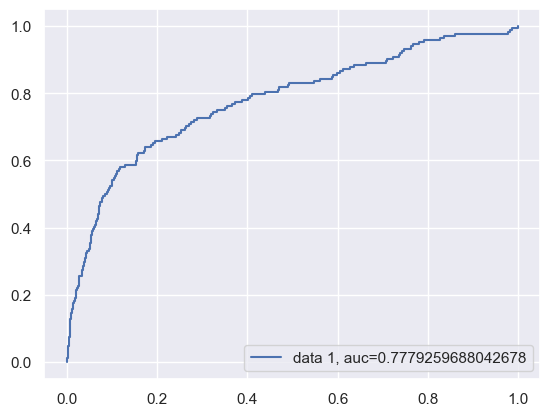

In [415]:
y_pred_proba = logreg.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()